This is the Code File for the Final Project in Network Science for Group 23

In [1]:
import pandas as pd
import networkx as nx
from networkx.algorithms.community import greedy_modularity_communities
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
from collections import Counter
import numpy as np
from scipy.stats import pearsonr, spearmanr, kendalltau
from networkx.algorithms.community.quality import modularity
import itertools
from matplotlib.lines import Line2D
import powerlaw
from scipy.special import factorial
from scipy.stats import poisson, expon
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split, GridSearchCV
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score
from scipy import stats
import re


# Data Import

In [2]:
# The Data had to be downloaded in two files to make sure it is downloaded correctly
download1 = pd.read_excel("download1.xlsx", sheet_name='Data', skiprows=[1])
download2 = pd.read_excel("download2.xlsx", sheet_name='Data', skiprows=[1])
df_complete  = pd.concat([download1, download2], ignore_index=True)
df_complete = df_complete.dropna(axis=1, how='all') # Drop all columns with all NAs
# Unnecessary Variables are deleted
df_complete = df_complete.drop(['FC_TOTAL_ASSETS_BNK!USD.1', 'FC_TOTAL_ASSETS_BNK', 'FC_ULT_PARENT_ID!USD'], axis=1)

## Data Modifications

There are two different variable sets which are needed. This is the first modification:

### 4 Category df

In [3]:
# Loading and Cleaning the dataset
def dataset_prep(df):
    # Convert 'FC_FITCH_ID' and 'Period Type' to integers
    df = df.dropna(subset=['FC_FITCH_ID'])
    df['FC_FITCH_ID'] = df['FC_FITCH_ID'].astype(int)
    df['Period Type'] = df['Period Type'].astype(int)

    #Convert FC_NET_INT_INC_BNK!USD to numeric 
    df['FC_NET_INT_INC_BNK!USD'] = pd.to_numeric(df['FC_NET_INT_INC_BNK!USD'], errors='coerce')

    #Create Ratios needed for Business Model comparison
    ##     Loan Portfolio Composition
    df['Total_Loans'] = df['FC_GROSS_LOANS_BNK!USD']


    df['Residential_Mortgage_Relative'] = df['FC_RESIDENTIAL_MORTGAGE_LOANS_BNK!USD'] / df['Total_Loans']
    df['Corporate_Commercial_Relative'] = df['FC_CORP_COMM_LOANS_BNK!USD'] / df['Total_Loans']
    df['Impaired_Customers_Relative'] = df['FC_IMPAIRED_LOANS_ADV_CUSTOMERS_BNK!USD'] / df['Total_Loans']
    df['Impaired_Banks_Relative'] = df['FC_IMPAIRED_LOANS_ADV_BANKS_BNK!USD'] / df['Total_Loans']
    df['Loans_Banks_Relative'] = df['FC_LOANS_ADV_BANKS_BNK!USD'] / df['Total_Loans']
    df['Public_Sector_Loans_Relative'] = df['FC_LOANS_PUBLIC_SECTOR_BNK!USD'] / df['Total_Loans']
    df['Consumer_Retail_Relative'] = df['FC_OTHER_CONS_RETAIL_LOANS_BNK!USD'] / df['Total_Loans']
    df['Other_Loans_Relative'] = df['FC_OTHER_LOANS_BNK!USD'] / df['Total_Loans']
    df['Check_relative'] = df[
        [
            'Residential_Mortgage_Relative', 
            'Corporate_Commercial_Relative', 
            'Impaired_Customers_Relative',
            'Impaired_Banks_Relative', 
            'Loans_Banks_Relative', 
            'Public_Sector_Loans_Relative', 
            'Consumer_Retail_Relative', 
            'Other_Loans_Relative'
        ]
    ].sum(axis=1)
    ##  Other Ratios
    df['Loans_to_Assets_Ratio'] = df['FC_GROSS_LOANS_BNK!USD'] / df['FC_TOTAL_ASSETS_BNK!USD']
    df['Equity_to_Assets_Ratio'] = df['FC_TOTAL_EQUITY_BNK!USD'] / df['FC_TOTAL_ASSETS_BNK!USD']
    df['Deposits_to_Assets_Ratio'] = (
        df['FC_DEPOSITS_BANKS_BNK!USD'].fillna(0)+ df['FC_TOTAL_CUSTOMER_DEPOSITS_BNK!USD'].fillna(0)
    ) / df['FC_TOTAL_ASSETS_BNK!USD']


    #Filter for only one Year 
    df = df[(df['Period Type'] == 2023) & (df['FC_COUNTRY_3_CD'].notna())]
    return df

# Apply the modifications
df = dataset_prep(df_complete)

# Now subset the columns and reset the index
needed_colummns = [
     # Information on the entitiy
    'FC_COMPANY_NAME', 'FC_FITCH_ID', 'Period Type', 'FC_ULT_PARENT_ID',
    # Operating enviornment
    'FC_COUNTRY_3_CD', 'FC_TOTAL_WEIGHTED_RISKS_BNK!USD', 'FC_CURR_TRANSLATION_DIFF_BNK!USD',
    # Size                                                              
    'FC_TOTAL_ASSETS_BNK!USD', 'FC_NUM_EMPLOYEES_BNK!USD', 'FC_NUM_BRANCHES_BNK!USD',
    # Business Model
    'FC_NET_INT_INC_BNK!USD', 'FC_NET_FEES_COMMISSIONS_BNK!USD', 'FC_OTHER_EARNING_ASSETS_BNK!USD', 'FC_TOTAL_EARNING_ASSETS_BNK!USD','Residential_Mortgage_Relative', 'Corporate_Commercial_Relative', 'Impaired_Customers_Relative','Impaired_Banks_Relative', 'Loans_Banks_Relative', 'Public_Sector_Loans_Relative', 'Consumer_Retail_Relative', 'Other_Loans_Relative', 'Loans_to_Assets_Ratio', 'Equity_to_Assets_Ratio', 'Deposits_to_Assets_Ratio',
    # Rating
    'FC_TIER_1_REG_CAP_RATIO_BNK!USD', 'FC_NPL_GROSS_LOANS_BNK!USD', 'FC_NET_INC_AVG_TOTAL_EQUITY_BNK!USD', 'FC_FITCH_COMP_INC_BNK!USD', 'FC_LT_IDR!USD',
    # Other
    'FC_PEER_ISSUER_IDS!USD', 'FC_PEER_ISSUER_NAMES!USD','FC_NET_LOANS_BNK!USD',
    # Used for ratio but still kept
    'FC_DEPOSITS_BANKS_BNK!USD', 'FC_TOTAL_CUSTOMER_DEPOSITS_BNK!USD'
]

df= df[needed_colummns].reset_index(drop=True).copy()


In [4]:
# Make sure each bank is only once in the Dataset - Can just lok at the Print
duplicates_with_differences = df.groupby('FC_FITCH_ID').filter(
    lambda group: len(group) > 1 and not group.drop(columns=['FC_FITCH_ID']).duplicated().all()
)
duplicates_with_differences.sort_values('FC_FITCH_ID')

nr_of_non_equal_row_pari = 0
# Iterate through each group and identify differing columns
grouped = duplicates_with_differences.groupby('FC_FITCH_ID')
for fitch_id, group in grouped:
    differing_columns = group.drop(columns=['FC_FITCH_ID']).nunique()[lambda x: x > 1].index.tolist()

    if differing_columns:
        print(f"FC_FITCH_ID: {fitch_id}")
        print(f"Differing columns: {differing_columns}")
        print(group[differing_columns])
        print("\n")
        nr_of_non_equal_row_pari += 1

print(f'There are {nr_of_non_equal_row_pari} pairs of duplicated FITCH values which are not the same across all columns')
print('Shape before deleting duplicates', df.shape)
df = df.groupby('FC_FITCH_ID', as_index=False).first()

# Display the result
print('Shape after deleting duplicates',df.shape)


FC_FITCH_ID: 1011470
Differing columns: ['FC_LT_IDR!USD']
    FC_LT_IDR!USD
102            WD
836            BB


There are 1 pairs of duplicated FITCH values which are not the same across all columns
Shape before deleting duplicates (2273, 35)
Shape after deleting duplicates (2223, 35)


Note: For the one difference we just take one of them.

### Balance sheet and income statement decomposition df

Here is the modification for the second set of variables

In [5]:
# Check if all needed variables are available
df_complete.columns = df_complete.columns.str.replace("!USD", "", regex=False)

required_columns = [
    # Base columns
    'FC_COMPANY_NAME', 'FC_FITCH_ID', 'FC_COUNTRY_3_CD', 'FC_ULT_PARENT_ID', 'FC_PEER_ISSUER_IDS', 'FC_PEER_ISSUER_NAMES',
    
    # Normalization
    'FC_TOTAL_ASSETS_BNK', 'FC_TOTAL_OPER_INC_BNK', 'FC_GROSS_LOANS_BNK', 'FC_TOTAL_EQUITY_BNK',
    
    # Asset-related columns
    'FC_CASH_DUE_BANKS_BNK', 'FC_TOTAL_SECURITIES_BNK', 'FC_REVERSE_REPOS_CASH_COLLATERAL_BNK',
    'FC_PROPERTY_DEV_LOANS_BNK', 'FC_AGRICULTURE_LOANS_BNK', 'FC_COMMERCIAL_PROPERTY_LOANS_BNK',
    'FC_MANUFACTURING_LOANS_BNK', 'FC_TOTAL_CONSUMER_LOANS_BNK', 'FC_LEASE_FINANCING_BNK',
    'FC_RESERVES_IMPAIRED_LOANS_NPL_BNK', 'FC_FIXED_ASSETS_BNK', 'FC_FORECLOSED_REAL_ESTATE_BNK',
    
    # Liability-related columns
    'FC_TOTAL_CUSTOMER_DEPOSITS_BNK', 'FC_DEPOSITS_BANKS_BNK', 'FC_REPURCHASE_AGREEMENTS_LIAB_BNK',
    'FC_TOTAL_LIAB_EQUITY_BNK',
    
    # Equity-related columns
    'FC_COMMON_EQUITY_BNK', 'FC_CORE_TIER_1_REG_CAPITAL_BNK',
    
    # Income statement-related columns
    'FC_GROSS_INT_DIV_INC_BNK', 'FC_DIV_INC_BNK', 'FC_TOTAL_NON_INT_OPER_INC_BNK', 'FC_TOTAL_INT_EXP_BNK',
    'FC_PRE_TAX_PROFIT_BNK', 'FC_PERSONNEL_EXP_BNK', 'FC_TOTAL_NON_INT_EXP_BNK',
    
    # Performance-related columns
    'FC_NET_INT_MARGIN_BNK', 'FC_NET_CHARGE_OFFS_BNK', 'FC_BASEL_III_LEV_RATIO_BNK',
    'FC_NON_OPER_ITEMS_TAXES_ANN_AVG_ASSETS_BNK', 'FC_LIQUIDITY_COVERAGE_RATIO_BNK',
    'FC_LIQUID_ASSETS_TOTAL_ASSETS_BNK'
]

# Check if these columns are present in df_2023
missing_columns = [col for col in required_columns if col not in df_complete.columns]

# Display the missing columns
print('Missing columns:',missing_columns, '\nDuplicated columns:', df_complete.columns[df_complete.columns.duplicated()].unique())

# Subset df_complete for rows where 'Period Type' is 2023 and only the required columns
df_2023 = df_complete[(df_complete['Period Type'] == 2023) & (df_complete['FC_COUNTRY_3_CD'].notna())].reset_index(drop=True)
df_2023 = df_2023[required_columns]

Missing columns: [] 
Duplicated columns: Index(['FC_ULT_PARENT'], dtype='object')


In [6]:
# Again make sure each Bank is only once available in the data
duplicates_with_differences = df_2023.groupby('FC_FITCH_ID').filter(
    lambda group: len(group) > 1 and not group.drop(columns=['FC_FITCH_ID']).duplicated().all()
)
duplicates_with_differences.sort_values('FC_FITCH_ID')

nr_of_non_equal_row_pari = 0
# Iterate through each group and identify differing columns
grouped = duplicates_with_differences.groupby('FC_FITCH_ID')
for fitch_id, group in grouped:
    differing_columns = group.drop(columns=['FC_FITCH_ID']).nunique()[lambda x: x > 1].index.tolist()

    if differing_columns:
        print(f"FC_FITCH_ID: {fitch_id}")
        print(f"Differing columns: {differing_columns}")
        print(group)
        print("\n")
        nr_of_non_equal_row_pari += 1

print(f'There are {nr_of_non_equal_row_pari} pairs of duplicated FITCH values which are not the same across all columns')
print('Shape before deleting duplicates', df_2023.shape)
df_2023 = df_2023.groupby('FC_FITCH_ID', as_index=False).first()

# Display the result
print('Shape after deleting duplicates',df_2023.shape)

There are 0 pairs of duplicated FITCH values which are not the same across all columns
Shape before deleting duplicates (2273, 41)
Shape after deleting duplicates (2223, 41)


Create the df_ML which is used for the K-means cluster network and the with an XGBoost predicted network.  
This is the Decomposition of the balance sheet and the income statement.

In [7]:
# Initialize the new dataframe with required columns
df_ML = df_2023[['FC_COMPANY_NAME', 'FC_FITCH_ID', 'FC_COUNTRY_3_CD', 'FC_ULT_PARENT_ID', 'FC_PEER_ISSUER_IDS', 'FC_PEER_ISSUER_NAMES']].copy()
# Normalization columns (needed below to make sure all variables are between 0 and 1)
df_ML['total_assets'] = df_2023['FC_TOTAL_ASSETS_BNK']
df_ML['operating_income'] = df_2023['FC_TOTAL_OPER_INC_BNK']
df_ML['GROSS_LOANS'] = df_2023['FC_GROSS_LOANS_BNK']
df_ML['equity'] = df_2023['FC_TOTAL_EQUITY_BNK']

# Balance sheet (note: FC_TOTAL_LIAB_EQUITY_BNK = FC_TOTAL_ASSETS_BNK, tested and by accounting rules)
# Asset
df_ML['A:Cash'] = df_2023['FC_CASH_DUE_BANKS_BNK']
df_ML['A:Securities'] = df_2023['FC_TOTAL_SECURITIES_BNK']
df_ML['A:Fed_Funds_Sold'] = df_2023['FC_REVERSE_REPOS_CASH_COLLATERAL_BNK'] 
df_ML['A:property_dev_loans'] = df_2023['FC_PROPERTY_DEV_LOANS_BNK']
df_ML['A:Farm_land_loans'] = df_2023['FC_AGRICULTURE_LOANS_BNK']
df_ML['A:commercial_property'] = df_2023['FC_COMMERCIAL_PROPERTY_LOANS_BNK'] #+ df_2023['FC_OTHER_COMM_PROPERTY_LOANS_BNK']
df_ML['A:manufacturing_loans'] = df_2023['FC_MANUFACTURING_LOANS_BNK']
df_ML['A:consumer_loans'] = df_2023['FC_TOTAL_CONSUMER_LOANS_BNK']
df_ML['A:lease_financing'] = df_2023['FC_LEASE_FINANCING_BNK']
df_ML['A:all_other_loans'] = (
    df_2023['FC_GROSS_LOANS_BNK'] - 
    df_ML[['A:property_dev_loans', 'A:Farm_land_loans', 'A:commercial_property', 
           'A:manufacturing_loans', 'A:consumer_loans', 'A:lease_financing']].sum(axis=1).clip(lower=0))
df_ML['A:allowance'] = df_2023['FC_RESERVES_IMPAIRED_LOANS_NPL_BNK']
df_ML['A:fixed_assets'] = df_2023['FC_FIXED_ASSETS_BNK']
df_ML['A:OREO'] = df_2023['FC_FORECLOSED_REAL_ESTATE_BNK']
df_ML['A:all_other_assets'] = df_2023['FC_TOTAL_ASSETS_BNK'] - df_2023['FC_CASH_DUE_BANKS_BNK'].fillna(0) -  df_2023['FC_TOTAL_SECURITIES_BNK'].fillna(0) - df_2023['FC_GROSS_LOANS_BNK'].fillna(0) - df_ML['A:allowance'].fillna(0) - df_ML['A:fixed_assets'].fillna(0) - df_ML['A:OREO'].fillna(0) 
# There are some columns who have a negative other assets value. 
# We kick out those rows which are very wrong below and set all_other_assets to 0 if it is below 5% of total assets
df_ML['TEST_ratio'] = df_ML['A:all_other_assets'] / df_ML['total_assets']
df_ML.loc[(df_ML['A:all_other_assets'] < 0) & (df_ML['TEST_ratio'] >= -0.05), 'A:all_other_assets'] = 0

# Liabilities
df_ML['L:core_deposits'] = df_2023['FC_TOTAL_CUSTOMER_DEPOSITS_BNK'].fillna(0) + df_2023['FC_DEPOSITS_BANKS_BNK'].fillna(0)
df_ML['L:Fed_funds_purchased'] = df_2023['FC_REPURCHASE_AGREEMENTS_LIAB_BNK']
df_ML['L:all_other_liab'] = (
    df_2023['FC_TOTAL_LIAB_EQUITY_BNK'] 
    - df_2023['FC_TOTAL_EQUITY_BNK'] 
    - df_ML[['L:core_deposits', 'L:Fed_funds_purchased']].sum(axis=1)
)


#Equity
df_ML['E:tier_1_capital'] = df_2023['FC_COMMON_EQUITY_BNK'] / df_2023['FC_CORE_TIER_1_REG_CAPITAL_BNK']
df_ML['E:all_other_equity'] = df_2023['FC_TOTAL_EQUITY_BNK'] - df_ML['E:tier_1_capital'].fillna(0)


# Income Statement
df_ML['I:Interest_inc_on_loans'] = df_2023['FC_GROSS_INT_DIV_INC_BNK'] - df_2023['FC_DIV_INC_BNK'].fillna(0)
df_ML['I:dividend_income'] = df_2023['FC_DIV_INC_BNK']
df_ML['I:non_interest_inc'] = df_2023['FC_TOTAL_NON_INT_OPER_INC_BNK'] # total non-interest income already excluded Div_income
df_ML['I:Total_int_expense'] = -df_2023['FC_TOTAL_INT_EXP_BNK'] # negative sign actually doesnt matter since we take absoulte differences later anyway and for the Boosting this is also irrelevant
# This should sum up to Operating
df_ML['I:pre_tax_profit'] = -df_2023['FC_PRE_TAX_PROFIT_BNK']
df_ML['I:personell_exp'] = df_2023['FC_PERSONNEL_EXP_BNK']
df_ML['I:other_oper_exp'] = df_2023['FC_TOTAL_NON_INT_EXP_BNK'] - df_2023['FC_PERSONNEL_EXP_BNK']
df_ML['I:impairment_and_other'] = df_2023['FC_PRE_TAX_PROFIT_BNK'] + df_2023['FC_TOTAL_OPER_INC_BNK'] - df_2023['FC_TOTAL_NON_INT_EXP_BNK']
# This should also sum up to operating

# Performance: These are performacne metrics to analyse any bank group
df_ML['P:ROA'] = df_2023['FC_PRE_TAX_PROFIT_BNK'] / df_2023['FC_TOTAL_ASSETS_BNK']
df_ML['P:NIM'] = df_2023['FC_NET_INT_MARGIN_BNK']
df_ML['P:Charge_off_Loans'] = df_2023['FC_NET_CHARGE_OFFS_BNK'] / df_2023['FC_GROSS_LOANS_BNK']
df_ML['P:E_A_ratio'] = df_2023['FC_TOTAL_EQUITY_BNK'] / df_2023['FC_TOTAL_ASSETS_BNK']
df_ML['P:Lev_ratio'] = df_2023['FC_BASEL_III_LEV_RATIO_BNK']
df_ML['P:non_perf_assets_assets'] = df_2023['FC_NON_OPER_ITEMS_TAXES_ANN_AVG_ASSETS_BNK']
df_ML['P:cash_sec_assets'] = (
    (df_2023['FC_CASH_DUE_BANKS_BNK'] + df_2023['FC_TOTAL_SECURITIES_BNK'])
    / df_2023['FC_TOTAL_ASSETS_BNK']
)
df_ML['P:liquidity_coverage'] = df_2023['FC_LIQUIDITY_COVERAGE_RATIO_BNK']
df_ML['P:liquidity_ratio'] = df_2023['FC_LIQUID_ASSETS_TOTAL_ASSETS_BNK']

In [8]:
# Some variables are not positive even though accounting rules say they should be. -> exclude them
df_ML = df_ML[df_ML['TEST_ratio'] >= -0.05]
df_ML = df_ML[df_ML['total_assets'].notna()]
df_ML = df_ML[(df_ML['I:other_oper_exp']>0)]
df_ML = df_ML[(df_ML['E:all_other_equity']>0)]

# Apply the Normalizations as described in the paper (Cyree et al. 2020)
columns_to_normalize = [col for col in df_ML.columns if col.startswith(('A:', 'L:', 'E:'))]
for col in columns_to_normalize:
    df_ML[col] = df_ML[col] / df_ML['total_assets']

columns_to_normalize = [col for col in df_ML.columns if col.startswith(('I:'))]
for col in columns_to_normalize:
    df_ML[col] = df_ML[col] / df_ML['operating_income']

# Some quick checks:
print(df_ML[[col for col in df_ML.columns if col.startswith(('A:', 'L:', 'E:', 'I:'))]].isna().sum())
print('Shape of df_ML:', df_ML.shape)

A:Cash                       13
A:Securities                106
A:Fed_Funds_Sold           1719
A:property_dev_loans       1850
A:Farm_land_loans          1779
A:commercial_property      1714
A:manufacturing_loans      1837
A:consumer_loans            249
A:lease_financing          1755
A:all_other_loans            23
A:allowance                 781
A:fixed_assets               19
A:OREO                     1717
A:all_other_assets            0
L:core_deposits               0
L:Fed_funds_purchased      1870
L:all_other_liab              0
E:tier_1_capital            502
E:all_other_equity            0
I:Interest_inc_on_loans       0
I:dividend_income           708
I:non_interest_inc            0
I:Total_int_expense           5
I:pre_tax_profit              0
I:personell_exp               0
I:other_oper_exp              0
I:impairment_and_other        0
dtype: int64
Shape of df_ML: (2127, 47)


### Same Banks in both datasets

To make sure the networks are comparable we want the same banks in all networks.

In [9]:
df_ML['FC_FITCH_ID'].nunique(), len(df_ML), df['FC_FITCH_ID'].nunique(), len(df)

(2127, 2127, 2223, 2223)

In [10]:
# Check how much of which is in the datasets
df_ml_in_df = df_ML['FC_FITCH_ID'].isin(df['FC_FITCH_ID']).sum()
print(f'Out of df_ML: {df_ml_in_df / len(df_ML) *100:.2f}% are also in df.')
df_in_df_ml = df['FC_FITCH_ID'].isin(df_ML['FC_FITCH_ID']).sum()
print(f'Out of df: {df_in_df_ml / len(df) *100:.2f}% are also in df_ML.')
df = df[df['FC_FITCH_ID'].isin(df_ML['FC_FITCH_ID'])]
df_in_df_ml = df['FC_FITCH_ID'].isin(df_ML['FC_FITCH_ID']).sum()
print(f'Out of df: {df_in_df_ml / len(df) *100:.2f}% are also in df_ML.')
print(f'Shape df: {df.shape}, Shape df_ML: {df_ML.shape}')
print(df_ML['FC_FITCH_ID'].nunique(), len(df_ML), df['FC_FITCH_ID'].nunique(), len(df))

Out of df_ML: 100.00% are also in df.
Out of df: 95.68% are also in df_ML.
Out of df: 100.00% are also in df_ML.
Shape df: (2127, 35), Shape df_ML: (2127, 47)
2127 2127 2127 2127


### FITCH - Connect network 

The credit rating agency FITCH Ratings (where we have the Data from) supplies their own peer measure. We use it to compare our results. Note: The creation of said networks is rather arbitrary. We thus provide more sophisticated ways on how to create the peer networks.  
In their provided download there is an error which makes the Peer_IDs unusable. Here we recreate them based on the company names.  

The prints are those bansk who have not been found -> these are banks which were excluded from the dataset.

In [11]:
def Fitch_peer_id_retrieval(df, names_column = 'FC_PEER_ISSUER_NAMES', ids_column = 'FC_PEER_ISSUER_IDS'):
    """
    This function retrieves the Fitch peer IDs for each company based on peer names listed in the dataset.
    It matches the `FC_PEER_ISSUER_NAMES` with `FC_COMPANY_NAME` to populate the `FITCH_peer_ids` column.

    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame containing columns:
        - `FC_FITCH_ID`: Fitch ID of the company.
        - `FC_COMPANY_NAME`: Name of the company.
        - `FC_PEER_ISSUER_NAMES`: Comma-separated list of peer company names.
        - `FC_PEER_ISSUER_IDS`: Existing Fitch peer IDs (for validation).

    Returns:
    --------
    pandas.DataFrame
        The DataFrame with an additional column `FITCH_peer_ids` populated with matched Fitch peer IDs.
    
    Comment:
    -----------
    We have to iterate over the names twice once with a split of the strings when there is no space (' ') 
    before or after the "," and a second time to allow for the space adding any new matches.
    """
    df['FITCH_peer_ids'] = ''  # Initialize a new column for Fitch peer IDs
    unmatched_peers = []  # List to track unmatched peers for debugging

    # Iterate through the rows of the DataFrame
    for index, row in df.iterrows():
        company_id = row['FC_FITCH_ID']  # Current company's Fitch ID
        company_name = row['FC_COMPANY_NAME']  # Current company's name
        peers = re.split(r',(?!\s)', str(row[names_column]))  # Split peer names into a list
        
        # Initialize a list to collect peer IDs
        peer_ids = []
        
        # Match peers with company names in the DataFrame
        for peer in peers:
            peer = peer.strip()  # Remove leading/trailing spaces
            if peer and peer != 'nan':  # Check if the peer name is valid
                # Find the matching row for the peer company
                matching_peer = df[df['FC_COMPANY_NAME'] == peer]
                if not matching_peer.empty:
                    peer_id = matching_peer.iloc[0]['FC_FITCH_ID']  # Extract the Fitch ID
                    peer_ids.append(str(peer_id))  # Add peer ID to the list
                else:
                    unmatched_peers.append(peer)  # Track unmatched peers
        
        # Join peer IDs with commas and assign to the new column
        df.at[index, 'FITCH_peer_ids'] = ','.join(peer_ids)

        # Validate and check for missing peer IDs (allow for ' ' right after ",")
        if len(str(row[ids_column]).split(',')) != len(str(row['FITCH_peer_ids']).split(',')):
            peers2 = str(row[names_column]).split(',') # Notice how this changes compared to above
            for peer in peers2:
                peer = peer.strip()
                if peer and peer != 'nan':
                    matching_peer = df[df['FC_COMPANY_NAME'] == peer]
                    if not matching_peer.empty:
                        peer_id = matching_peer.iloc[0]['FC_FITCH_ID']
                        if str(peer_id) not in peer_ids:  # Avoid duplicates
                            peer_ids.append(str(peer_id))
            df.at[index, 'FITCH_peer_ids'] = ','.join(peer_ids) # update the peer_ids column

    # Handle rows with missing peer IDs
    ids_to_check = []
    for index, row in df[df[ids_column].notna()].iterrows():
        id = row['FC_FITCH_ID']
        if pd.notna(row[ids_column]) and (row['FITCH_peer_ids'] == ''):
            ids_to_check.append(id)

    # Replace empty strings with NaN in `FITCH_peer_ids`
    df['FITCH_peer_ids'] = df['FITCH_peer_ids'].replace('', np.nan)

    # Debug: Print unmatched peer names for rows with IDs to check
    # Check: if there is any errors/ unchecked companies
    for index, row in df[df['FC_FITCH_ID'].isin(ids_to_check)].iterrows():
        print(re.split(r',(?!\s)', str(row[names_column])))
        print(str(row[names_column]).split(','))
    return df


In [12]:
# Create the FITCH_peer_ids in both datasets
df = Fitch_peer_id_retrieval(df, 
                             names_column='FC_PEER_ISSUER_NAMES!USD', 
                             ids_column= 'FC_PEER_ISSUER_IDS!USD')



['Banco de Credito del Peru S.A.', 'Banco BBVA Peru', 'Banco Internacional del Peru S.A.A. - Interbank']
['Banco de Credito del Peru S.A.', 'Banco BBVA Peru', 'Banco Internacional del Peru S.A.A. - Interbank']
['BBVA Mexico, S.A., Institucion de Banca Multiple, Grupo Financiero BBVA Mexico y subsidiarias', 'Banco de Bogota, S.A.', 'Banco Mercantil del Norte, S.A., Institucion de Banca Multiple, Grupo Financiero Banorte', 'HSBC Mexico, S. A., Institucion de Banca Multiple, Grupo Financiero HSBC', 'Banco Nacional de Costa Rica', 'Banco BAC San Jose, S.A.', 'Banco Davivienda S.A.']
['BBVA Mexico', ' S.A.', ' Institucion de Banca Multiple', ' Grupo Financiero BBVA Mexico y subsidiarias', 'Banco de Bogota', ' S.A.', 'Banco Mercantil del Norte', ' S.A.', ' Institucion de Banca Multiple', ' Grupo Financiero Banorte', 'HSBC Mexico', ' S. A.', ' Institucion de Banca Multiple', ' Grupo Financiero HSBC', 'Banco Nacional de Costa Rica', 'Banco BAC San Jose', ' S.A.', 'Banco Davivienda S.A.']
['AmB

In [13]:
df_ML = Fitch_peer_id_retrieval(df_ML)

['Banco de Credito del Peru S.A.', 'Banco BBVA Peru', 'Banco Internacional del Peru S.A.A. - Interbank']
['Banco de Credito del Peru S.A.', 'Banco BBVA Peru', 'Banco Internacional del Peru S.A.A. - Interbank']
['BBVA Mexico, S.A., Institucion de Banca Multiple, Grupo Financiero BBVA Mexico y subsidiarias', 'Banco de Bogota, S.A.', 'Banco Mercantil del Norte, S.A., Institucion de Banca Multiple, Grupo Financiero Banorte', 'HSBC Mexico, S. A., Institucion de Banca Multiple, Grupo Financiero HSBC', 'Banco Nacional de Costa Rica', 'Banco BAC San Jose, S.A.', 'Banco Davivienda S.A.']
['BBVA Mexico', ' S.A.', ' Institucion de Banca Multiple', ' Grupo Financiero BBVA Mexico y subsidiarias', 'Banco de Bogota', ' S.A.', 'Banco Mercantil del Norte', ' S.A.', ' Institucion de Banca Multiple', ' Grupo Financiero Banorte', 'HSBC Mexico', ' S. A.', ' Institucion de Banca Multiple', ' Grupo Financiero HSBC', 'Banco Nacional de Costa Rica', 'Banco BAC San Jose', ' S.A.', 'Banco Davivienda S.A.']
['AmB

These are mostly missing because we had to kick them out due to the not-available country ID. But that is okey, because they have a lot of NAs anyway.

## Some summary stats

### 4 Category data

In [14]:
# In the measure creation, we normalize the data. 
# Look at stats also for the normalized data
df_norm = df.copy()
numerical_cols = df.iloc[:,4:].select_dtypes(include=['number'])

# Normalize numerical columns (min-max scaling)
normalized_numerical = (numerical_cols - numerical_cols.min()) / (numerical_cols.max() - numerical_cols.min())
normalized_columns = normalized_numerical.columns
# Replace original numerical columns with normalized values in the DataFrame
df_norm[numerical_cols.columns] = normalized_numerical

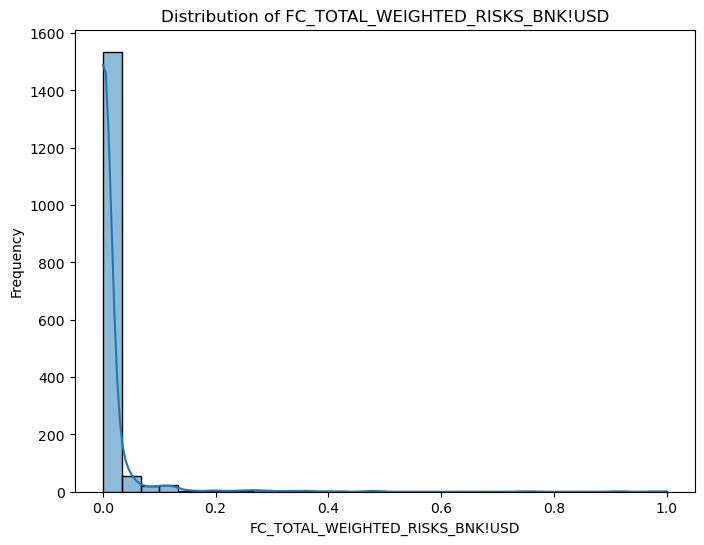

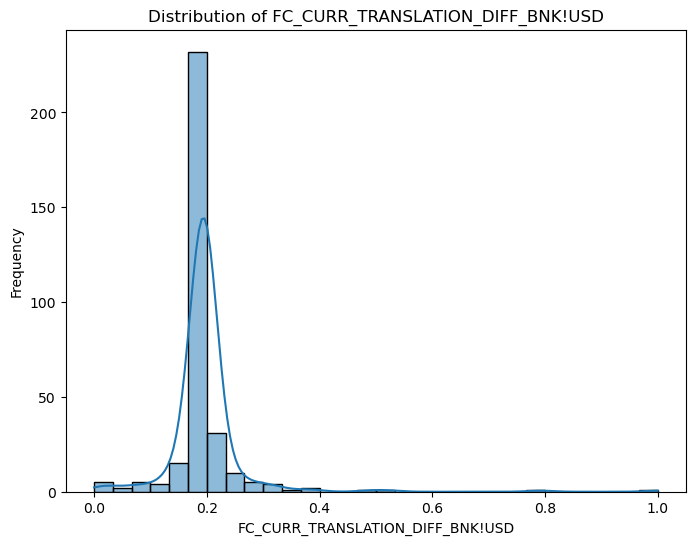

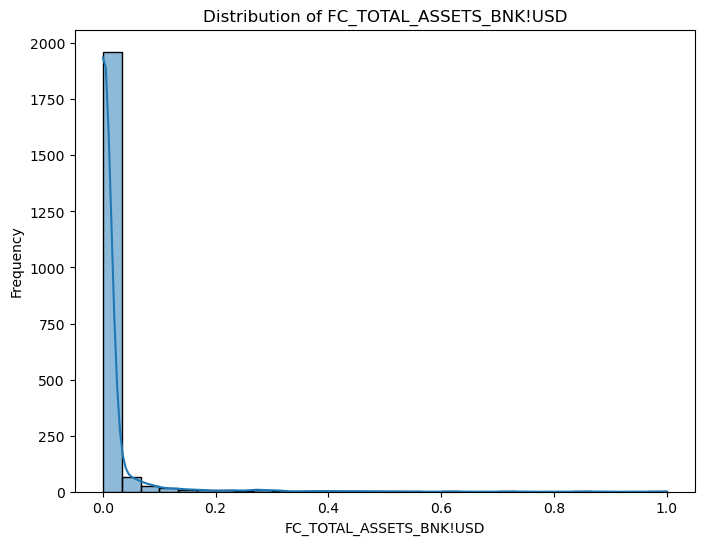

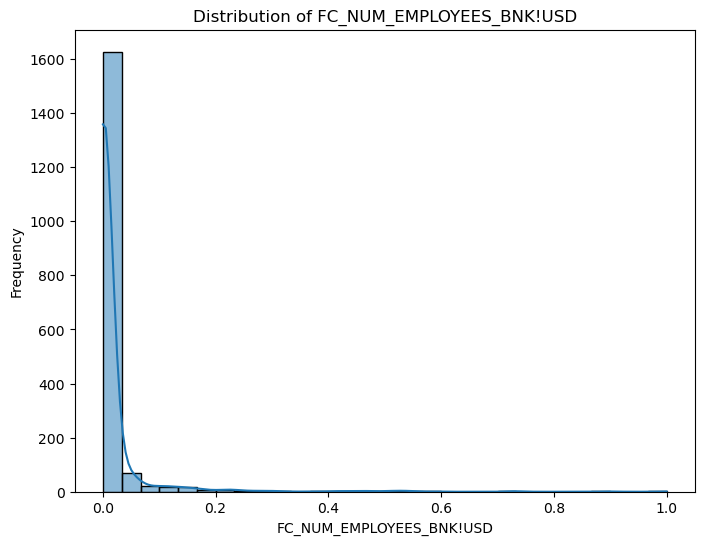

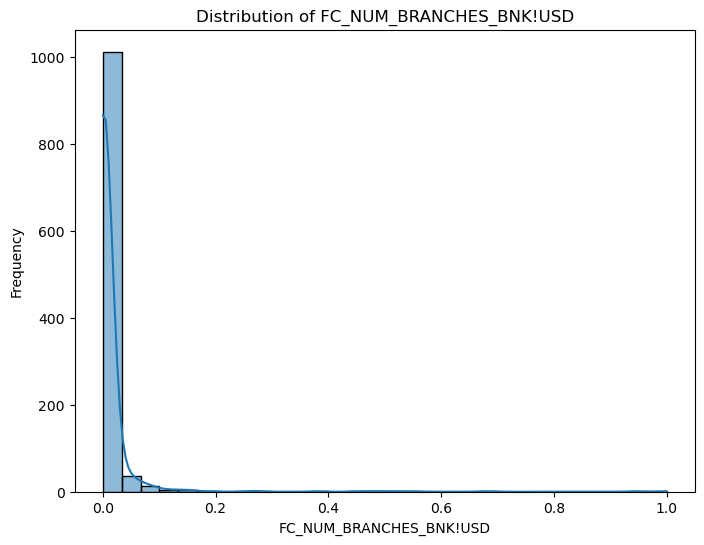

...

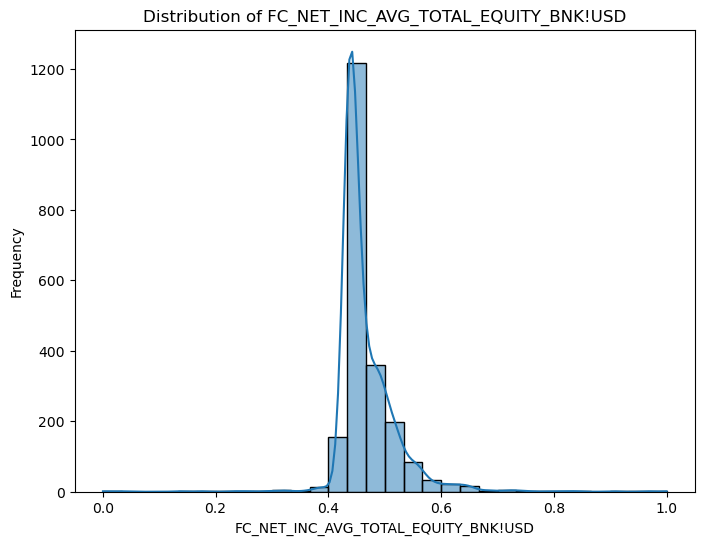

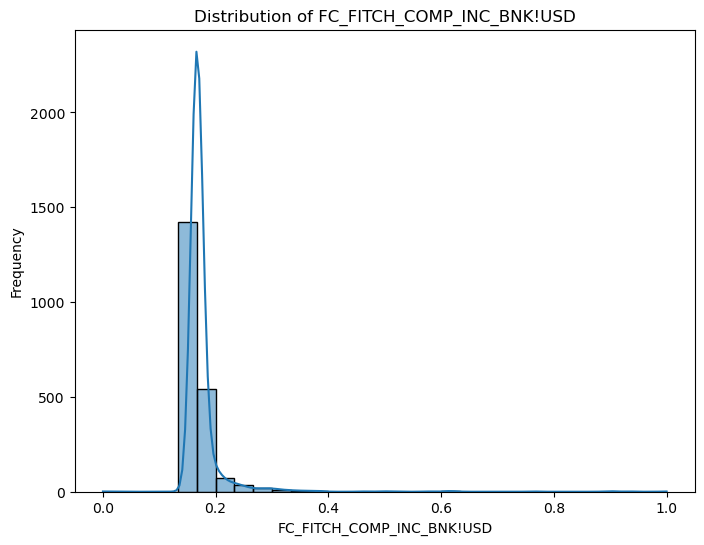

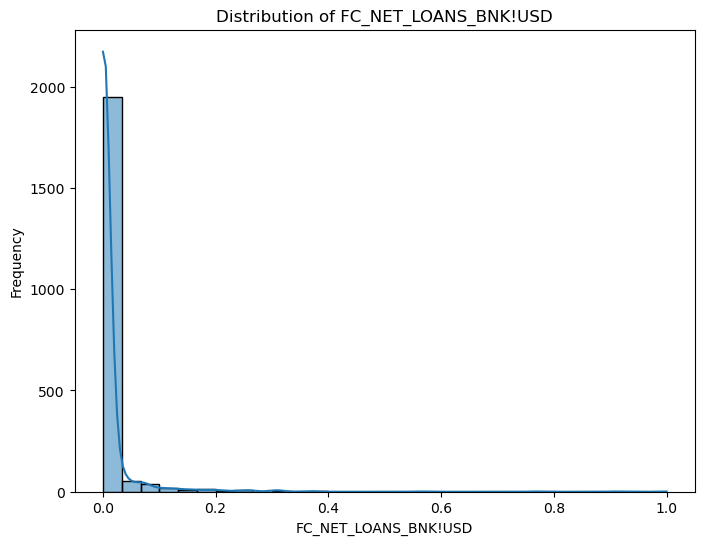

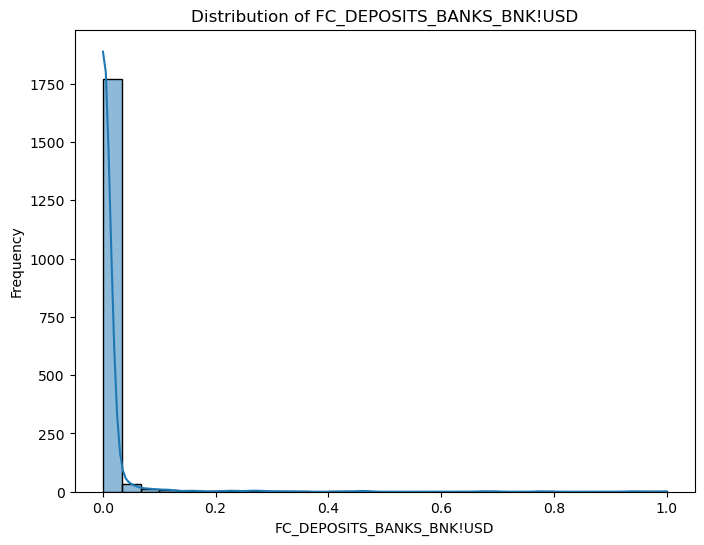

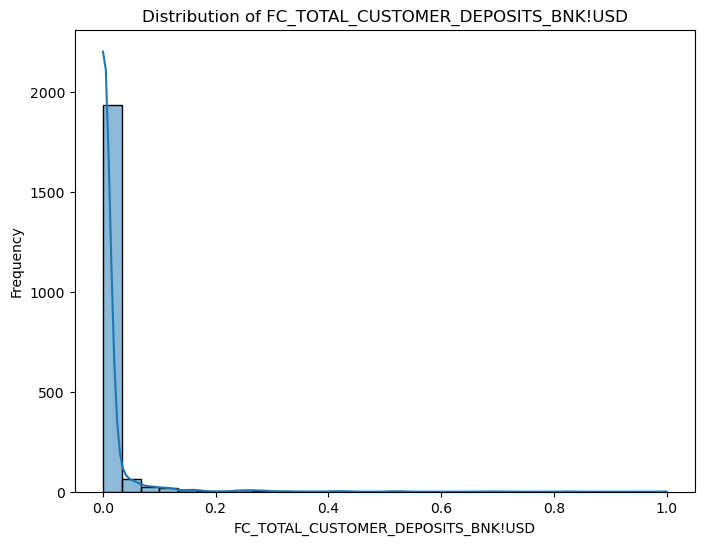

In [15]:
for col in numerical_cols:
    plt.figure(figsize=(8, 6))
    sns.histplot(df_norm[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

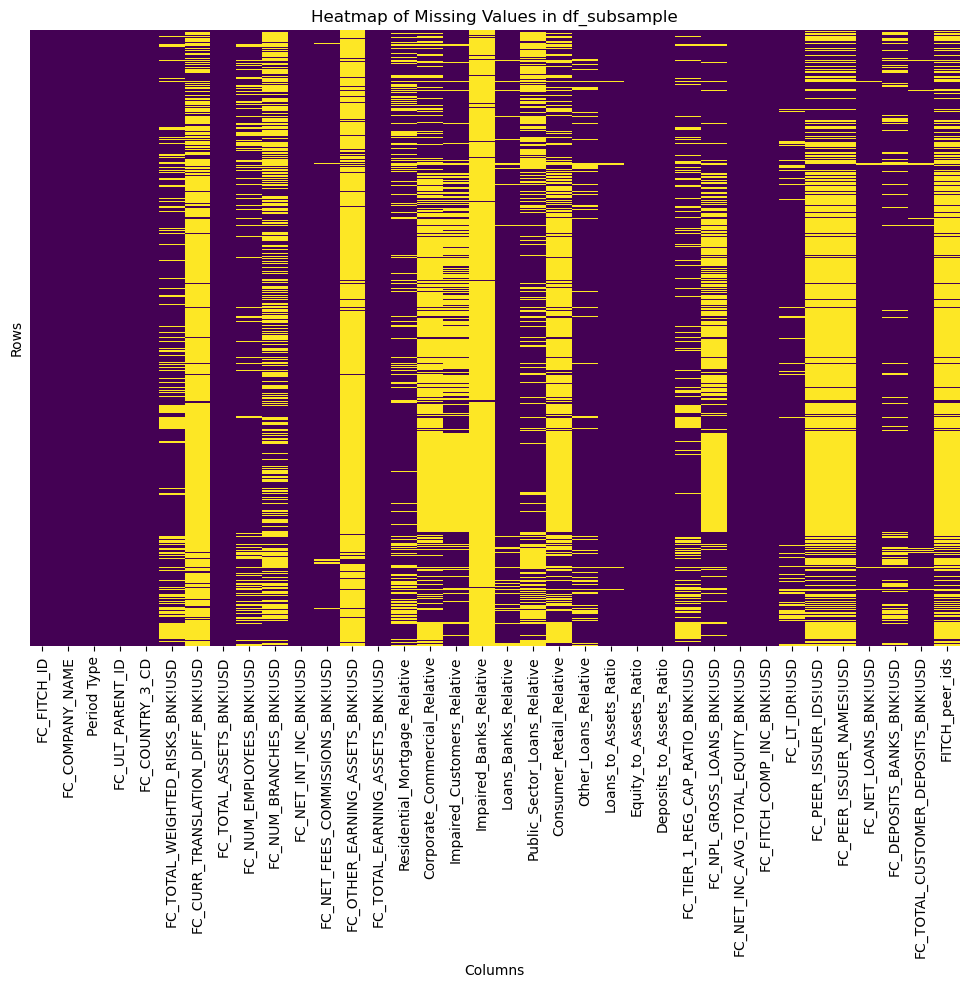

Impaired_Banks_Relative             97.132111
FC_OTHER_EARNING_ASSETS_BNK!USD     94.405266
FC_CURR_TRANSLATION_DIFF_BNK!USD    84.955336
FITCH_peer_ids                      74.800188
FC_PEER_ISSUER_NAMES!USD            73.953926
FC_PEER_ISSUER_IDS!USD              73.953926
Consumer_Retail_Relative            66.337565
Corporate_Commercial_Relative       63.328632
FC_NUM_BRANCHES_BNK!USD             49.036201
FC_NPL_GROSS_LOANS_BNK!USD          46.920545
dtype: float64

In [16]:
# Create a heatmap for missing values
plt.figure(figsize=(12, 8))
sns.heatmap(df_norm.isna(), cmap='viridis', cbar=False, yticklabels=False)
plt.title('Heatmap of Missing Values in df_subsample')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()

na_percentage = df_norm.isna().mean() * 100

# Get the top 6 columns with the most NAs
na_percentage.sort_values(ascending=False).head(10)

### Financials decomposition data

Here we do not normalise because we already did with the division by teh total assets/ operating revenue.  
Apart from some outliers all the data is between 0 and 1.

In [17]:
financials_columns = [col for col in df_ML.columns if col.startswith(('A:', 'L:', 'E:', 'I:'))]

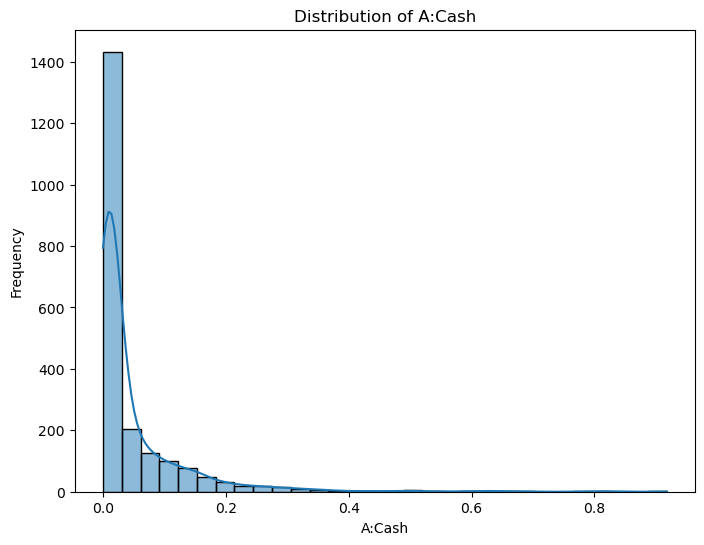

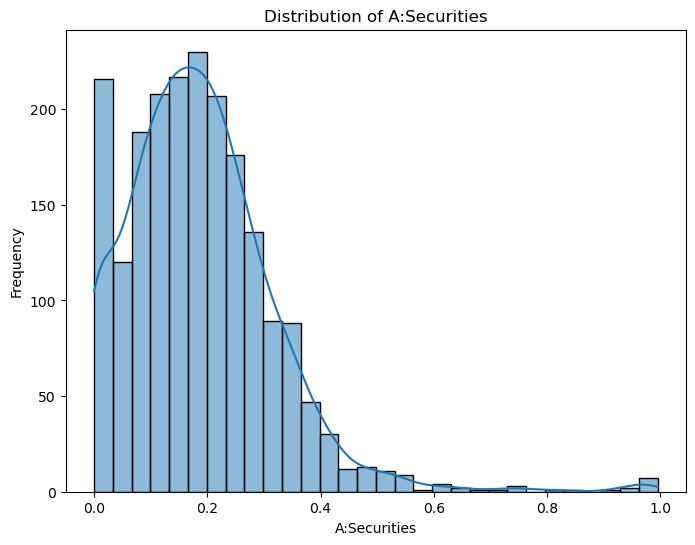

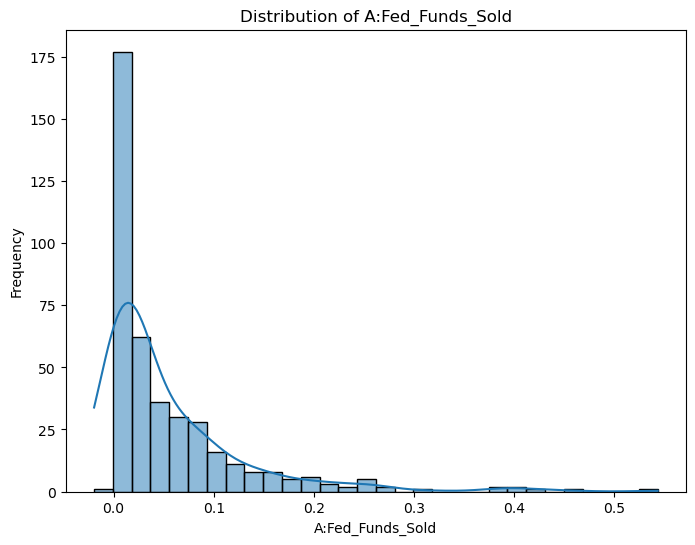

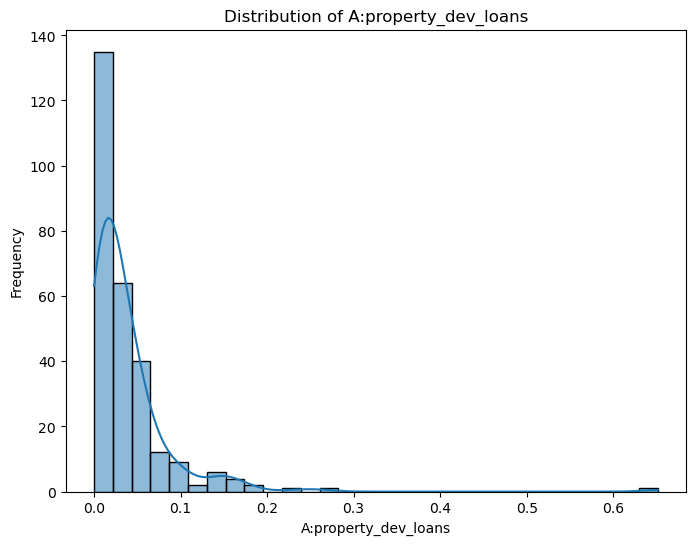

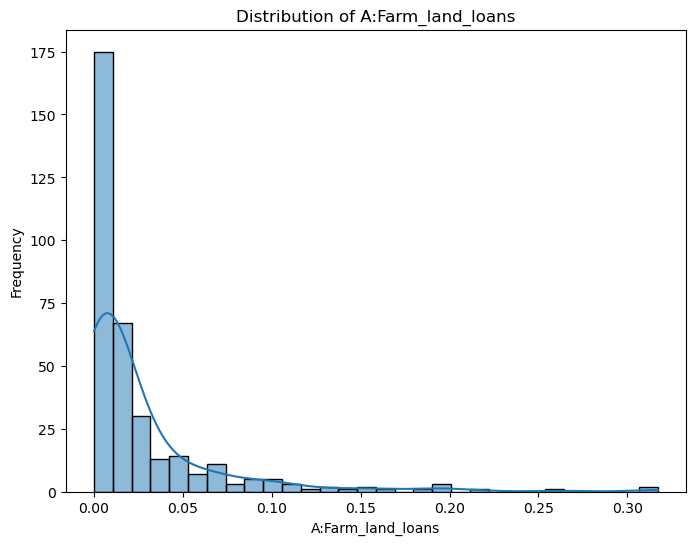

...

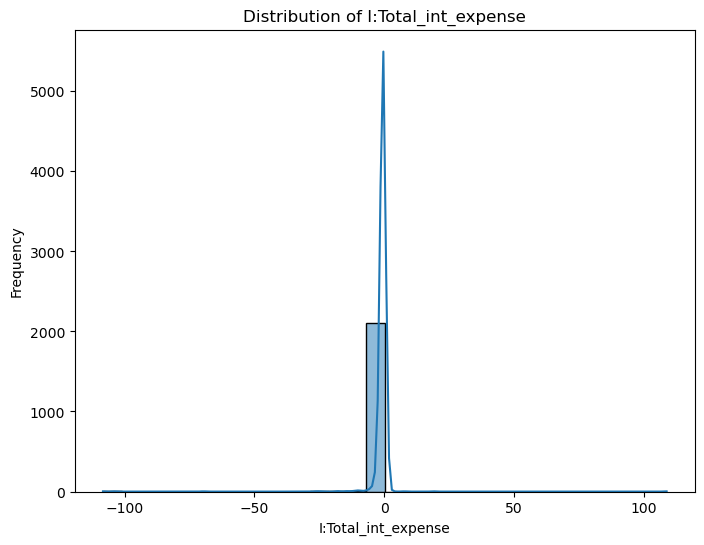

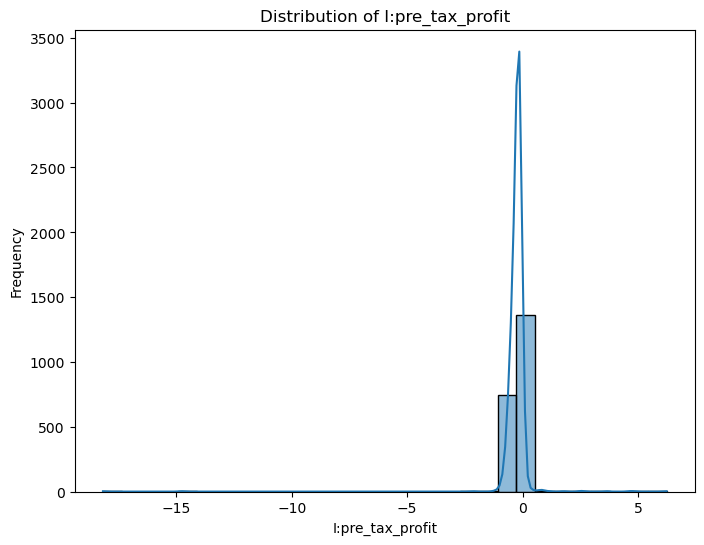

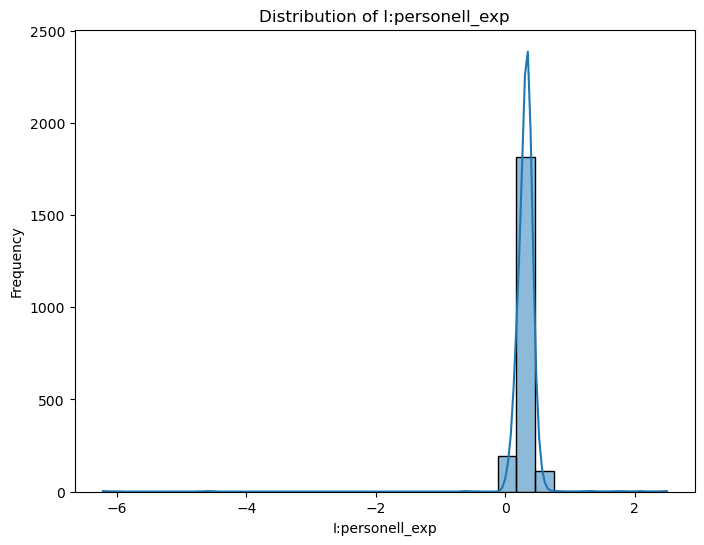

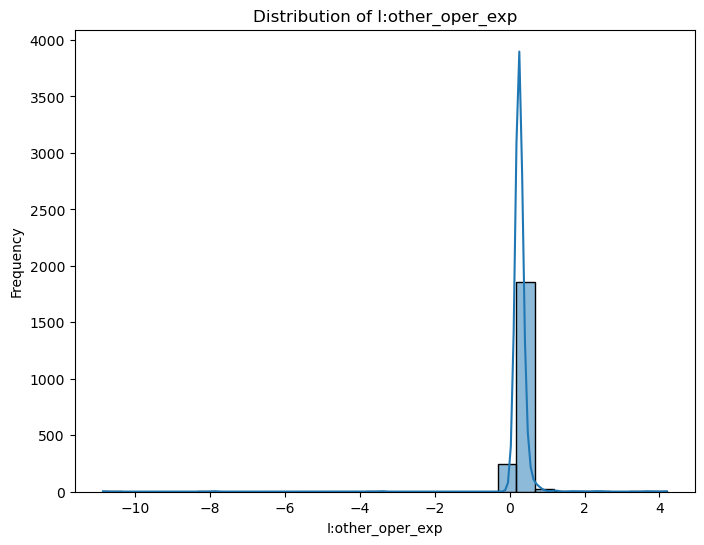

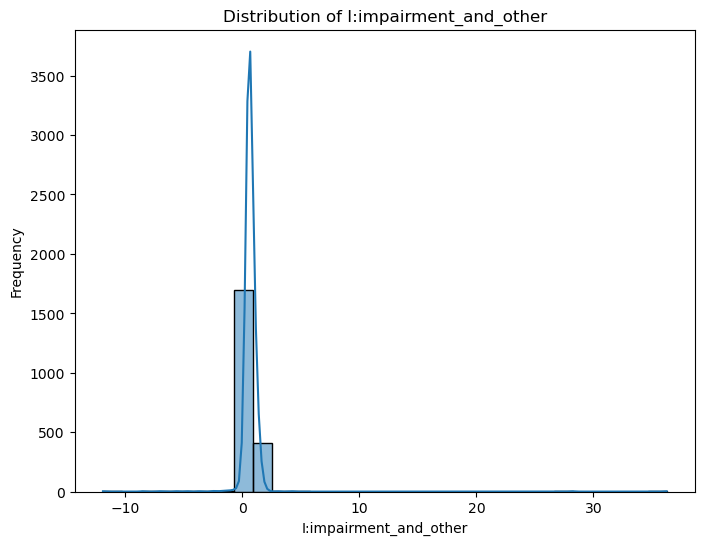

In [18]:
# Print distribution plots
for col in financials_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(df_ML[col], kde=True, bins=30)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

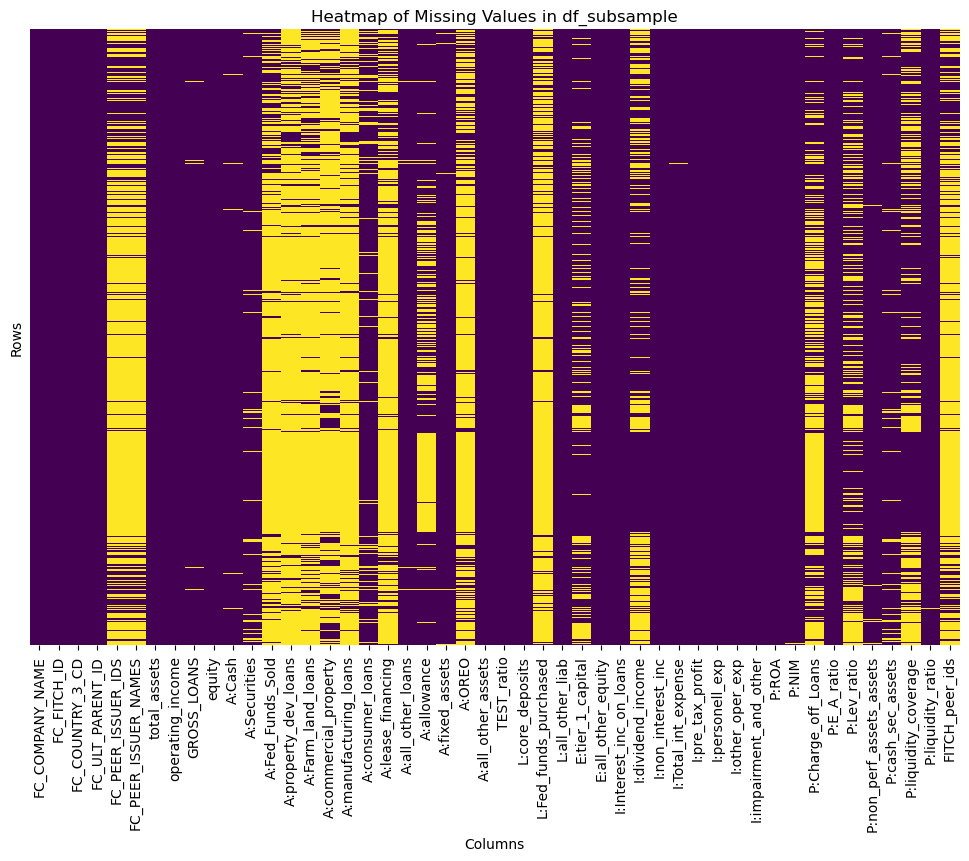

L:Fed_funds_purchased    87.917254
A:property_dev_loans     86.976963
A:manufacturing_loans    86.365773
A:Farm_land_loans        83.638928
A:lease_financing        82.510578
A:Fed_Funds_Sold         80.818054
A:OREO                   80.724024
A:commercial_property    80.582981
FITCH_peer_ids           74.800188
FC_PEER_ISSUER_NAMES     73.953926
dtype: float64

In [19]:
# Get an overview of the NAs
plt.figure(figsize=(12, 8))
sns.heatmap(df_ML.isna(), cmap='viridis', cbar=False, yticklabels=False)
plt.title('Heatmap of Missing Values in df_subsample')
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.show()

na_percentage = df_ML.isna().mean() * 100

# Get the top 6 columns with the most NAs
na_percentage.sort_values(ascending=False).head(10)

# Network creation

The Network creation subfolders are created as follows:
- General Functions
- For each of the two dfs (df and df_ML) we create various networks
- For each we have
    - Functions 
    - Creation 

All graphs are saved in a dictionary with the name and the graph.

Be aware: everythign will be saved in excels since the creation of peer measures takes quite long and we thus saved the peer lists.

In [20]:
Bank_networks = {}

## General Functions

In [21]:
def nx_graph_converter(df, peer_col='peers', company_col='FC_COMPANY_NAME', id_column='FC_FITCH_ID'):
    """
    Converts a DataFrame with peer relationships into a NetworkX graph.

    Parameters:
    ----------
    df : pandas.DataFrame
        The input DataFrame containing the peer relationship data.
    peer_col : str, optional (default='peers')
        The column name in the DataFrame that contains peer IDs as a comma-separated string.
    company_col : str, optional (default='FC_COMPANY_NAME')
        The column name in the DataFrame that contains the company names.
    id_column : str, optional (default='FC_FITCH_ID')
        The column name in the DataFrame that contains the unique company IDs.

    Returns:
    -------
    networkx.Graph
        A NetworkX graph object where:
        - Each node represents a company, identified by its unique ID.
        - Edges represent peer relationships between companies.

    Notes:
    -----
    - Peer IDs in `peer_col` must be comma-separated and convertible to integers.
    - If a peer ID is invalid (not convertible to an integer), it will be skipped.
    - The graph includes all companies from the DataFrame as nodes, regardless of whether they have peers.
    """
    # Create the graph based on peer relationships (all observations)
    G = nx.Graph()
    peer_data = df[[id_column, company_col, peer_col]]

    # Add nodes and edges to the graph
    for _, row in peer_data.iterrows():
        company_id = row[id_column]
        company_name = row[company_col]
        peers = str(row[peer_col]).split(',') if pd.notna(row[peer_col]) else []
        
        # Add company node
        G.add_node(company_id, name=company_name)
        
        # Add edges for peers
        for peer in peers:
            try:
                peer_id = int(peer)
                G.add_edge(company_id, peer_id)
            except ValueError:
                pass  # Skip if peer is not a valid integer
    
    return G


In [22]:


def simple_graph(G, title,no_0_degree = False):
    """
    This function creates a simple Graph.
    no_0_degree: Graph is restricted to nodes with degree at least 1.
    """
    if no_0_degree:
        # Filter out nodes with degree 0
        G = G.subgraph([node for node, degree in G.degree() if degree > 0]).copy()

    plt.figure(figsize=(6, 6))  # Set the figure size
    pos = nx.spring_layout(G)  # Use spring layout for better visualization
    nx.draw(
        G,
        pos,
        with_labels=False,
        node_size=5,
        node_color='skyblue',
        font_size=8,
        font_color='black',
        edge_color='gray'
    )
    plt.title(f"Peer Relationship Graph: {title}")
    plt.show()

In [23]:
#Function to quickly check the distribution of weighted sums
def dist_of_weighted_sums(weighted_sums_df, threshold, col = 'Weighted_Sum', lower = 0, upper = 10):
    plt.figure(figsize=(8, 6))
    sns.kdeplot(weighted_sums_df[(weighted_sums_df[col] >= lower) & (weighted_sums_df[col]<= upper)][col], fill = False, color = 'red')
    plt.axvline(x=threshold, color='green', linestyle='--', label=f'Threshold = {threshold}')
    plt.title('Distribution of Weighted Sums')
    plt.xlabel('Weighted Sum')  # Replace 'col' with the appropriate label
    plt.ylabel('Density')
    plt.legend()
    plt.show()
    print('Number of Pairs plotted:', len(weighted_sums_df))

## FITCH network

Here we create the network based on the existing peer sets given by the Fitch ratings agency.

In [24]:
# The Fitch network:
G_fitch = nx_graph_converter(df, 
                             peer_col='FITCH_peer_ids', 
                             company_col='FC_COMPANY_NAME', 
                             id_column='FC_FITCH_ID')
# Add the network to the dictionary
ID_Peer = df[['FC_FITCH_ID', 'FITCH_peer_ids']]
Bank_networks['Fitch peers'] = {
        'Graph': G_fitch,
        'ID_Peer': ID_Peer
    }

ID_Peer.to_excel('Peers/G_fitch.xlsx', index=False)

print(f"Number of nodes: {G_fitch.number_of_nodes()}")
print(f"Number of edges: {G_fitch.number_of_edges()}")

Number of nodes: 2127
Number of edges: 1806


## 4 Category style

Here do a number of different forlmulations/ weightings and thresholds to look at differences and choose the best one.

### Simple Country and Parent Company network

Baseline approach: not really needed but important to see how many edges should maximally be made in the category networks.  

Logic of the network: If the bank operates (is situated) in the same country or one is the parent company of the other, we have an edge.

#### Function

In [25]:
def country_parent(df, output_column='peers', id_column='FC_FITCH_ID'):
    """
    This function creates a peer columns which contains peers made by the following criteria:

    Criteria:
    ...........
    - Same country: if two banks are situated in the same country, they are peers.
    - Parent company: if one bank is the parent of the other it is a peer.
    """
    data = df.reset_index(drop=True).copy()  
    data[output_column] = ""
    for i in range(len(data)):
        current_row = data.iloc[i]
        current_id = current_row[id_column]
        similar_ids = []
        for j in range(i + 1, len(data)):
            comparison_row = data.iloc[j]
            comparison_id = comparison_row[id_column]

            if comparison_row['FC_COUNTRY_3_CD'] == current_row['FC_COUNTRY_3_CD']:
                similar_ids.append(str(comparison_id))
            elif comparison_row['FC_ULT_PARENT_ID'] == current_id:
                similar_ids.append(str(comparison_id))
            elif current_row['FC_ULT_PARENT_ID'] == comparison_id:
                similar_ids.append(str(comparison_id))
        data.at[i, output_column] = ",".join(similar_ids)
    return data

#### Application

The application is always the same
- data: includes the measure
- G_XXX: contains the nx graph
- ID_Peer: save the peer sets in an excel for later

In [26]:
data = country_parent(df, output_column = 'cntry_prnt_peer',  id_column = 'FC_FITCH_ID')
G_country_parent = nx_graph_converter(data, peer_col = 'cntry_prnt_peer',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
# Add the network to the dictionary
ID_Peer = data[['FC_FITCH_ID', 'cntry_prnt_peer']]
Bank_networks['Country Parent'] = {
    'Graph': G_country_parent,
    'ID_Peer': ID_Peer
    }
ID_Peer.to_excel('Peers/G_country_parent.xlsx', index=False)

### 4 Category Network (different Thresholds)

Create a network based on 4 categories:
- Operating Environment
- Size
- Business Model
- Rating

Calculation:  
Each of the 4 categories as a number of variables. We weight the different variables as follows:
- All 4 categories have similar weight of 25%
- Within each category, the variables are inversely weighted by the percentage of missing values in said variable. This helps to mitigate the problem that availability of certain variables decides if two countries are peers. 
Aggregate weight:
- Normalization: normalize each variable with min/max to make sure they are all between 0 and 1
- For each pair:
    - Numerical column: variable_weight * 1 - |value_1 - value_2|  (_1: first bank, _2: second bank). Since the variables are normalized the second part is between 0 and 1 and if they are the same, the whole weight of that varialbe is used.
    - non-numerical column: variable_weight if value_1 = value_2 (assign total variable weight if the values are the same)
    - Add the weights of each variable/column -> sum of the weights.
- Threshold: Now a pair is classified as 'peers' if the sum of the weights is larger than a given threshold.  
We use different Threshold to compare our results.  

**NOTE**: We check how bad the NAs skew the result by applying a KNNimputer and look at the graph again. Because it could be that our network is just a network of data availability.

#### Function (and comparison dictionary)

In [25]:
# Equal weighting
# Each category 25%
# Within Category, equal weights
comparison_details = [
    # Operating Environment
    ('FC_COUNTRY_3_CD', 'equal', 0.0833),  # Country code
    ('FC_TOTAL_WEIGHTED_RISKS_BNK!USD', 'int', 0.0833),  # Country risk indices
    ('FC_CURR_TRANSLATION_DIFF_BNK!USD', 'int', 0.0833),  # Currency translation differences

    # Business Model
        ## Loan Portfolio Composition
    ('Residential_Mortgage_Relative', 'int', 0.0167),  # Residential mortgage loans relative
    ('Corporate_Commercial_Relative', 'int', 0.0167),  # Corporate and commercial loans relative
    ('Impaired_Customers_Relative', 'int', 0.0167),  # Impaired loans to customers relative
    ('Impaired_Banks_Relative', 'int', 0.0167),  # Impaired loans to banks relative
    ('Loans_Banks_Relative', 'int', 0.0167),  # Loans to banks relative
    ('Public_Sector_Loans_Relative', 'int', 0.0167),  # Loans to public sector relative
    ('Consumer_Retail_Relative', 'int', 0.0167),  # Other consumer loans relative
    ('Other_Loans_Relative', 'int', 0.0167),  # Other loans relative
        ## Other Business Model Metrics
    ('FC_NET_INT_INC_BNK!USD', 'int', 0.0167),  # Net interest income
    ('FC_NET_FEES_COMMISSIONS_BNK!USD', 'int', 0.0167),  # Net fees and commissions
    ('FC_OTHER_EARNING_ASSETS_BNK!USD', 'int', 0.0167),  # Other earning assets
    ('FC_TOTAL_EARNING_ASSETS_BNK!USD', 'int', 0.0167),  # Total earning assets
    ('Loans_to_Assets_Ratio', 'int', 0.0167),  # Loans/Asset Ratio
    ('Equity_to_Assets_Ratio', 'int', 0.0167),  # Equity/Asset Ratio
    ('Deposits_to_Assets_Ratio', 'int', 0.0167),  # Deposits/Asset Ratio
   
    # Size
    ('FC_TOTAL_ASSETS_BNK!USD', 'int',  0.0833),  # Total assets
    ('FC_NUM_EMPLOYEES_BNK!USD', 'int',  0.0833),  # Number of employees
    ('FC_NUM_BRANCHES_BNK!USD', 'int',  0.0833),  # Number of branches

    # Credit Ratings
    ('FC_TIER_1_REG_CAP_RATIO_BNK!USD', 'int', 0.05),  # Tier 1 capital ratio
    ('FC_NPL_GROSS_LOANS_BNK!USD', 'int', 0.05),  # Non-performing loans/gross loans
    ('FC_NET_INC_AVG_TOTAL_EQUITY_BNK!USD', 'int', 0.05),  # ROAE
    ('FC_FITCH_COMP_INC_BNK!USD', 'int', 0.05),  # Comprehensive income
    ('FC_LT_IDR!USD', 'equal', 0.05)  # Long-term issuer default rating
]


# Second weighting list based on NAs in each column

# Define categories for comparison details
categories = {
    "Operating Environment": comparison_details[:3],
    "Business Model": comparison_details[3:18],
    "Size": comparison_details[18:21],
    "Credit Ratings": comparison_details[21:]
}

# Calculate NA percentages in each column
na_percentages = df.isna().mean() * 100  # Percent of NAs per column

# Initialize results
category_results = {}

for category, details in categories.items():
    columns = [col for col, _, _ in details]
    
    # Calculate NA percentages for the category
    category_na_percentages = na_percentages[columns]

    # Calculate inverse proportion of NA for each column within the category
    total_na_in_category = category_na_percentages.sum()
    if total_na_in_category > 0:
        inv_prop_na =1- category_na_percentages / total_na_in_category
    else:
        inv_prop_na = pd.Series(0, index=columns)  # No NAs in category
    # Get total inverse proabilities 
    total_na_prop = inv_prop_na.sum()
    # weights are proportional to inv proportion of Nas and sum upt to 1
    weights = inv_prop_na/total_na_prop

    category_results[category] = pd.DataFrame({
        "Column": columns,
        "Weight": weights,
        "NA_Percentage": category_na_percentages,
        "Proportion_NA_in_Category": inv_prop_na
    })
    print(weights.sum())


# Create the new list
comparison_details_NA_weights = []
for_print = []
for category, result in category_results.items():
    for _, row in result.iterrows():
        column = row['Column']
        weight = row['Weight']*0.25  # Use the updated normalized weight
        na_percentage = row['NA_Percentage']
        na_percentage_in_cat = row['Proportion_NA_in_Category']
        mode = [detail[1] for detail in categories[category] if detail[0] == column][0]
        comparison_details_NA_weights.append((column, mode, weight))
        for_print.append((column, mode, round(weight,3), round(na_percentage,3), round(na_percentage_in_cat,3)))

comparison_details_NA_weights

1.0
1.0
1.0
1.0


[('FC_COUNTRY_3_CD', 'equal', 0.125),
 ('FC_TOTAL_WEIGHTED_RISKS_BNK!USD', 'int', 0.09946059004843681),
 ('FC_CURR_TRANSLATION_DIFF_BNK!USD', 'int', 0.02553940995156319),
 ('Residential_Mortgage_Relative', 'int', 0.016962953943563362),
 ('Corporate_Commercial_Relative', 'int', 0.015294435481416091),
 ('Impaired_Customers_Relative', 'int', 0.01595841831298895),
 ('Impaired_Banks_Relative', 'int', 0.013926516696599797),
 ('Loans_Banks_Relative', 'int', 0.017666889896806794),
 ('Public_Sector_Loans_Relative', 'int', 0.016443563361845912),
 ('Consumer_Retail_Relative', 'int', 0.01517267358680101),
 ('Other_Loans_Relative', 'int', 0.017493759702900978),
 ('FC_NET_INT_INC_BNK!USD', 'int', 0.017857142857142856),
 ('FC_NET_FEES_COMMISSIONS_BNK!USD', 'int', 0.01780387202824876),
 ('FC_OTHER_EARNING_ASSETS_BNK!USD', 'int', 0.014036863413594714),
 ('FC_TOTAL_EARNING_ASSETS_BNK!USD', 'int', 0.017855240327539497),
 ('Loans_to_Assets_Ratio', 'int', 0.017813384676265562),
 ('Equity_to_Assets_Ratio', 

In [26]:
def normalized_country_cond(df, comparison_details=comparison_details,p_c_cond = True ,output_column='peers', threshold=0, parent_id='FC_ULT_PARENT_ID', id_column='FC_FITCH_ID'):
    """
    Generates a list of peers for each entity in the DataFrame based on normalized numerical columns and specified conditions.

    Parameters:
    -----------
    df : pandas.DataFrame
        The input DataFrame containing the data.
    numerical_cols : pandas.DataFrame
        Numerical columns to be normalized and used in similarity calculations.
    comparison_details : list of tuples, optional
        A list of tuples specifying the columns to compare, the mode ('int' or 'equal'), and the weight for each column.
        Default is 'comparison_details'.
    output_column : str, optional
        The name of the column where the list of peers will be stored. Default is 'peers'.
    threshold : float, optional
        The minimum weighted similarity score required to consider two entities as peers. Default is 0.
    parent_id : str, optional
        The column name representing the parent ID of the entity. Default is 'FC_ULT_PARENT_ID'.
    id_column : str, optional
        The column name representing the unique ID of the entity. Default is 'FC_FITCH_ID'.

    Returns:
    --------
    non_norm_data : pandas.DataFrame
        The original DataFrame with the 'output_column' added, containing peers' IDs as comma-separated strings.
    data : pandas.DataFrame
        The DataFrame with normalized numerical columns and the 'output_column' added.
    weighted_sums_df : pandas.DataFrame
        A DataFrame containing the weighted similarity scores between entities. Columns are:
        - 'Row1_ID': The ID of the first entity.
        - 'Row2_ID': The ID of the second entity.
        - 'Weighted_Sum': The calculated weighted similarity score.

    Notes:
    ------
    - The function normalizes the specified numerical columns using min-max scaling.
    - Entities with the same parent ID are automatically considered peers with a maximum similarity score.
    - Entities from different countries (as indicated by 'FC_COUNTRY_3_CD') are not considered peers unless they share the same parent ID.
    - The similarity between entities is calculated based on the weighted sum of differences in normalized numerical columns and equality checks for categorical columns.
    - Only entities with a weighted similarity score above the specified threshold are considered peers.
    - The function iterates over all pairs of entities to compute similarity, which may be time-consuming for large datasets.

    """
    columns_for_network = [item[0] for item in comparison_details]
    data = df.reset_index(drop=True).copy() # Reset index so iteration works properly
    non_norm_data = data
    numerical_cols = data[columns_for_network].select_dtypes(include=['number'])
    # Normalize numerical columns (min-max scaling) to make sure all values are between 0 and 1
    normalized_numerical = (numerical_cols - numerical_cols.min()) / (numerical_cols.max() - numerical_cols.min())
    normalized_columns = normalized_numerical.columns
    # Replace original numerical columns with normalized values in the DataFrame
    data[numerical_cols.columns] = normalized_numerical
    # Initialize the output column
    data[output_column] = ""
    non_norm_data[output_column] = ""
    weighted_sums_df = []
    # Iterate through each row (current ID)
    for i in range(len(data)):
        current_row = data.iloc[i]
        current_id = current_row[id_column]
        similar_ids = []

        for j in range(i + 1, len(data)):
            comparison_row = data.iloc[j]
            weighted_sum = 0

            if p_c_cond == True:
                if current_id == comparison_row[parent_id]:
                    # Entities where one is the parent of the other are considered peers
                    weighted_sum += 1

                elif current_row[parent_id] == comparison_row[id_column]:
                    # Entities where one is the parent of the other are considered peers
                    weighted_sum += 1
                elif current_row['FC_COUNTRY_3_CD'] != comparison_row['FC_COUNTRY_3_CD']:
                    # Entities from different countries are not considered peers
                    weighted_sum = 0
                else:
                    # Compute weighted similarity based on specified details
                    for col, mode, weight in comparison_details:
                        if col in normalized_columns:
                            # For numerical columns, calculate weighted difference
                            if pd.notna(current_row[col]) and pd.notna(comparison_row[col]):
                                weighted_sum += weight * (1 - abs(current_row[col] - comparison_row[col]))
                        elif mode == 'equal':
                            # For categorical columns, check for exact equality
                            if current_row[col] == comparison_row[col]:
                                weighted_sum += weight
                        else:
                            # Placeholder for interval-based logic or other comparison modes
                            print(col)
                # Store the weighted sum for this pair
                weighted_sums_df.append({
                    'Row1_ID': current_row[id_column],
                    'Row2_ID': comparison_row[id_column],
                    'Weighted_Sum': weighted_sum
                })
                # Check if weighted sum exceeds the threshold
                if weighted_sum > threshold:
                    similar_ids.append(str(comparison_row[id_column]))
            if p_c_cond == False:
                # Compute weighted similarity based on specified details
                for col, mode, weight in comparison_details:
                    if col in normalized_columns:
                        # For numerical columns, calculate weighted difference
                        if pd.notna(current_row[col]) and pd.notna(comparison_row[col]):
                            weighted_sum += weight * (1 - abs(current_row[col] - comparison_row[col]))
                    elif mode == 'equal':
                        # For categorical columns, check for exact equality
                        if current_row[col] == comparison_row[col]:
                            weighted_sum += weight
                    else:
                        # Placeholder for interval-based logic or other comparison modes
                        print(col)
                # Store the weighted sum for this pair
                weighted_sums_df.append({
                    'Row1_ID': current_row[id_column],
                    'Row2_ID': comparison_row[id_column],
                    'Weighted_Sum': weighted_sum
                })
                # Check if weighted sum exceeds the threshold
                if weighted_sum > threshold:
                    similar_ids.append(str(comparison_row[id_column]))


        # Join the similar IDs as a comma-separated string
        data.at[i, output_column] = ",".join(similar_ids)
        non_norm_data.at[i, output_column] = ",".join(similar_ids)
    # Convert the list of weighted sums to a DataFrame
    weighted_sums_df = pd.DataFrame(weighted_sums_df)
    return non_norm_data, data, weighted_sums_df

def weighted_by_std(df, comparison_details=comparison_details,p_c_cond = True ,output_column='peers', threshold=0, parent_id='FC_ULT_PARENT_ID', id_column='FC_FITCH_ID'):
    """
    This is the same function as above but we weight the absolute difference with the standard deviation of the respective column. 

    """
    data = df
    # Initialize the output column
    data[output_column] = ""
    weighted_sums_df = []
    # Iterate through each row (current ID)
    for i in range(len(data)):
        current_row = data.iloc[i]
        current_id = current_row[id_column]
        similar_ids = []

        for j in range(i + 1, len(data)):
            comparison_row = data.iloc[j]
            weighted_sum = 0

            if p_c_cond == True:
                if current_id == comparison_row[parent_id]:
                    # Entities where one is the parent of the other are considered peers
                    weighted_sum += 1

                elif current_row[parent_id] == comparison_row[id_column]:
                    # Entities where one is the parent of the other are considered peers
                    weighted_sum += 1
                elif current_row['FC_COUNTRY_3_CD'] != comparison_row['FC_COUNTRY_3_CD']:
                    # Entities from different countries are not considered peers
                    weighted_sum = 0
                else:
                    # Compute weighted similarity based on specified details
                    for col, mode, weight, scale in comparison_details:
                        if col in normalized_columns:
                            # For numerical columns, calculate weighted difference
                            if pd.notna(current_row[col]) and pd.notna(comparison_row[col]):
                                weighted_sum += weight * (1 - min(abs(current_row[col] - comparison_row[col]) / scale, 1))
                        elif mode == 'equal':
                            # For categorical columns, check for exact equality
                            if current_row[col] == comparison_row[col]:
                                weighted_sum += weight
                        else:
                            # Placeholder for interval-based logic or other comparison modes
                            print(col)
                # Store the weighted sum for this pair
                weighted_sums_df.append({
                    'Row1_ID': current_row[id_column],
                    'Row2_ID': comparison_row[id_column],
                    'Weighted_Sum': weighted_sum
                })
                # Check if weighted sum exceeds the threshold
                if weighted_sum > threshold:
                    similar_ids.append(str(comparison_row[id_column]))
            if p_c_cond == False:
                # Compute weighted similarity based on specified details
                for col, mode, weight in comparison_details:
                    if col in normalized_columns:
                        # For numerical columns, calculate weighted difference
                        if pd.notna(current_row[col]) and pd.notna(comparison_row[col]):
                            weighted_sum += weight * (1 - abs(current_row[col] - comparison_row[col]))
                    elif mode == 'equal':
                        # For categorical columns, check for exact equality
                        if current_row[col] == comparison_row[col]:
                            weighted_sum += weight
                    else:
                        # Placeholder for interval-based logic or other comparison modes
                        print(col)
                # Store the weighted sum for this pair
                weighted_sums_df.append({
                    'Row1_ID': current_row[id_column],
                    'Row2_ID': comparison_row[id_column],
                    'Weighted_Sum': weighted_sum
                })
                # Check if weighted sum exceeds the threshold
                if weighted_sum > threshold:
                    similar_ids.append(str(comparison_row[id_column]))


        # Join the similar IDs as a comma-separated string
        data.at[i, output_column] = ",".join(similar_ids)
     
    # Convert the list of weighted sums to a DataFrame
    weighted_sums_df = pd.DataFrame(weighted_sums_df)
    idk = 'change in function'
    return idk, data, weighted_sums_df



#### Application

##### With NAs

Apply the function/ create network with the data which has NANs.

We have also checked other threshholds but we keep only 99 and 98 percentile in.  If you go lower, there are much more connections which would not reflect the characteristics of the interbank network as it is described in the literature. 

Below you also find the difference weighted by the std. but the results doesnt change much so we stick with the non weighted approach.

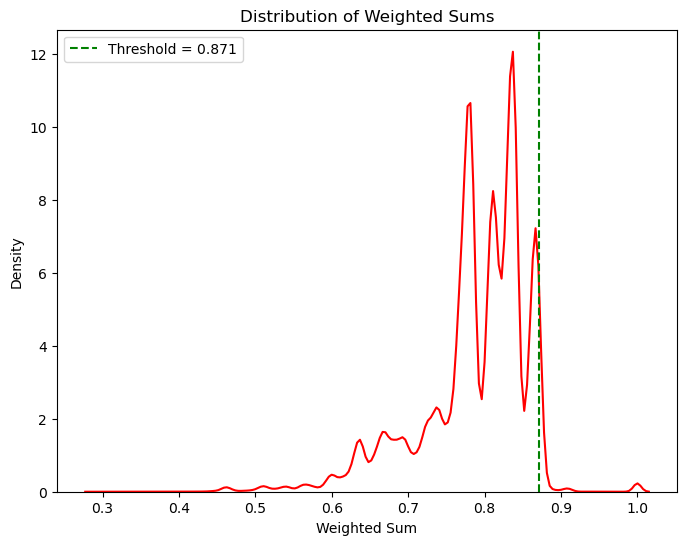

Number of Pairs plotted: 2261001
Number of nodes: 2127
Number of edges: 11836


In [29]:
# Threshold: 98 percentile, 
# Weights: NA weighted, 
# NAS: not filled
threshold = 0.871
non_norm_data, data, weighted_sums_df_4_cat_98_NAw = normalized_country_cond(df,
                                                                comparison_details = comparison_details_NA_weights, 
                                                                output_column = '4_cat_98_NAw', 
                                                                threshold = threshold, 
                                                                parent_id = 'FC_ULT_PARENT_ID', 
                                                                id_column = 'FC_FITCH_ID')
# Print distribution fo weights
dist_of_weighted_sums(weighted_sums_df_4_cat_98_NAw, threshold, col = 'Weighted_Sum', lower = 0.1, upper = 10)

# Create the NX Graph and add it to the Dictionary
G_thresh_98 = nx_graph_converter(data, peer_col = '4_cat_98_NAw',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
print(f"Number of nodes: {G_thresh_98.number_of_nodes()}")
print(f"Number of edges: {G_thresh_98.number_of_edges()}")
ID_Peer = data[['FC_FITCH_ID', '4_cat_98_NAw']]
Bank_networks['4_cat_thresh_98_naweighted'] = {
    'Graph': G_thresh_98,
    'ID_Peer': ID_Peer
    }


ID_Peer.to_excel('Peers/4_cat_thresh_98_naweighted.xlsx', index=False)

In [30]:
A = weighted_sums_df_4_cat_98_NAw[weighted_sums_df_4_cat_98_NAw['Weighted_Sum']>0]
percentile = np.percentile(A['Weighted_Sum'], 98)
print(f'The 98-precentile is at a threshold of: {percentile:.3f}')

The 98-precentile is at a threshold of: 0.871


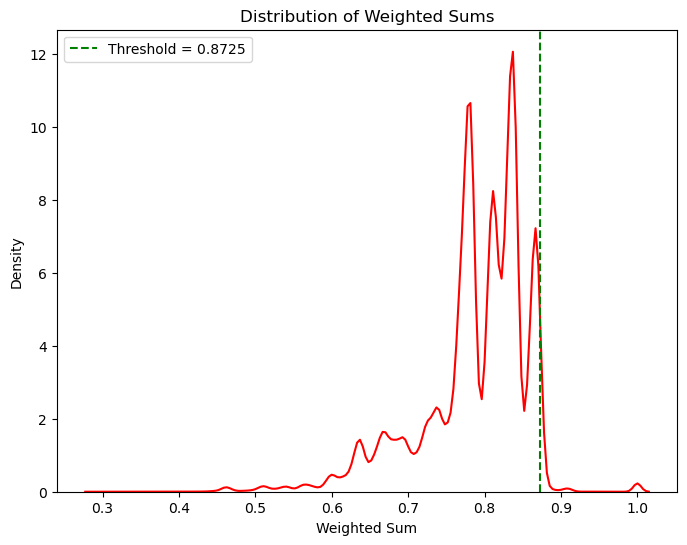

Number of Pairs plotted: 2261001
Number of nodes: 2127
Number of edges: 6094


In [31]:
# Threshold: 99-percentile,  
# Weights: NA weighted, 
# NAS: not filled
threshold = 0.8725
non_norm_data, data, weighted_sums_df_4_cat_thresh_99_naweighted = normalized_country_cond(df,
                                                                comparison_details = comparison_details_NA_weights, 
                                                                output_column = '4_cat_99_NAw', 
                                                                threshold = threshold, 
                                                                parent_id = 'FC_ULT_PARENT_ID', 
                                                                id_column = 'FC_FITCH_ID')
# Print distribution fo weights
dist_of_weighted_sums(weighted_sums_df_4_cat_thresh_99_naweighted, threshold, col = 'Weighted_Sum', lower = 0.1, upper = 10)

# Create the NX Graph and add it to the Dictionary
G_thresh_99 = nx_graph_converter(data, peer_col = '4_cat_99_NAw',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
ID_Peer = data[['FC_FITCH_ID', '4_cat_99_NAw']]
print(f"Number of nodes: {G_thresh_99.number_of_nodes()}")
print(f"Number of edges: {G_thresh_99.number_of_edges()}")
Bank_networks['4_cat_thresh_99_naweighted'] = {
    'Graph': G_thresh_99,
    'ID_Peer': ID_Peer
    }

ID_Peer.to_excel('Peers/4_cat_thresh_99_naweighted.xlsx', index=False)

In [32]:
A = weighted_sums_df_4_cat_thresh_99_naweighted[weighted_sums_df_4_cat_thresh_99_naweighted['Weighted_Sum']>0]
percentile = np.percentile(A['Weighted_Sum'], 99)
print(f'The 99-precentile is at a threshold of: {percentile:.3f}')

The 99-precentile is at a threshold of: 0.873


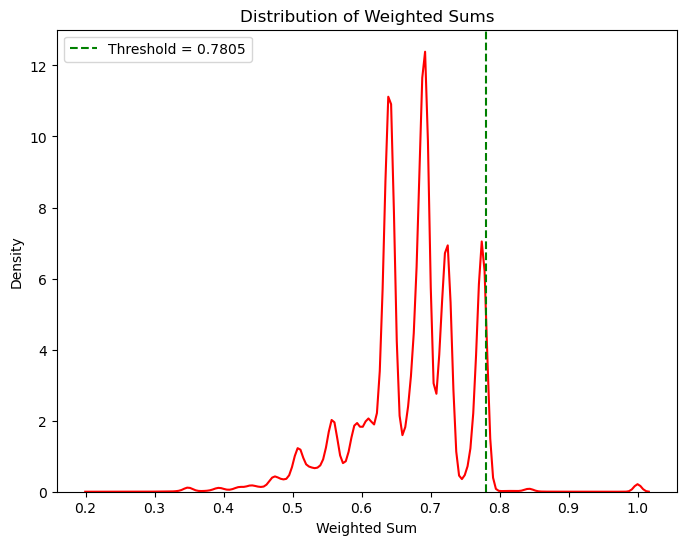

Number of Pairs plotted: 2261001
Number of nodes: 2127
Number of edges: 5353


In [33]:
# Threshold: 99-percentile 
# Weights within category: equal weighted, 
# NAS: not filled
threshold = 0.7805
non_norm_data, data, weighted_sums_df_4_cat_99_Ew = normalized_country_cond(df, 
                                                                comparison_details = comparison_details, 
                                                                output_column = '4_cat_99_Ew', 
                                                                threshold = threshold, 
                                                                parent_id = 'FC_ULT_PARENT_ID', 
                                                                id_column = 'FC_FITCH_ID')
# Print distribution fo weights
dist_of_weighted_sums(weighted_sums_df_4_cat_99_Ew, threshold, col = 'Weighted_Sum', lower = 0.1, upper = 10)

# Create the NX Graph and add it to the Dictionary
G_thresh_99_equ = nx_graph_converter(data, peer_col = '4_cat_99_Ew',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
ID_Peer = data[['FC_FITCH_ID', '4_cat_99_Ew']]
print(f"Number of nodes: {G_thresh_99_equ.number_of_nodes()}")
print(f"Number of edges: {G_thresh_99_equ.number_of_edges()}")
Bank_networks['4_cat_thresh_99_equweighted'] = {
    'Graph': G_thresh_99_equ,
    'ID_Peer': ID_Peer
    }

ID_Peer.to_excel('Peers/4_cat_thresh_99_equweighted.xlsx', index=False)

In [34]:
A = weighted_sums_df_4_cat_99_Ew[weighted_sums_df_4_cat_99_Ew['Weighted_Sum']>0]
percentile = np.percentile(A['Weighted_Sum'], 99)
print(f'The 99-precentile is at a threshold of: {percentile:.4f}')

The 99-precentile is at a threshold of: 0.7805


##### NAs imputed

We impute the NAs here to see if the non-available data has a large impact on the distribution and node creation (it did not).  
We later use the one which doesnt impute the values as we dont want to make any assumptions for this network.

In [35]:
# Standard Scale and apply Imputing with KNN, n = 2
comparison_cols = [item[0] for item in comparison_details]
Imputed_data = df.copy()

# Standard scaling and imputing only numerical columns in `comparison_cols`
numerical_cols = Imputed_data[comparison_cols].select_dtypes(include=['number']).columns

# Step 1: Standard Scale
scaler = StandardScaler()
Imputed_data[numerical_cols] = scaler.fit_transform(Imputed_data[numerical_cols])

# Step 2: Apply KNN Imputer
imputer = KNNImputer(n_neighbors=2)
Imputed_data[numerical_cols] = imputer.fit_transform(Imputed_data[numerical_cols])

# Step 3: Reverse Scaling
Imputed_data[numerical_cols] = scaler.inverse_transform(Imputed_data[numerical_cols])


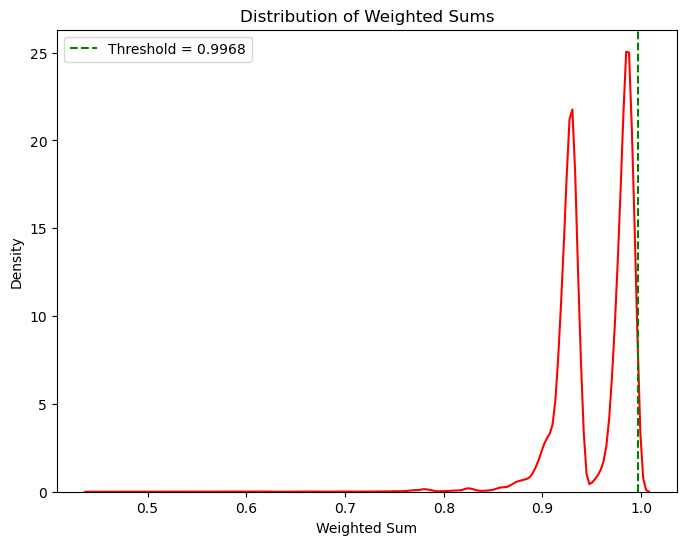

Number of Pairs plotted: 2261001
Number of nodes: 2127
Number of edges: 5319


In [36]:
# Threshold: 99 percentile
# Weights: NA weighted, 
# NAS: Imputed (KNN, N = 2)
threshold = 0.9968
non_norm_data, data, weighted_sums_df_4_cat_99_NAw_IMP = normalized_country_cond(Imputed_data,
                                                                comparison_details = comparison_details_NA_weights, 
                                                                output_column = '4_cat_99_NAw_IMP', 
                                                                threshold = threshold, 
                                                                parent_id = 'FC_ULT_PARENT_ID', 
                                                                id_column = 'FC_FITCH_ID')
# Print distribution fo weights
dist_of_weighted_sums(weighted_sums_df_4_cat_99_NAw_IMP, threshold, col = 'Weighted_Sum', lower = 0.1, upper = 10)

# Create the NX Graph and add it to the Dictionary
G_thresh_099_naIMP = nx_graph_converter(data, peer_col = '4_cat_99_NAw_IMP',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
ID_Peer = data[['FC_FITCH_ID', '4_cat_99_NAw_IMP']]
print(f"Number of nodes: {G_thresh_099_naIMP.number_of_nodes()}")
print(f"Number of edges: {G_thresh_099_naIMP.number_of_edges()}")
Bank_networks['4_cat_thresh_99_naweighted_NAIMP'] = {
    'Graph': G_thresh_099_naIMP,
    'ID_Peer': ID_Peer
    }

ID_Peer.to_excel('Peers/4_cat_thresh_99_naweighted_NAIMP.xlsx', index=False)

In [37]:
A = weighted_sums_df_4_cat_99_NAw_IMP[weighted_sums_df_4_cat_99_NAw_IMP['Weighted_Sum']>0]

percentile = np.percentile(A['Weighted_Sum'], 99)
print(f'The 99-precentile is at a threshold of: {percentile:.4f}')

The 99-precentile is at a threshold of: 0.9968


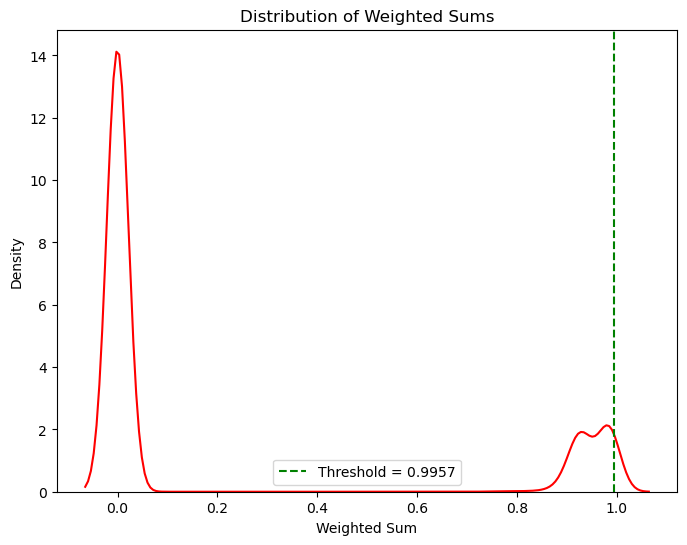

Number of Pairs plotted: 2261001
Number of nodes: 2127
Number of edges: 10622


In [38]:
# Threshold: 98-percentile
# Weights: NA weighted, 
# NAS: Imputed (KNN, N = 2)
threshold = 0.9957
non_norm_data, data, weighted_sums_df_4_cat_98_NAw_IMP = normalized_country_cond(Imputed_data,
                                                                comparison_details = comparison_details_NA_weights, 
                                                                output_column = '4_cat_98_NAw_IMP', 
                                                                threshold = threshold, 
                                                                parent_id = 'FC_ULT_PARENT_ID', 
                                                                id_column = 'FC_FITCH_ID')
# Print distribution fo weights
dist_of_weighted_sums(weighted_sums_df_4_cat_98_NAw_IMP, threshold, col = 'Weighted_Sum', lower = 0, upper = 1)

# Create the NX Graph and add it to the Dictionary
G_thresh_098_naIMP = nx_graph_converter(data, peer_col = '4_cat_98_NAw_IMP',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
ID_Peer = data[['FC_FITCH_ID', '4_cat_98_NAw_IMP']]
print(f"Number of nodes: {G_thresh_098_naIMP.number_of_nodes()}")
print(f"Number of edges: {G_thresh_098_naIMP.number_of_edges()}")
Bank_networks['4_cat_thresh_98_naweighted_NAIMP'] = {
    'Graph': G_thresh_098_naIMP,
    'ID_Peer': ID_Peer
    }

ID_Peer.to_excel('Peers/4_cat_thresh_98_naweighted_NAIMP.xlsx', index=False)

In [39]:
A = weighted_sums_df_4_cat_98_NAw_IMP[weighted_sums_df_4_cat_98_NAw_IMP['Weighted_Sum']>0]
percentile = np.percentile(A['Weighted_Sum'], 98)
print(f'The 98-precentile is at a threshold of: {percentile:.4f}')


The 98-precentile is at a threshold of: 0.9957


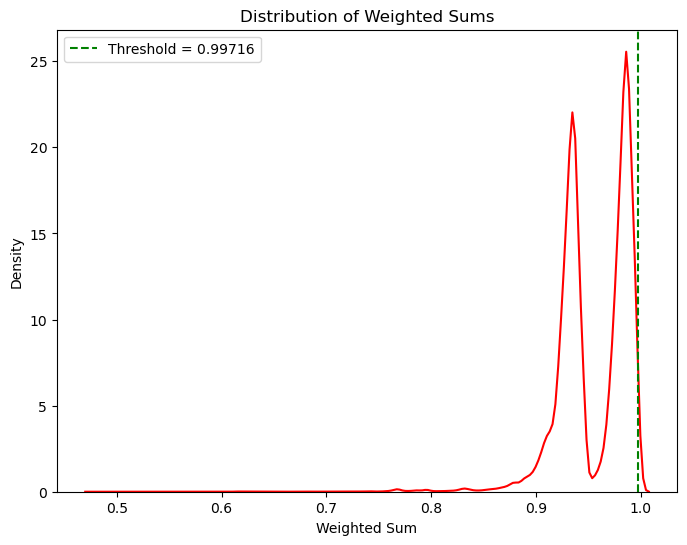

Number of Pairs plotted: 2261001
Number of nodes: 2127
Number of edges: 5182


In [40]:
# Threshold: 99-percentile
# Weights within category: equal weighted, 
# NAS: Imputed (KNN, N = 2)
threshold = 0.99716
non_norm_data, data, weighted_sums_df_4_cat_99_Ew_IMP = normalized_country_cond(Imputed_data,
                                                                comparison_details = comparison_details, 
                                                                output_column = '4_cat_99_Ew_IMP', 
                                                                threshold = threshold, 
                                                                parent_id = 'FC_ULT_PARENT_ID', 
                                                                id_column = 'FC_FITCH_ID')
# Print distribution fo weights
dist_of_weighted_sums(weighted_sums_df_4_cat_99_Ew_IMP, threshold, col = 'Weighted_Sum', lower = 0.1, upper = 10)

# Create the NX Graph and add it to the Dictionary
G_thresh_099_equ_naIMP = nx_graph_converter(data, peer_col = '4_cat_99_Ew_IMP',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
ID_Peer = data[['FC_FITCH_ID', '4_cat_99_Ew_IMP']]
print(f"Number of nodes: {G_thresh_099_equ_naIMP.number_of_nodes()}")
print(f"Number of edges: {G_thresh_099_equ_naIMP.number_of_edges()}")
Bank_networks['4_cat_thresh_99_equweighted_NAIMP'] = {
    'Graph': G_thresh_099_equ_naIMP,
    'ID_Peer': ID_Peer
    }
ID_Peer.to_excel('Peers/4_cat_thresh_99_equweighted_NAIMP.xlsx', index=False)

In [41]:
A = weighted_sums_df_4_cat_99_Ew_IMP[weighted_sums_df_4_cat_99_Ew_IMP['Weighted_Sum']>0]
np.percentile(A['Weighted_Sum'], 99)
percentile = np.percentile(A['Weighted_Sum'], 99)
print(f'The 99-precentile is at a threshold of: {percentile:.4f}')

The 99-precentile is at a threshold of: 0.9971


##### Weighted by Std

To check if the absolute difference should be scaled we do that here.
It doesnt seem to matter.   
(We use again inverse NA percentages to weight the variables in categories)

In [29]:
# Normalize ande calculate std devs to weight the difference
columns_for_network = [item[0] for item in comparison_details]
data = df.reset_index(drop=True).copy() # Reset index so iteration works properly
non_norm_data = data
numerical_cols = data[columns_for_network].select_dtypes(include=['number'])
# Normalize numerical columns (min-max scaling) to make sure all values are between 0 and 1
normalized_numerical = (numerical_cols - numerical_cols.min()) / (numerical_cols.max() - numerical_cols.min())
normalized_columns = normalized_numerical.columns
# Replace original numerical columns with normalized values in the DataFrame
data[numerical_cols.columns] = normalized_numerical


# Compute standard deviation for each numerical column
std_devs = data.select_dtypes(include='number').std()

# Add the standard deviation to the list
updated_comparison_details = []
for variable, data_type, weight in comparison_details_NA_weights:
    if data_type == 'equal':
        std_value = np.nan  # Assign NaN for 'equal'
    else:
        # Get the standard deviation if the variable exists in the DataFrame
        std_value = std_devs.get(variable, np.nan)  # Default to NaN if column is not in df
    # Append the updated tuple
    updated_comparison_details.append((variable, data_type, weight, std_value))

# Convert to a DataFrame or leave as a list for further use
comparison_details_df = pd.DataFrame(updated_comparison_details, columns=['Variable', 'Type', 'Weight', 'StdDev'])


print(updated_comparison_details)

[('FC_COUNTRY_3_CD', 'equal', 0.125, nan), ('FC_TOTAL_WEIGHTED_RISKS_BNK!USD', 'int', 0.09946059004843681, 0.05606065505739665), ('FC_CURR_TRANSLATION_DIFF_BNK!USD', 'int', 0.02553940995156319, 0.07381981262724639), ('Residential_Mortgage_Relative', 'int', 0.016962953943563362, 0.2564803156410134), ('Corporate_Commercial_Relative', 'int', 0.015294435481416091, 0.2689040968175769), ('Impaired_Customers_Relative', 'int', 0.01595841831298895, 0.04806756358498958), ('Impaired_Banks_Relative', 'int', 0.013926516696599797, 0.12825514565403395), ('Loans_Banks_Relative', 'int', 0.017666889896806794, 0.022231212656749214), ('Public_Sector_Loans_Relative', 'int', 0.016443563361845912, 0.07162458742269869), ('Consumer_Retail_Relative', 'int', 0.01517267358680101, 0.21553318593588228), ('Other_Loans_Relative', 'int', 0.017493759702900978, 0.3212271465704983), ('FC_NET_INT_INC_BNK!USD', 'int', 0.017857142857142856, 0.0650146049982483), ('FC_NET_FEES_COMMISSIONS_BNK!USD', 'int', 0.01780387202824876,

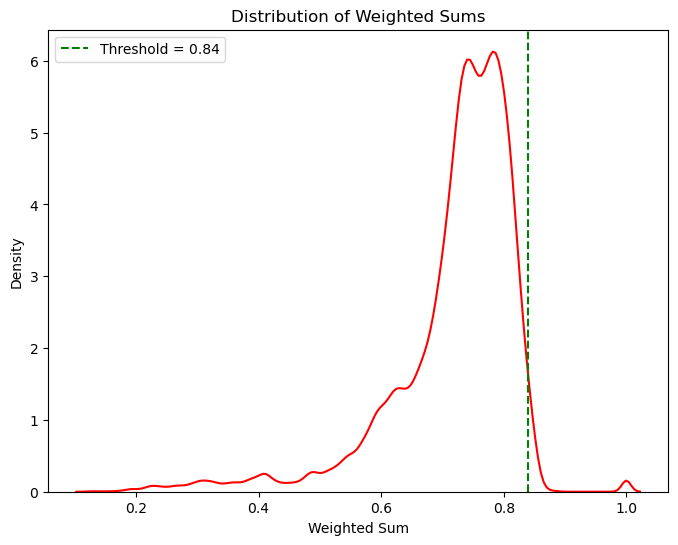

Number of Pairs plotted: 2261001
Number of nodes: 2127
Number of edges: 10528
The 98-precentile is at a threshold of: 0.840


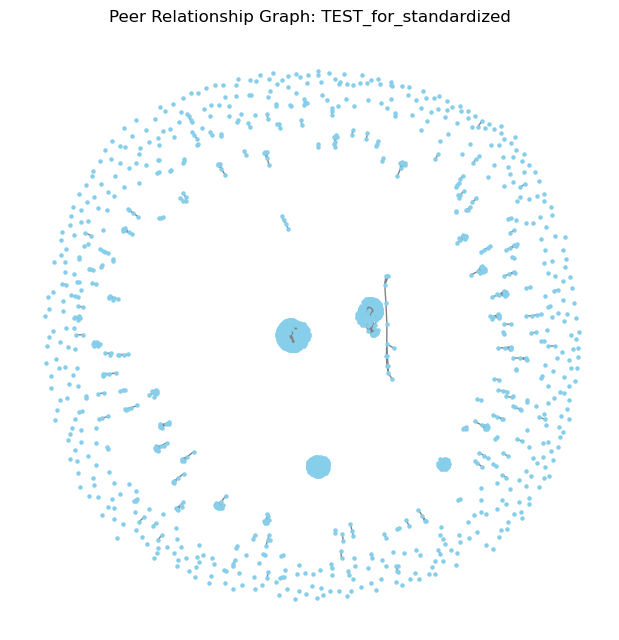

In [30]:

threshold = 0.840
_, G_std_data, weighted_sum_std = weighted_by_std(data,
                                                    comparison_details = updated_comparison_details, 
                                                    output_column = 'graph_std', 
                                                    threshold = threshold, 
                                                    parent_id = 'FC_ULT_PARENT_ID', 
                                                    id_column = 'FC_FITCH_ID')
# Print distribution fo weights
dist_of_weighted_sums(weighted_sum_std, threshold, col = 'Weighted_Sum', lower = 0.1, upper = 10)

# Create the NX Graph and add it to the Dictionary
Graph_std = nx_graph_converter(data, peer_col = 'graph_std',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
print(f"Number of nodes: {Graph_std.number_of_nodes()}")
print(f"Number of edges: {Graph_std.number_of_edges()}")
A = weighted_sum_std[weighted_sum_std['Weighted_Sum']>0]
percentile = np.percentile(A['Weighted_Sum'], 98)
print(f'The 98-precentile is at a threshold of: {percentile:.3f}')

simple_graph(Graph_std, 'TEST_for_standardized')

## Balance sheet and income statement decomposed data

We use two approaches:
- K-cluster: We go alongside Cyree et al. (2020) in their JEF paper and use the decomposition of the Balance sheet and income statement to create peers based on K-clusters. Notably, they did it on Banks from the US and we expand it by looking at an international Dataset with rated banks.
- ML approach: the rating agency FITCH provides their own peer measure. Which is however very scarce. The peer-classification is based on the experts judgement. However, there is no automatic methodology (according to the information they provided via E-Mail). We therefore assume that it has not been applied to all banks. 
    - Use the countries with "not-na in peers" - ratio above 50% to train an XGBOOST and predict the peers with it.
    - Data: also use the Balance sheet decomposition

### ML approach (XG Boost)

Data sets:
- All the Balance sheet and income statement data is already normalized with total assets and operating income respectively
- Train set: Use all banks in countries where the proportion of rated banks is above 50%
- Prediction: Predict the peers on the whole dataset (also on those used for training).

Process:
1. Calculate the similarities for the Train set and the Prediction set (separately: avoid data leakage)
    - For each pair calculat the absolute difference of each column 
    - Save weather the pair was considered to be a pair of peers
2. Initialize XGB classifier (logloss, label_encoder = false)
3. Perform a grid search (cv = 3, scoring = accuracy)
4. Use the best performing model to predict the peers
5. Create a single peer measure column in the dataset

#### Functions

In [42]:
def get_similarities(df, id_column='FC_FITCH_ID'):
    """
    Computes pairwise absolute differences between entities for specified columns in a DataFrame.

    Parameters:
    ----------
    df : pandas.DataFrame
        The input DataFrame containing the data for similarity calculations.
    id_column : str, optional (default='FC_FITCH_ID')
        The column name representing the unique identifier for each entity.

    Returns:
    -------
    pandas.DataFrame
        A DataFrame containing pairwise absolute differences for specified columns between all entities. Columns include:
        - 'ID1': The identifier for the first entity in the pair.
        - 'ID2': The identifier for the second entity in the pair.
        - Absolute differences for all columns starting with 'A:', 'L:', 'E:', or 'I:'.

    Notes:
    ------
    - The function identifies columns for similarity calculation based on prefixes ('A:', 'L:', 'E:', 'I:').
    - Pairwise differences are calculated as the absolute difference between values for each pair of entities.
    - The resulting DataFrame includes one row per unique pair of entities (no duplicates or self-pairs).

    """
    # Identify columns for similarity calculation
    columns_to_calculate_similarity = [col for col in df.columns if col.startswith(('A:', 'L:', 'E:', 'I:'))]
    
    # Extract identifiers and numeric data
    identifiers = df[id_column].values
    numeric_data = df[columns_to_calculate_similarity].values
    
    # Perform matrix subtraction to get pairwise differences for each column
    differences = np.abs(numeric_data[:, None] - numeric_data)  # Shape: (n, n, num_columns)
    
    # Generate pairs of IDs and their absolute differences per column
    n = len(identifiers)
    pairs = []
    for i in range(n):
        for j in range(i + 1, n):
            diff_per_column = differences[i, j]  # Absolute differences for all columns
            pair_dict = {'ID1': identifiers[i], 'ID2': identifiers[j]}
            pair_dict.update({col: diff for col, diff in zip(columns_to_calculate_similarity, diff_per_column)})
            pairs.append(pair_dict)
    
    # Create resulting DataFrame
    df_similarities = pd.DataFrame(pairs)
    peer_map = {}
    for _, row in df.iterrows():
        row_id = str(row[id_column])  # Convert ID to string
        if isinstance(row['FITCH_peer_ids'], str):  # Ensure peers exist and are valid
            peer_ids = set(peer.strip() for peer in row['FITCH_peer_ids'].split(','))
            peer_map[row_id] = peer_ids  # Save as string keys with string sets
    
    # Step 2: Ensure IDs in `result_df` are Strings
    df_similarities['ID1'] = df_similarities['ID1'].astype(str)
    df_similarities['ID2'] = df_similarities['ID2'].astype(str)
    
    # Step 3: Define the function to check for peers
    def check_fitch_peer(row):
        id1_peers = peer_map.get(row['ID1'], set())  # Get peers of ID1 (set of strings)
        id2_peers = peer_map.get(row['ID2'], set())  # Get peers of ID2 (set of strings)
        # Compare ID2 (as string) in ID1's peers and vice versa
        return 1 if row['ID2'] in id1_peers or row['ID1'] in id2_peers else 0
    
    # Step 4: Apply the function to the DataFrame
    df_similarities['fitch_peer'] = df_similarities.apply(check_fitch_peer, axis=1)
    
    return df_similarities


#### Application

In [43]:
# Get which countries should go into the train set and which not
country_stats = []

# Loop through each unique country and calculate the required metrics
for country in df_ML['FC_COUNTRY_3_CD'].unique():
    country_data = df_ML[df_ML['FC_COUNTRY_3_CD'] == country]
    notna_ratio = country_data['FITCH_peer_ids'].notna().sum() / len(country_data)
    total_count = len(country_data)
    country_stats.append((country, notna_ratio, total_count))

# Create a DataFrame from the results
country_stats_df = pd.DataFrame(country_stats, columns=['Country', 'NotNA_Ratio', 'Total_Count'])

# Sort the DataFrame by Total_Count in descending order
country_stats_df = country_stats_df.sort_values(by='NotNA_Ratio', ascending=False).reset_index(drop=True)
country_stats_df['weighted_na'] = country_stats_df['NotNA_Ratio'] * country_stats_df['Total_Count']
print('In train countries we have peer measure for',
      100* country_stats_df[country_stats_df['NotNA_Ratio']>0.5]['weighted_na'].sum() / country_stats_df[country_stats_df['NotNA_Ratio']>0.5]['Total_Count'].sum(),
      '% of the data')

# Make a subset as the train set
train_countries = country_stats_df[country_stats_df['NotNA_Ratio']>0.5]['Country'].unique()
df_ML_train = df_ML[df_ML['FC_COUNTRY_3_CD'].isin(train_countries)].copy()

In train countries we have peer measure for 74.76808905380334 % of the data


In [44]:
# Calculate Similarities
df_similarities = get_similarities(df_ML_train, id_column='FC_FITCH_ID')
df_similarities_all =  get_similarities(df_ML, id_column='FC_FITCH_ID')
print('The training data is of size:', df_similarities.shape)

The training data is of size: (144991, 30)


In [45]:
# Predict Model and make a Train test split to evaluate performance
X = df_similarities.drop(columns=['fitch_peer'])  # Drop target and ID columns
y = df_similarities['fitch_peer']
# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Initialize the XGBoost classifier
xgb = XGBClassifier(eval_metric='logloss')

# Define a parameter grid for GridSearchCV


param_grid = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 5, 7, 10],
    'learning_rate': [0.01, 0.1, 0.2, 0.3],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 1, 5]
}
#  'colsample_bytree': 0.6, 'gamma': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 150, 'subsample': 1.0
param_grid = {
    'n_estimators': [150],
    'max_depth': [7],
    'learning_rate': [0.2],
    'subsample': [1],
    'colsample_bytree': [0.6],
    'gamma': [0]
}
# GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(
    estimator=xgb,
    param_grid=param_grid,
    scoring='accuracy',
    cv=3,
    verbose=1,
    n_jobs=-1
)

# Drop the IDs
X_train = X_train.drop(columns=['ID1', 'ID2'])
# Fit the model
grid_search.fit(X_train, y_train)

# Best parameters and model
best_model = grid_search.best_estimator_
print("Best Parameters:", grid_search.best_params_)

# Predictions on test data
X_test = X_test.drop(columns=['ID1', 'ID2'])
y_pred = best_model.predict(X_test)

# Evaluate the model
print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))
print('FITCH pairs:', y_test.sum(), 'Predicted paris:', y_pred.sum())


Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best Parameters: {'colsample_bytree': 0.6, 'gamma': 0, 'learning_rate': 0.2, 'max_depth': 7, 'n_estimators': 150, 'subsample': 1}
Accuracy: 0.9919996321669962

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     43136
           1       0.73      0.06      0.11       362

    accuracy                           0.99     43498
   macro avg       0.86      0.53      0.55     43498
weighted avg       0.99      0.99      0.99     43498

FITCH pairs: 362 Predicted paris: 30


In [46]:
# Apply the model to all the data (including the training data)
X_all = df_similarities_all.drop(columns=['fitch_peer'])  # Drop target and ID columns
y_all = df_similarities_all['fitch_peer']

IDs_all = X_all[['ID1', 'ID2']]
X_all = X_all.drop(columns=['ID1', 'ID2'])

y_pred_all = best_model.predict(X_all)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))

X_all[['ID1', 'ID2']] = IDs_all
X_all['fitch_peer'] = y_all
X_all['peer_xgb'] = y_pred_all
X_all['peer_xgb_fitch'] = (
    (X_all['fitch_peer'] == 1) | (X_all['peer_xgb'])
).astype(int)
print('FITCH pairs:', y_all.sum(), 'Predicted paris:', y_pred_all.sum())

Accuracy: 0.9919996321669962

Classification Report:
               precision    recall  f1-score   support

           0       0.99      1.00      1.00     43136
           1       0.73      0.06      0.11       362

    accuracy                           0.99     43498
   macro avg       0.86      0.53      0.55     43498
weighted avg       0.99      0.99      0.99     43498

FITCH pairs: 1806 Predicted paris: 17555


The Precision is very low because therer are a lot more no-peer pairs.
However, we can see that predicted paris are a lot more which is in line with our argument that the Fitch company did not consider all banks and that their peer groups are incomplete.

In [47]:
# Here we again create the classic sets of banks for each bank.
# It is different from the above because we now have a dataset of pairs and not of banks
df_ML['FC_FITCH_ID'].astype(str)
df_ML['peer_xgb'] = ''
df_ML['peer_xgb_fitch'] = ''
# Step 1: Create lookup tables for 'peer_xgb' and 'peer_xgb_fitch'
peer_xgb = X_all[X_all['peer_xgb'] == 1]
peer_xgb_fitch = X_all[X_all['peer_xgb_fitch'] == 1]

# Step 2: Create dictionaries mapping each ID to its peers (convert to strings)
peer_xgb_dict = {}
peer_xgb_fitch_dict = {}

for _, row in peer_xgb.iterrows():
    peer_xgb_dict.setdefault(str(row['ID1']), []).append(str(row['ID2']))
    peer_xgb_dict.setdefault(str(row['ID2']), []).append(str(row['ID1']))

for _, row in peer_xgb_fitch.iterrows():
    peer_xgb_fitch_dict.setdefault(str(row['ID1']), []).append(str(row['ID2']))
    peer_xgb_fitch_dict.setdefault(str(row['ID2']), []).append(str(row['ID1']))

# Step 3: Assign peer lists to df_ML using vectorized operations
def get_peers(id_row, peer_dict):
    return ','.join(map(str, peer_dict.get(str(id_row), [])))  # Ensure id_row is string

df_ML['peer_xgb'] = df_ML['FC_FITCH_ID'].map(lambda x: get_peers(x, peer_xgb_dict))
df_ML['peer_xgb_fitch'] = df_ML['FC_FITCH_ID'].map(lambda x: get_peers(x, peer_xgb_fitch_dict))

# Replace empty strings with NaN
df_ML['peer_xgb'] = df_ML['peer_xgb'].replace('', np.nan)
df_ML['peer_xgb_fitch'] = df_ML['peer_xgb_fitch'].replace('', np.nan)


Again create the networks. Note there are two:
- xgb: only the by the XGB predicted pairs
- xgb_fitch: the above network + the fitch pairs

In [48]:
# Add xgb to the dictionary:
G_xgb = nx_graph_converter(df_ML, 
                           peer_col='peer_xgb', 
                           company_col='FC_COMPANY_NAME', 
                           id_column='FC_FITCH_ID')
# Add the network to the dictionary
ID_Peer = df_ML[['FC_FITCH_ID', 'peer_xgb']]
Bank_networks['XGB peers'] = {
    'Graph': G_xgb,
    'ID_Peer': ID_Peer
    }
ID_Peer.to_excel('Peers/G_xgb.xlsx', index=False)

# Add xgb and fitch combined to the dictionary:
G_xgb_fitch = nx_graph_converter(df_ML, 
                                 peer_col='peer_xgb_fitch', 
                                 company_col='FC_COMPANY_NAME', 
                                 id_column='FC_FITCH_ID')
# Add the network to the dictionary
ID_Peer = df_ML[['FC_FITCH_ID', 'peer_xgb_fitch']]
Bank_networks['XGB-Fitch peers'] = {
    'Graph': G_xgb_fitch,
    'ID_Peer': ID_Peer
    }
ID_Peer.to_excel('Peers/G_xgb_fitch.xlsx', index=False)


### K-cluster according to the Paper

In the paper of Cyree et al. (JEF, 2020) they propose to create peer-groups based on clusters with K-means. They scale the Financial data with Total assets and Operating revenue. This makes sure all variables are scaled. We thus dont have to scale the data when imputing values (as comparison) or when creating the clusters. The procedure is as follows:
1. Create two datasets: one with no NAs (restrict some columns and rows) and one with imputed values based on a KNN, n = 2 (assume that banks who are similar in all other metrics are also similar in the missing one). 
2. Create some plots to look at effect of k number of clusters
3. As in the paper we use 25 clusters to evaluate our network. No restriction on number of banks in a cluster.
4. Create 4 networks (2 for each of the above named datasets)
    - Same cluster network: just add edge if in same cluster (not ver informational but to plot nice)
    - Use the 4 category logic but update it with the cluster (see more in Category netowrk)



#### Data Preparation

We have to either impute the values or delete the NAs, we do both and compare.  
We do not scale the data because it already is scaled (by total assets/ operating revenue)

In [49]:
columns_with_financials = [col for col in df_ML.columns if col.startswith(('A:', 'L:', 'E:', 'I:', 'FC_FITCH_ID'))]
bank_data = df_ML[columns_with_financials].copy()

# Non-NA-dataset
# First delete rows with NAs in important columns:
important_col = ['A:Cash', 'A:Securities', 'A:all_other_loans', 'A:fixed_assets', 'A:consumer_loans', 'I:Total_int_expense']
df_ML_no_na = bank_data.dropna(subset=important_col).copy()
df_ML_no_na =  df_ML_no_na.dropna(axis=1).copy()
columns_no_na= [col for col in df_ML_no_na.columns if col.startswith(('A:', 'L:', 'E:', 'I:'))]
# Check the remaining columns and shape of the data
na_counts, final_shape = df_ML_no_na.isna().sum(), df_ML_no_na.shape
print(na_counts)
print('df_ML_no_na shape:', final_shape)



# Impute the Values to compare the networks
# Standard Scale and apply Imputing with KNN, n = 2
df_ML_IMP = df_ML.copy()
columns_with_financials = [col for col in df_ML.columns if col.startswith(('A:', 'L:', 'E:', 'I:'))]
# Dont scale the data because it already has been scaled with total asset/ Operating profit
# Imputing values
imputer = KNNImputer(n_neighbors=2)
df_ML_IMP[columns_with_financials] = imputer.fit_transform(df_ML_IMP[columns_with_financials])

print('df_ML_IMP shape:', df_ML_IMP.shape)


FC_FITCH_ID                0
A:Cash                     0
A:Securities               0
A:consumer_loans           0
A:all_other_loans          0
A:fixed_assets             0
A:all_other_assets         0
L:core_deposits            0
L:all_other_liab           0
E:all_other_equity         0
I:Interest_inc_on_loans    0
I:non_interest_inc         0
I:Total_int_expense        0
I:pre_tax_profit           0
I:personell_exp            0
I:other_oper_exp           0
I:impairment_and_other     0
dtype: int64
df_ML_no_na shape: (1778, 17)
df_ML_IMP shape: (2127, 50)


#### Different number of clusters (K)

Check impact of K

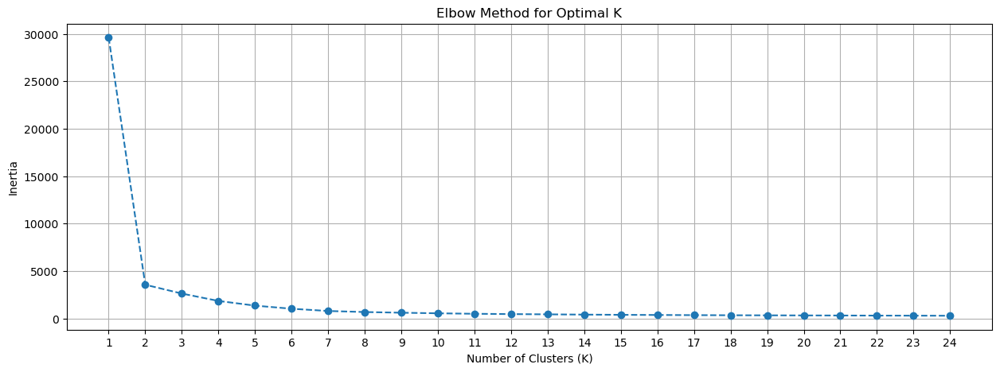

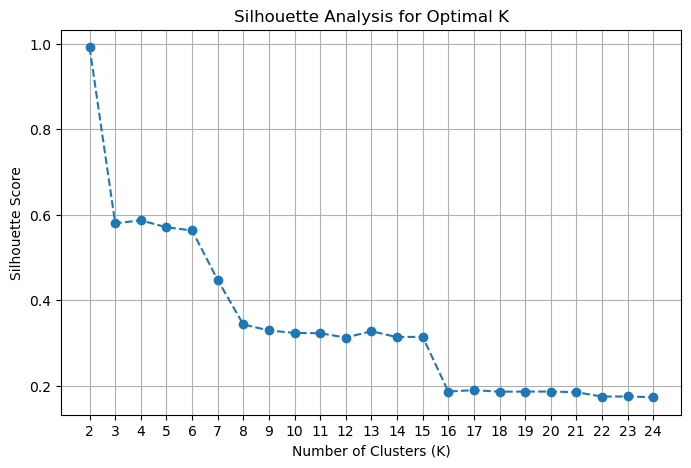

In [50]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
# Step 2: Apply K-means for a range of cluster numbers
inertia_values = []
k_values = range(1, 25)  # Test for K=1 to K=10

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
    kmeans.fit(df_ML_no_na[columns_no_na])
    inertia_values.append(kmeans.inertia_)

# Step 3: Plot the elbow curve
plt.figure(figsize=(15, 5))
plt.plot(k_values, inertia_values, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.grid(True)
plt.show()



# Test different values of K
silhouette_scores = []
k_values = range(2, 25)  # Start from K=2 (minimum clusters)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(df_ML_no_na[columns_no_na])
    score = silhouette_score(df_ML_no_na[columns_no_na], cluster_labels)
    silhouette_scores.append(score)

# Plot silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Analysis for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()


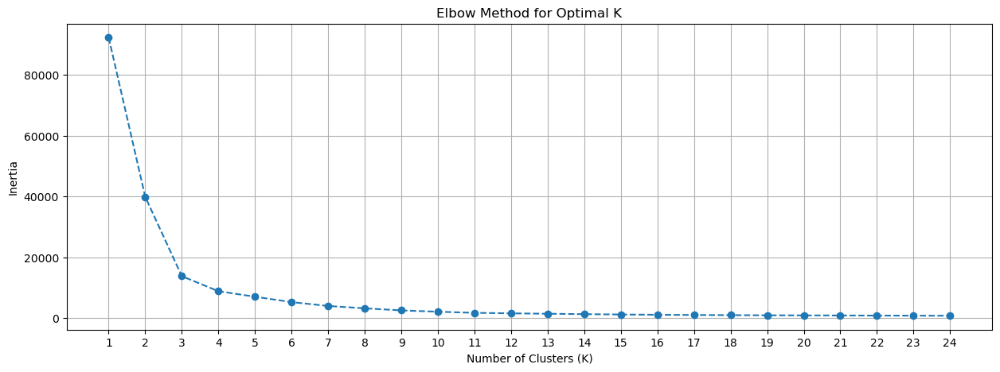

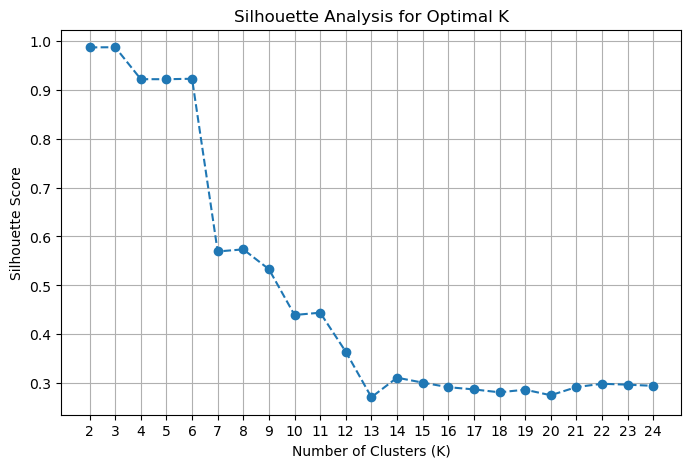

In [51]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
# Step 2: Apply K-means for a range of cluster numbers
inertia_values = []
k_values = range(1, 25)  # Test for K=1 to K=10

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
    kmeans.fit(df_ML_IMP[columns_with_financials])
    inertia_values.append(kmeans.inertia_)

# Step 3: Plot the elbow curve
plt.figure(figsize=(15, 5))
plt.plot(k_values, inertia_values, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.xticks(k_values)
plt.grid(True)
plt.show()



# Test different values of K
silhouette_scores = []
k_values = range(2, 25)  # Start from K=2 (minimum clusters)

for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(df_ML_IMP[columns_with_financials])
    score = silhouette_score(df_ML_IMP[columns_with_financials], cluster_labels)
    silhouette_scores.append(score)

# Plot silhouette scores
plt.figure(figsize=(8, 5))
plt.plot(k_values, silhouette_scores, marker='o', linestyle='--')
plt.title('Silhouette Analysis for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Silhouette Score')
plt.xticks(k_values)
plt.grid(True)
plt.show()


Although the Elbow rule would suggest a much smaller k than 25 (which they used in the paper), we still use 25 because we do want to cluster similar banks and want the additional variation.

#### Cluster - Network creation 

In [52]:
# NO NA data (Nas deleted)
k = 25  
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
kmeans.fit(df_ML_no_na[columns_no_na])
# Assign each bank to a cluster
df_ML_no_na['Cluster_no_na'] = kmeans.labels_
print(f"Inertia: {kmeans.inertia_}")
centroids = kmeans.cluster_centers_
print('\nDistribution of Banks amongst clusters:', df_ML_no_na['Cluster_no_na'].value_counts())


# Create an empty NetworkX graph
G_cluster_no_na = nx.Graph()

# Add edges for each cluster
for cluster, group in df_ML_no_na.groupby("Cluster_no_na"):
    nodes = group["FC_FITCH_ID"].tolist()
    # Add edges between every pair of nodes in the cluster, avoiding self-loops
    for i, node1 in enumerate(nodes):
        for node2 in nodes[i+1:]:  # Avoid duplicate edges and self-loops
            if node1 != node2:  # Explicit check to avoid self-loops
                G_cluster_no_na.add_edge(node1, node2)

centroids_df = pd.DataFrame(centroids, columns=df_ML_no_na[columns_no_na].columns)

# Add the network to the dictionary
ID_Peer = df_ML_no_na[['FC_FITCH_ID', 'Cluster_no_na']]
Bank_networks['Clusters no NA'] = {
    'Graph': G_cluster_no_na,
    'ID_Peer': ID_Peer,
    'Centroids': centroids_df
    }
ID_Peer.to_excel('Peers/G_cluster_no_na.xlsx', index=False)

# Add the Clusters to the df for the later graph
df = pd.merge(df, df_ML_no_na[['FC_FITCH_ID', 'Cluster_no_na']], on='FC_FITCH_ID', how='left')


Inertia: 292.36473354786085

Distribution of Banks amongst clusters: Cluster_no_na
8     259
21    225
6     207
16    200
0     153
14    124
10    114
20     93
18     86
12     82
15     48
19     40
3      36
24     31
23     29
9      19
2      11
13      9
22      5
11      2
4       1
17      1
1       1
5       1
7       1
Name: count, dtype: int64


In [53]:
# Imputed data (NAs filled by KNN, k = 2)
k = 25  
kmeans = KMeans(n_clusters=k, random_state=42, n_init=10, max_iter=300)
kmeans.fit(df_ML_IMP[columns_with_financials])
# Assign each bank to a cluster
df_ML_IMP['Cluster_IMP'] = kmeans.labels_
print(f"Inertia: {kmeans.inertia_}")
centroids = kmeans.cluster_centers_
print('\nDistribution of Banks amongst clusters:', df_ML_IMP['Cluster_IMP'].value_counts())


# Create an empty NetworkX graph
G_cluster_IMP = nx.Graph()

# Add edges for each cluster
for cluster, group in df_ML_IMP.groupby("Cluster_IMP"):
    nodes = group["FC_FITCH_ID"].tolist()
    # Add edges between every pair of nodes in the cluster, avoiding self-loops
    for i, node1 in enumerate(nodes):
        for node2 in nodes[i+1:]:  # Avoid duplicate edges and self-loops
            if node1 != node2:  # Explicit check to avoid self-loops
                G_cluster_IMP.add_edge(node1, node2)

centroids_df = pd.DataFrame(centroids, columns=df_ML_IMP[columns_with_financials].columns)

# Add the network to the dictionary
ID_Peer = df_ML_IMP[['FC_FITCH_ID', 'Cluster_IMP']]
Bank_networks['Clusters no NA'] = {
    'Graph': G_cluster_IMP,
    'ID_Peer': ID_Peer,
    'Centroids': centroids_df
    }
ID_Peer.to_excel('Peers/G_cluster_IMP.xlsx', index=False)

# Add the Clusters to the df for the later graph
df = pd.merge(df, df_ML_IMP[['FC_FITCH_ID', 'Cluster_IMP']], on='FC_FITCH_ID', how='left')


Inertia: 709.8076949118295

Distribution of Banks amongst clusters: Cluster_IMP
3     928
21    265
15    239
12    213
0     194
19     80
14     69
18     48
17     41
9      16
10      7
24      7
11      5
23      2
8       2
4       2
1       1
7       1
22      1
6       1
20      1
13      1
2       1
5       1
16      1
Name: count, dtype: int64


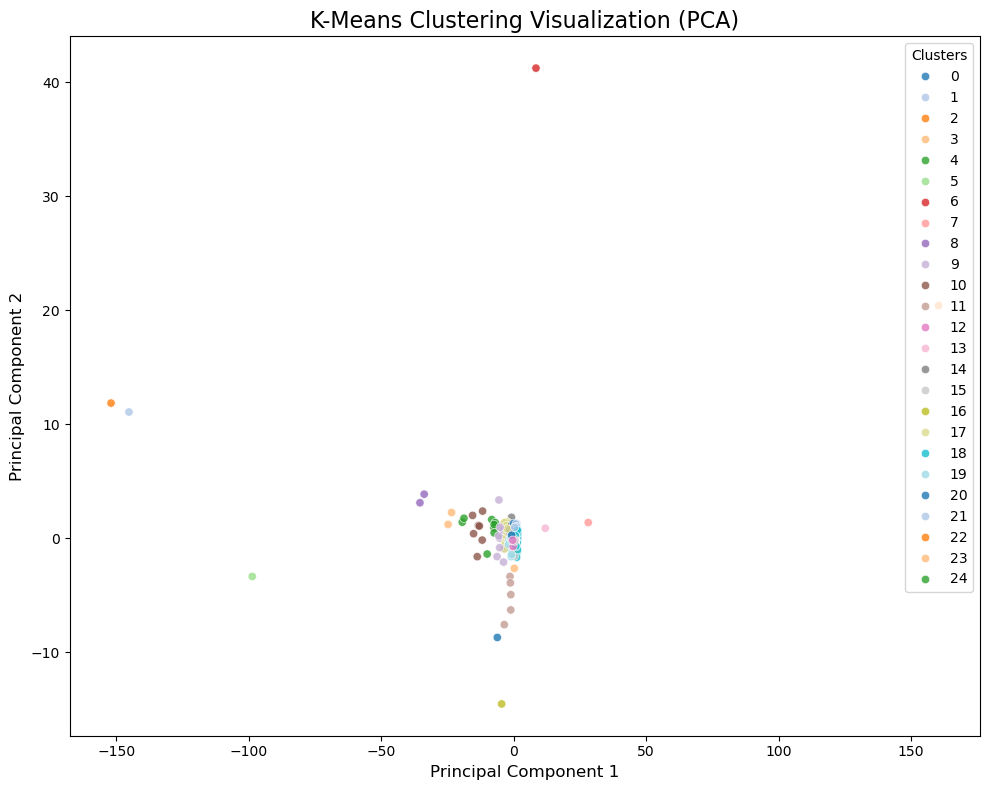

In [54]:
from sklearn.decomposition import PCA
columns_with_financials = [col for col in df_ML.columns if col.startswith(('A:', 'L:', 'E:', 'I:'))]
# Reduce to 2 dimensions
pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_ML_IMP[columns_with_financials])

# Add PCA components to the DataFrame
df_ML_IMP["PCA1"] = X_pca[:, 0]
df_ML_IMP["PCA2"] = X_pca[:, 1]

# Scatter plot of PCA results
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x="PCA1",
    y="PCA2",
    hue="Cluster_IMP",
    palette="tab20",
    data=df_ML_IMP,
    legend="full",
    alpha=0.8
)
plt.title('K-Means Clustering Visualization (PCA)', fontsize=16)
plt.xlabel('Principal Component 1', fontsize=12)
plt.ylabel('Principal Component 2', fontsize=12)
plt.legend(title="Clusters", fontsize=10)
plt.tight_layout()
plt.show()


In [55]:
from sklearn.manifold import TSNE

# Reduce to 2 dimensions using t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
X_tsne = tsne.fit_transform(df_ML_IMP[columns_with_financials])

# Add t-SNE components to the DataFrame
df_ML_IMP["tSNE1"] = X_tsne[:, 0]
df_ML_IMP["tSNE2"] = X_tsne[:, 1]

/Users/morrisniklaus/miniconda3/envs/Environment_1/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/Users/morrisniklaus/miniconda3/envs/Environment_1/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


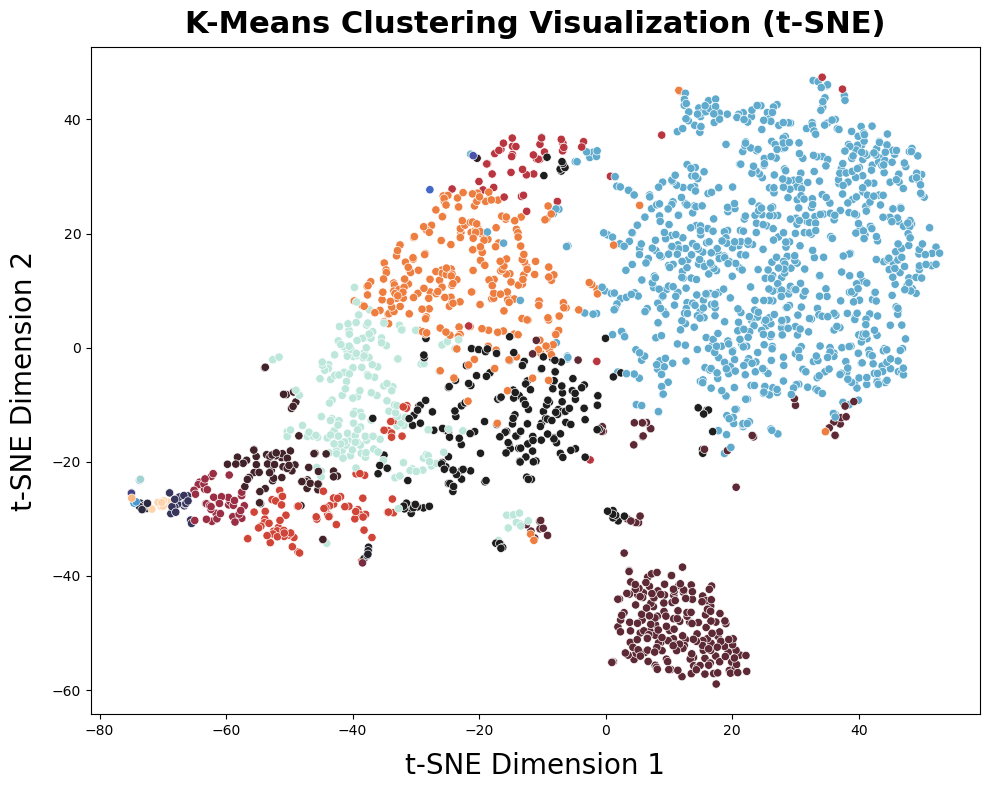

In [56]:

# Scatter plot of t-SNE results
plt.figure(figsize=(10, 8))
sns.scatterplot(
    x="tSNE1",
    y="tSNE2",
    hue="Cluster_IMP",
    palette="icefire",
    data=df_ML_IMP,
    legend=False,
    alpha=1
)
plt.title('K-Means Clustering Visualization (t-SNE)', fontsize=22, weight='bold', pad=10)
plt.xlabel('t-SNE Dimension 1', color='black', fontsize=20, labelpad=10)
plt.ylabel('t-SNE Dimension 2', color='black', fontsize=20, labelpad=10)

plt.tight_layout()
plt.savefig(f"Tables/Cluster_vis.png", dpi=700, bbox_inches='tight')
plt.show()


#### Category Network

We argue that the Cluster defines the Business model very good and include it in our 4 category measure. 

##### NO NA categorey network (Some columns and rows deleted to delete NAs)

Again we look at different weighting and different thresholds.

In [57]:
df_Cluster_no_na = df[df['Cluster_no_na'].notna()]

In [58]:
# Weighting based on NAs:
# Each category 25%
# Within Category, equal weights
comparison_details_Cluster = [
    # Operating Environment
    ('FC_COUNTRY_3_CD', 'equal', 0.0833),  # Country code
    ('FC_TOTAL_WEIGHTED_RISKS_BNK!USD', 'int', 0.0833),  # Country risk indices
    ('FC_CURR_TRANSLATION_DIFF_BNK!USD', 'int', 0.0833),  # Currency translation differences

    # Business Model
        ## Loan Portfolio Composition
    ('Cluster_no_na', 'equal', 0.25),  # New Cluster Assignment
   
    # Size
    ('FC_TOTAL_ASSETS_BNK!USD', 'int',  0.0833),  # Total assets
    ('FC_NUM_EMPLOYEES_BNK!USD', 'int',  0.0833),  # Number of employees
    ('FC_NUM_BRANCHES_BNK!USD', 'int',  0.0833),  # Number of branches

    # Credit Ratings
    ('FC_TIER_1_REG_CAP_RATIO_BNK!USD', 'int', 0.05),  # Tier 1 capital ratio
    ('FC_NPL_GROSS_LOANS_BNK!USD', 'int', 0.05),  # Non-performing loans/gross loans
    ('FC_NET_INC_AVG_TOTAL_EQUITY_BNK!USD', 'int', 0.05),  # ROAE
    ('FC_FITCH_COMP_INC_BNK!USD', 'int', 0.05),  # Comprehensive income
    ('FC_LT_IDR!USD', 'equal', 0.05)  # Long-term issuer default rating
]


# Second weighting list based on NAs in each column

# Define categories for comparison details
categories = {
    "Operating Environment": comparison_details_Cluster[:3],
    "Business Model": comparison_details_Cluster[3:4],
    "Size": comparison_details_Cluster[4:7],
    "Credit Ratings": comparison_details_Cluster[7:]
    }


# Calculate NA percentages in each column
na_percentages = df_Cluster_no_na.isna().mean() * 100  # Percent of NAs per column

# Initialize results
category_results = {}

for category, details in categories.items():
    columns = [col for col, _, _ in details]
    
    # Calculate NA percentages for the category
    category_na_percentages = na_percentages[columns]

    # Calculate inverse proportion of NA for each column within the category
    total_na_in_category = category_na_percentages.sum()
    if total_na_in_category > 0:
        inv_prop_na =1- category_na_percentages / total_na_in_category
        # Get total inverse proabilities 
        total_na_prop = inv_prop_na.sum()
        # weights are proportional to inv proportion of Nas and sum upt to 1
        weights = inv_prop_na/total_na_prop
        print(weights.sum())
    else:
        inv_prop_na = pd.Series(0, index=columns)  # No NAs in category
        weights = 1


    category_results[category] = pd.DataFrame({
        "Column": columns,
        "Weight": weights,
        "NA_Percentage": category_na_percentages,
        "Proportion_NA_in_Category": inv_prop_na
    })
    


# Create the new list
Cluster_category_na_weights = []
for_print = []
for category, result in category_results.items():
    for _, row in result.iterrows():
        column = row['Column']
        weight = row['Weight']*0.25  # Use the updated normalized weight
        na_percentage = row['NA_Percentage']
        na_percentage_in_cat = row['Proportion_NA_in_Category']
        mode = [detail[1] for detail in categories[category] if detail[0] == column][0]
        Cluster_category_na_weights.append((column, mode, weight))
        for_print.append((column, mode, round(weight,3), round(na_percentage,3), round(na_percentage_in_cat,3)))

Cluster_category_na_weights

1.0
1.0
1.0


[('FC_COUNTRY_3_CD', 'equal', 0.125),
 ('FC_TOTAL_WEIGHTED_RISKS_BNK!USD', 'int', 0.10275824770146025),
 ('FC_CURR_TRANSLATION_DIFF_BNK!USD', 'int', 0.022241752298539752),
 ('Cluster_no_na', 'equal', 0.25),
 ('FC_TOTAL_ASSETS_BNK!USD', 'int', 0.125),
 ('FC_NUM_EMPLOYEES_BNK!USD', 'int', 0.09943181818181818),
 ('FC_NUM_BRANCHES_BNK!USD', 'int', 0.025568181818181823),
 ('FC_TIER_1_REG_CAP_RATIO_BNK!USD', 'int', 0.047451091045899174),
 ('FC_NPL_GROSS_LOANS_BNK!USD', 'int', 0.01998683220466517),
 ('FC_NET_INC_AVG_TOTAL_EQUITY_BNK!USD', 'int', 0.06240594431903687),
 ('FC_FITCH_COMP_INC_BNK!USD', 'int', 0.0625),
 ('FC_LT_IDR!USD', 'equal', 0.0576561324303988)]

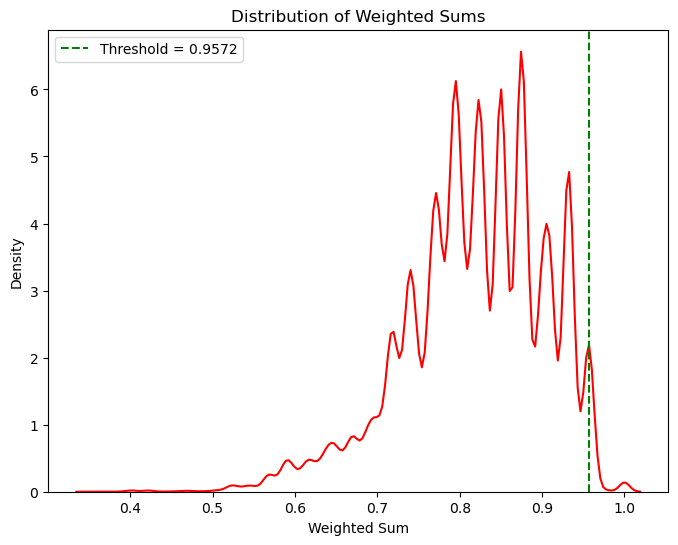

Number of Pairs plotted: 1579753
Number of nodes: 1778
Number of edges: 13919


In [59]:
# Threshold 99-percentile
# Weights: NA weighted, 
# NAS: not filled
# DATASET: no NA in cluster
threshold = 0.9572
non_norm_data, data, weighted_sums_df_4_cat_99_NAw_CL_nNA = normalized_country_cond(df_Cluster_no_na, 
                                                                comparison_details=Cluster_category_na_weights,
                                                                p_c_cond = True ,
                                                                output_column='4_cat_99_NAw_CL_nNA', 
                                                                threshold=0.95616, 
                                                                parent_id='FC_ULT_PARENT_ID', 
                                                                id_column='FC_FITCH_ID')

dist_of_weighted_sums(weighted_sums_df_4_cat_99_NAw_CL_nNA, threshold, col = 'Weighted_Sum', lower = 0.1, upper = 10)

G_099_cluster_no_na = nx_graph_converter(data, peer_col = '4_cat_99_NAw_CL_nNA',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
ID_Peer = data[['FC_FITCH_ID', '4_cat_99_NAw_CL_nNA']]
print(f"Number of nodes: {G_099_cluster_no_na.number_of_nodes()}")
print(f"Number of edges: {G_099_cluster_no_na.number_of_edges()}")
Bank_networks['Cluster_network_category'] = {
    'Graph': G_099_cluster_no_na,
    'ID_Peer': ID_Peer
    }
ID_Peer.to_excel('Peers/G_099_cluster_no_na.xlsx', index=False)

In [60]:
A = weighted_sums_df_4_cat_99_NAw_CL_nNA[weighted_sums_df_4_cat_99_NAw_CL_nNA['Weighted_Sum']>0]
percentile = np.percentile(A['Weighted_Sum'], 99)
print(f'The 99-precentile is at a threshold of: {percentile:.4f}')

The 99-precentile is at a threshold of: 0.9572


#### IMP cluster network

We later use the IMP cluster network because we argue that the KNN imputation is very plausible. It is because accounting rules dictate that the values should be similar, e.g. if one is missing in the Balance sheet and all other are the same as in another bank, then the missing can be imputed.   
Advantage:
- We can keep all the banks.
- The imputation is plausible
- There is more variation in the data because we dont have to delete any dimensions

In [61]:
# Weighting based on NAs:
# Each category 25%
# Within Category, equal weights
comparison_details_Cluster = [
    # Operating Environment
    ('FC_COUNTRY_3_CD', 'equal', 0.0833),  # Country code
    ('FC_TOTAL_WEIGHTED_RISKS_BNK!USD', 'int', 0.0833),  # Country risk indices
    ('FC_CURR_TRANSLATION_DIFF_BNK!USD', 'int', 0.0833),  # Currency translation differences

    # Business Model
        ## Loan Portfolio Composition
    ('Cluster_IMP', 'equal', 0.25),  # New Cluster Assignment
   
    # Size
    ('FC_TOTAL_ASSETS_BNK!USD', 'int',  0.0833),  # Total assets
    ('FC_NUM_EMPLOYEES_BNK!USD', 'int',  0.0833),  # Number of employees
    ('FC_NUM_BRANCHES_BNK!USD', 'int',  0.0833),  # Number of branches

    # Credit Ratings
    ('FC_TIER_1_REG_CAP_RATIO_BNK!USD', 'int', 0.05),  # Tier 1 capital ratio
    ('FC_NPL_GROSS_LOANS_BNK!USD', 'int', 0.05),  # Non-performing loans/gross loans
    ('FC_NET_INC_AVG_TOTAL_EQUITY_BNK!USD', 'int', 0.05),  # ROAE
    ('FC_FITCH_COMP_INC_BNK!USD', 'int', 0.05),  # Comprehensive income
    ('FC_LT_IDR!USD', 'equal', 0.05)  # Long-term issuer default rating
]


# Second weighting list based on NAs in each column

# Define categories for comparison details
categories = {
    "Operating Environment": comparison_details_Cluster[:3],
    "Business Model": comparison_details_Cluster[3:4],
    "Size": comparison_details_Cluster[4:7],
    "Credit Ratings": comparison_details_Cluster[7:]
}


# Calculate NA percentages in each column
na_percentages = df.isna().mean() * 100  # Percent of NAs per column

# Initialize results
category_results = {}

for category, details in categories.items():
    columns = [col for col, _, _ in details]
    
    # Calculate NA percentages for the category
    category_na_percentages = na_percentages[columns]

    # Calculate inverse proportion of NA for each column within the category
    total_na_in_category = category_na_percentages.sum()
    if total_na_in_category > 0:
        inv_prop_na =1- category_na_percentages / total_na_in_category
        # Get total inverse proabilities 
        total_na_prop = inv_prop_na.sum()
        # weights are proportional to inv proportion of Nas and sum upt to 1
        weights = inv_prop_na/total_na_prop
        print(weights.sum())
    else:
        inv_prop_na = pd.Series(0, index=columns)  # No NAs in category
        weights = 1
    

    category_results[category] = pd.DataFrame({
        "Column": columns,
        "Weight": weights,
        "NA_Percentage": category_na_percentages,
        "Proportion_NA_in_Category": inv_prop_na
    })
    

# Create the new list
Cluster_category_na_weights = []
for_print = []
for category, result in category_results.items():
    for _, row in result.iterrows():
        column = row['Column']
        weight = row['Weight']*0.25  # Use the updated normalized weight
        na_percentage = row['NA_Percentage']
        na_percentage_in_cat = row['Proportion_NA_in_Category']
        mode = [detail[1] for detail in categories[category] if detail[0] == column][0]
        Cluster_category_na_weights.append((column, mode, weight))
        for_print.append((column, mode, round(weight,3), round(na_percentage,3), round(na_percentage_in_cat,3)))

Cluster_category_na_weights

1.0
1.0
1.0


[('FC_COUNTRY_3_CD', 'equal', 0.125),
 ('FC_TOTAL_WEIGHTED_RISKS_BNK!USD', 'int', 0.09946059004843681),
 ('FC_CURR_TRANSLATION_DIFF_BNK!USD', 'int', 0.02553940995156319),
 ('Cluster_IMP', 'equal', 0.25),
 ('FC_TOTAL_ASSETS_BNK!USD', 'int', 0.125),
 ('FC_NUM_EMPLOYEES_BNK!USD', 'int', 0.09516423357664233),
 ('FC_NUM_BRANCHES_BNK!USD', 'int', 0.029835766423357668),
 ('FC_TIER_1_REG_CAP_RATIO_BNK!USD', 'int', 0.04511766503667482),
 ('FC_NPL_GROSS_LOANS_BNK!USD', 'int', 0.024373471882640586),
 ('FC_NET_INC_AVG_TOTAL_EQUITY_BNK!USD', 'int', 0.06234718826405868),
 ('FC_FITCH_COMP_INC_BNK!USD', 'int', 0.0625),
 ('FC_LT_IDR!USD', 'equal', 0.055661674816625914)]

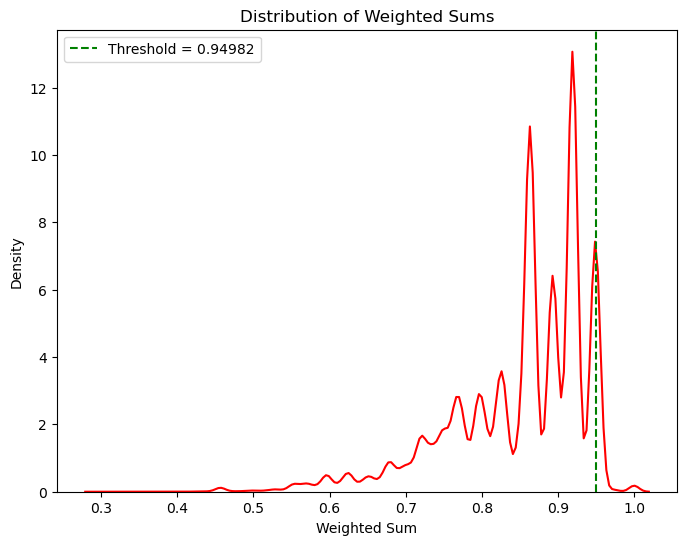

Number of Pairs plotted: 2261001
Number of nodes: 2127
Number of edges: 5213


In [62]:
# Threshold: 99-percentile, 
# Weights: NA weighted, 
# NAS: not filled
# DATASET: Imputed clusters
threshold = 0.94982
non_norm_data, data, weighted_sums_df_x = normalized_country_cond(df, 
                                                                comparison_details=Cluster_category_na_weights,
                                                                p_c_cond = True ,
                                                                output_column='4_cat_99_NAw_CL_IMP', 
                                                                threshold=0.94982, 
                                                                parent_id='FC_ULT_PARENT_ID', 
                                                                id_column='FC_FITCH_ID')

dist_of_weighted_sums(weighted_sums_df_x, threshold, col = 'Weighted_Sum', lower = 0.1, upper = 10)

G_099_cluster_IMP = nx_graph_converter(data, peer_col = '4_cat_99_NAw_CL_IMP',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
ID_Peer = data[['FC_FITCH_ID', '4_cat_99_NAw_CL_IMP']]
print(f"Number of nodes: {G_099_cluster_IMP.number_of_nodes()}")
print(f"Number of edges: {G_099_cluster_IMP.number_of_edges()}")
Bank_networks['Cluster_network_category_IMP'] = {
    'Graph': G_099_cluster_IMP,
    'ID_Peer': ID_Peer
    }

ID_Peer.to_excel('Peers/G_099_cluster_IMP.xlsx', index=False)

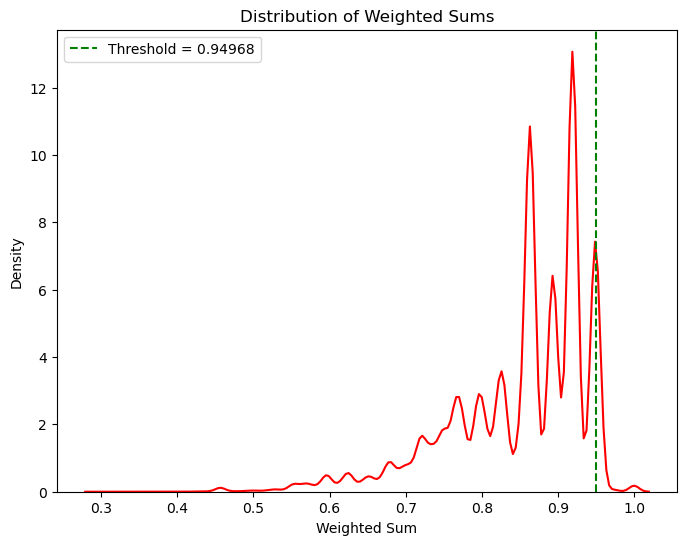

Number of Pairs plotted: 2261001
Number of nodes: 2127
Number of edges: 10648


In [63]:
# Threshold: 98-percentile, 
# Weights: NA weighted, 
# NAS: not filled
# DATASET: Imputed clusters
threshold = 0.94968
non_norm_data, data, weighted_sums_df_x8 = normalized_country_cond(df, 
                                                                comparison_details=Cluster_category_na_weights,
                                                                p_c_cond = True ,
                                                                output_column='4_cat_98_NAw_CL_IMP', 
                                                                threshold=0.94968, 
                                                                parent_id='FC_ULT_PARENT_ID', 
                                                                id_column='FC_FITCH_ID')

dist_of_weighted_sums(weighted_sums_df_x8, threshold, col = 'Weighted_Sum', lower = 0.1, upper = 10)

G_098_cluster_IMP = nx_graph_converter(data, peer_col = '4_cat_98_NAw_CL_IMP',company_col = 'FC_COMPANY_NAME',id_column = 'FC_FITCH_ID')
ID_Peer = data[['FC_FITCH_ID', '4_cat_98_NAw_CL_IMP']]
print(f"Number of nodes: {G_098_cluster_IMP.number_of_nodes()}")
print(f"Number of edges: {G_098_cluster_IMP.number_of_edges()}")
Bank_networks['G_098_cluster_IMP'] = {
    'Graph': G_098_cluster_IMP,
    'ID_Peer': ID_Peer
    }

ID_Peer.to_excel('Peers/G_098_cluster_IMP.xlsx', index=False)

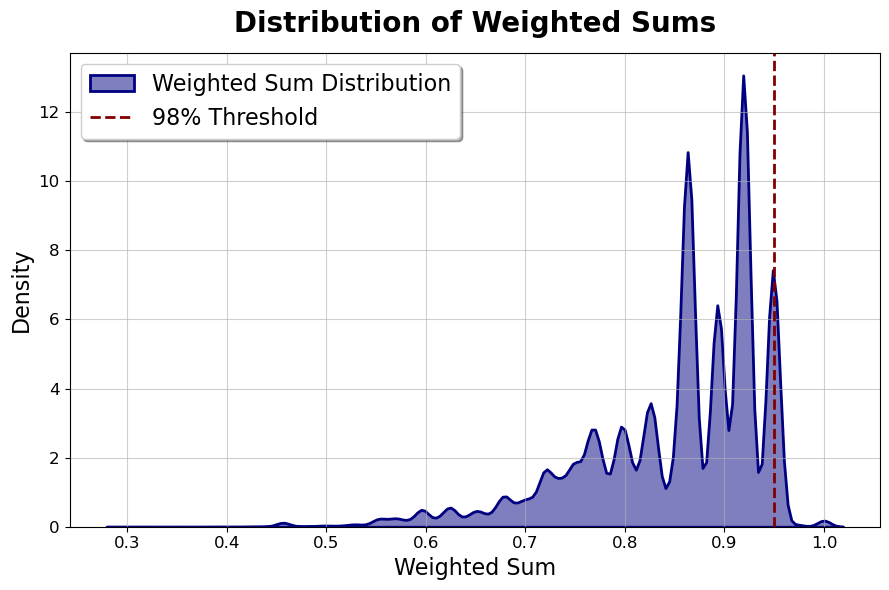

In [64]:
# nice plot for presentation
# Parameters
threshold = 0.94968
col = 'Weighted_Sum'
filtered_data = weighted_sums_df_x8[(weighted_sums_df_x8[col] >= 0.1) & (weighted_sums_df_x8[col] <= 10)][col]

# Create the plot
plt.figure(figsize=(9, 6))  # Larger figure size for better visibility

# Density plot
sns.kdeplot(
    filtered_data, 
    fill=True, 
    color='navy', 
    alpha=0.5, 
    linewidth=2, 
    label='Weighted Sum Distribution'
)

# Add a vertical threshold line
plt.axvline(
    x=threshold, 
    color='maroon', 
    linestyle='--', 
    linewidth=2, 
    label=f'98% Threshold'
)

# Add title and labels with better styling
plt.title('Distribution of Weighted Sums', fontsize=20, fontweight='bold', pad=15)
plt.xlabel('Weighted Sum', fontsize=16)
plt.ylabel('Density', fontsize=16)

# Add legend with improved style
plt.legend(fontsize=16, loc='upper left', frameon=True, shadow=True)

# Add grid for better readability
plt.grid(visible=True, linestyle='-', alpha=0.6)

# Add ticks and format them for better readability
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.savefig(f"Tables/Dist_weight_sum_clust:cat.png", dpi=700, bbox_inches='tight')
plt.show()




In [65]:
A = weighted_sums_df_x[weighted_sums_df_x['Weighted_Sum']>0]
percentile = np.percentile(A['Weighted_Sum'], 98)
print(f'The 98-precentile is at a threshold of: {percentile:.5f}')
#len(weighted_sums_df_x[weighted_sums_df_x['Weighted_Sum']>0.94860])

The 98-precentile is at a threshold of: 0.94968


# Analysis

The Analysis is divided into network specific and region specific analysis.
Further, we restrict the Networks we look at in this code. We do so to keep it tidy and make sure the whole thing is not too crowded.

## Extract the Graphs from the Excel files

This is used so we do not have to run the whole thing every time. We just use our saved excel sheets to recreate the graphs.

In [66]:
#Bank_networks_safety = Bank_networks

In [120]:
def nx_graph_converter_final(df, peer_col='peers', id_column='FC_FITCH_ID'):

    # Create the graph based on peer relationships (all observations)
    G = nx.Graph()
    peer_data = df[[id_column, peer_col]]

    # Add nodes and edges to the graph
    for _, row in peer_data.iterrows():
        company_id = row[id_column]
        peers = str(row[peer_col]).split(',') if pd.notna(row[peer_col]) else []
        
        # Add company node
        G.add_node(company_id)
        
        # Add edges for peers
        for peer in peers:
            try:
                peer_id = int(peer)
                G.add_edge(company_id, peer_id)
            except ValueError:
                pass  # Skip if peer is not a valid integer
    
    return G


In [123]:
os.getcwd()

'/Users/morrisniklaus/Library/CloudStorage/GoogleDrive-morris.niklaus@bluewin.ch/.shortcut-targets-by-id/1YGb9vm0TYnEKgWgVl81uRBOXjFEEY2qA/Network Science Ordner'

In [ ]:
# Save Networks in GML for final submission
# Define the folder path
folder_path = "Peers"

# Dictionary to store DataFrames named by file name
dataframes = {}
Bank_network_excel = {}

# Create a folder to store the exported GML files
gml_folder = "GML_Files"
os.makedirs(gml_folder, exist_ok=True)  # Create folder if it doesn't exist

# Iterate through all files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".xlsx") or file_name.endswith(".xls"):  # Check for Excel files
        file_path = os.path.join(folder_path, file_name)
        
        # Use the base file name (without extension) as the key
        base_file_name = os.path.splitext(file_name)[0]
        
        # Read the entire Excel file (all sheets) into a DataFrame dictionary
        dataframes[base_file_name] = pd.read_excel(file_path)
        
        if dataframes[base_file_name].iloc[:, -1].dtypes == 'object':  # Check if last column is 'object'
            last_column_name = dataframes[base_file_name].columns[-1]
            
            # Assuming `nx_graph_converter_final` creates a NetworkX graph
            G = nx_graph_converter_final(dataframes[base_file_name], peer_col=last_column_name, id_column='FC_FITCH_ID')
            
            # Store graph and DataFrame in the dictionary
            Bank_network_excel[base_file_name] = {'Graph': G, 'ID_Peer': dataframes[base_file_name]}
            
            # Export the graph to GML
            gml_file_path = os.path.join(gml_folder, f"{base_file_name}.gml")
            nx.write_gml(G, gml_file_path)
            print(f"Graph for '{base_file_name}' exported to {gml_file_path}")

# Access individual DataFrames
for file_name, excel_data in dataframes.items():
    print(f"File: {file_name}")


Graph for 'G_099_cluster_no_na' exported to GML_Files/G_099_cluster_no_na.gml
Graph for '4_cat_thresh_98_naweighted_NAIMP' exported to GML_Files/4_cat_thresh_98_naweighted_NAIMP.gml
Graph for 'G_fitch' exported to GML_Files/G_fitch.gml
Graph for 'G_xgb' exported to GML_Files/G_xgb.gml
Graph for 'G_country_parent' exported to GML_Files/G_country_parent.gml
Graph for 'G_xgb_fitch' exported to GML_Files/G_xgb_fitch.gml
Graph for 'G_099_cluster_IMP' exported to GML_Files/G_099_cluster_IMP.gml
Graph for '4_cat_thresh_98_naweighted' exported to GML_Files/4_cat_thresh_98_naweighted.gml
Graph for '4_cat_thresh_99_naweighted_NAIMP' exported to GML_Files/4_cat_thresh_99_naweighted_NAIMP.gml
Graph for '4_cat_thresh_99_equweighted' exported to GML_Files/4_cat_thresh_99_equweighted.gml
Graph for '4_cat_thresh_99_equweighted_NAIMP' exported to GML_Files/4_cat_thresh_99_equweighted_NAIMP.gml
Graph for 'G_098_cluster_IMP' exported to GML_Files/G_098_cluster_IMP.gml
Graph for '4_cat_thresh_99_naweighte

In [121]:
import os
# Define the folder path
folder_path = "Peers"

# Dictionary to store DataFrames named by file name
dataframes = {}
Bank_network_excel = {}
# Iterate through all files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith(".xlsx") or file_name.endswith(".xls"):  # Check for Excel files
        file_path = os.path.join(folder_path, file_name)
        
        # Use the base file name (without extension) as the key
        base_file_name = os.path.splitext(file_name)[0]
        
        # Read the entire Excel file (all sheets) into a DataFrame dictionary
        dataframes[base_file_name] = pd.read_excel(file_path)
        if dataframes[base_file_name].iloc[:, -1].dtypes == 'object':
            last_column_name = dataframes[base_file_name].columns[-1]
            G = nx_graph_converter_final(dataframes[base_file_name], peer_col=last_column_name, id_column='FC_FITCH_ID')
            Bank_network_excel[base_file_name] = {'Graph': G,
                                                  'ID_Peer': dataframes[base_file_name]}

# Access individual DataFrames
for file_name, excel_data in dataframes.items():
    print(f"File: {file_name}")

File: G_099_cluster_no_na
File: G_cluster_no_na
File: 4_cat_thresh_98_naweighted_NAIMP
File: G_fitch
File: G_xgb
File: G_cluster_IMP
File: G_country_parent
File: G_xgb_fitch
File: G_099_cluster_IMP
File: 4_cat_thresh_98_naweighted
File: 4_cat_thresh_99_naweighted_NAIMP
File: 4_cat_thresh_99_equweighted
File: 4_cat_thresh_99_equweighted_NAIMP
File: G_098_cluster_IMP
File: 4_cat_thresh_99_naweighted


## Restrict Graphs

As said, here is the restriction

In [69]:
# Save all bank networks if we want to apply the functions later
Bank_networks_all = Bank_networks
# Use this if you are not able to run the file above (takes about 40 min depending on your hardware)
# Bank_networks = Bank_network_excel 

In [70]:
# Get the name of all networks available from the excel sheets
for name, data in Bank_network_excel.items():
    print(name)

G_099_cluster_no_na
4_cat_thresh_98_naweighted_NAIMP
G_fitch
G_xgb
G_country_parent
G_xgb_fitch
G_099_cluster_IMP
4_cat_thresh_98_naweighted
4_cat_thresh_99_naweighted_NAIMP
4_cat_thresh_99_equweighted
4_cat_thresh_99_equweighted_NAIMP
G_098_cluster_IMP
4_cat_thresh_99_naweighted


Next we restrict the networks to the ones we actually need

In [71]:
# Can restrict to the only ones we use as comparison
desired_keys = ['G_098_cluster_IMP', 'G_xgb_fitch', '4_cat_thresh_98_naweighted', 'G_fitch']

# Subset the dictionary
Bank_networks = {key: Bank_network_excel[key] for key in desired_keys if key in Bank_network_excel}


## Graph analysis

In the next part, we created numerous analysis. Partly new, partly fromt he assignments to look at different properties. Comments are in the final paper.
The colors are such that the red graphs are for the category networks and the blue graphs are either for the xgb or the fitch.

### Simple Graph

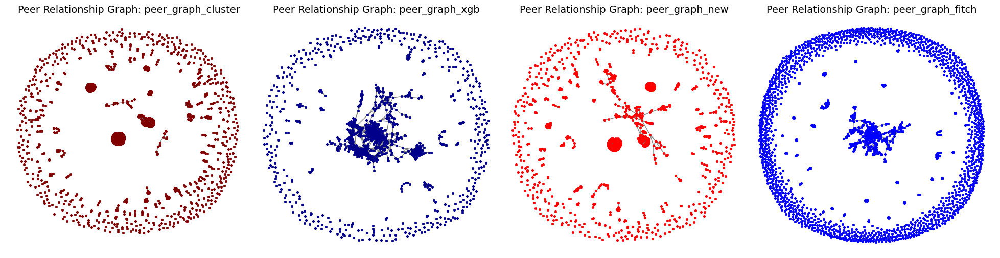

In [72]:

custom_colors = {
    "G_fitch": "blue",
    "G_xgb_fitch": "darkblue",
    "G_098_cluster_IMP": "maroon",
    "4_cat_thresh_98_naweighted": "red",
}
titles = ['peer_graph_cluster', 'peer_graph_xgb', 'peer_graph_new', 'peer_graph_fitch']

# Create a single row of subplots
fig, axes = plt.subplots(1, 4, figsize=(25, 6))  # 4 subplots in 1 row
fig.subplots_adjust(wspace=0)  # Adjust spacing between subplots

i = 0
# Iterate over all items in Bank_networks
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        graph.remove_edges_from(nx.selfloop_edges(graph))
        
        # Use spring layout for better visualization
        pos = nx.spring_layout(graph)
        
        # Draw graph in the ith subplot
        ax = axes[i]  # Select the ith subplot
        nx.draw(
            graph,
            pos,
            ax=ax,  # Pass the current subplot's axes
            with_labels=False,
            node_size=7,
            node_color=custom_colors[title],
            font_size=8,
            font_color='black',
            edge_color='gray'
        )
        ax.set_title(f"Peer Relationship Graph: {titles[i]}", fontsize=14)
        
        i += 1

# Save the entire figure
plt.savefig("Tables/All_Networks_Row.png", dpi=700, bbox_inches='tight')
plt.show()


Processing graph for G_098_cluster_IMP:
Number of nodes: 2127
Number of edges: 10648


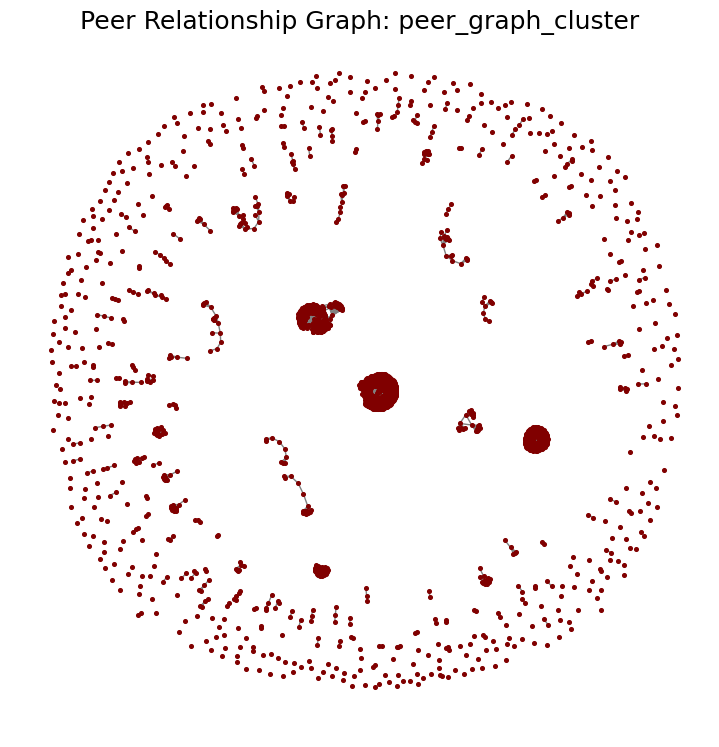

Processing graph for G_xgb_fitch:
Number of nodes: 2127
Number of edges: 18549


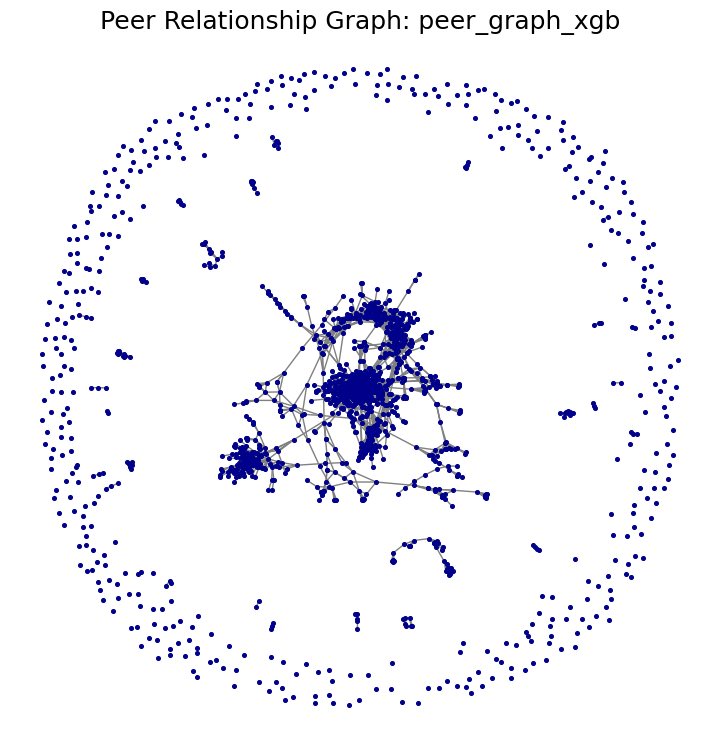

Processing graph for 4_cat_thresh_98_naweighted:
Number of nodes: 2127
Number of edges: 11836


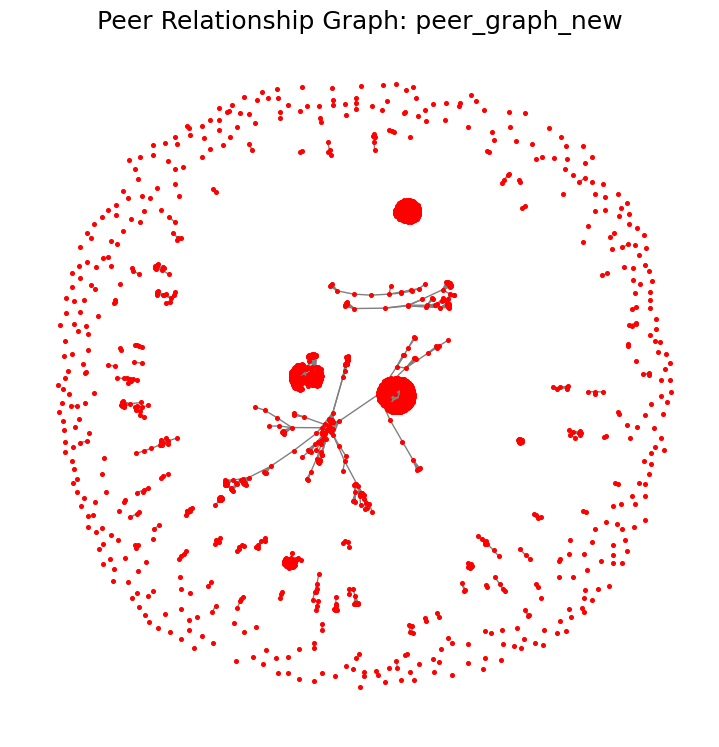

Processing graph for G_fitch:
Number of nodes: 2127
Number of edges: 1806


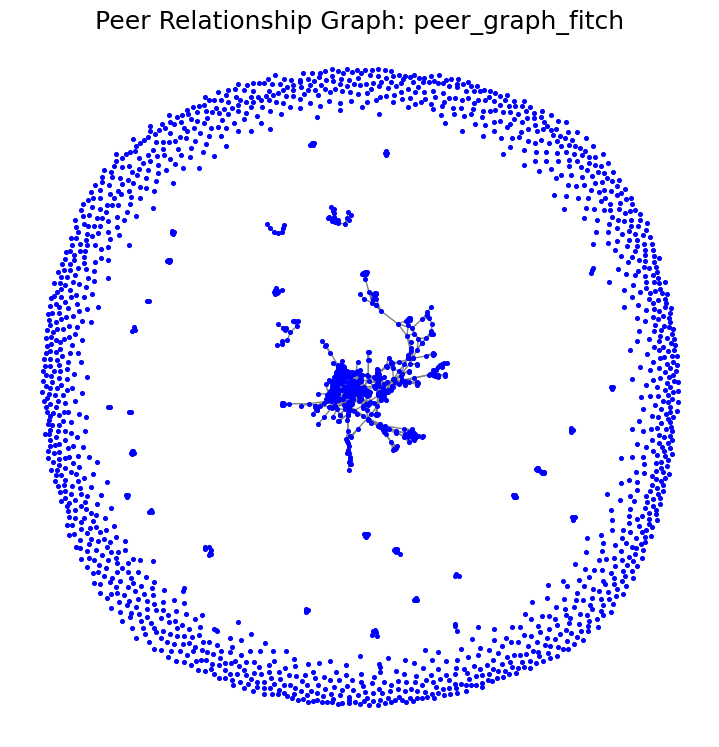

In [73]:
custom_colors = {
    "G_fitch": "blue",
    "G_xgb_fitch": "darkblue",
    "G_098_cluster_IMP": "maroon",
    "4_cat_thresh_98_naweighted": "red",
}
titles= ['peer_graph_cluster', 'peer_graph_xgb', 'peer_graph_new', 'peer_graph_fitch' ]

i = 0
# Iterate over all items in Bank_networks
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        graph.remove_edges_from(nx.selfloop_edges(graph))
        print(f"Processing graph for {title}:")
        print(f"Number of nodes: {graph.number_of_nodes()}")
        print(f"Number of edges: {graph.number_of_edges()}")
        plt.figure(figsize=(7, 7))  # Set the figure size
        pos = nx.spring_layout(graph)  # Use spring layout for better visualization
        nx.draw(
            graph,
            pos,
            with_labels=False,
            node_size=7,
            node_color=custom_colors[title],
            font_size=8,
            font_color='black',
            edge_color='gray'
        )
        plt.title(f"Peer Relationship Graph: {titles[i]}", fontsize = 18)
        plt.savefig(f"Tables/{titles[i]}.png", dpi=700, bbox_inches='tight')
        plt.show()
    i += 1
            

### Random networks

We create random networks to analyse them compared to our networks. Be aware that this can take very long for other graphs/ different thresholds.

In [74]:
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    if isinstance(graph, nx.Graph): 
    # Assuming Bank_network['Title']['Graph'] already exists
        # Create the random reference graph
        print(f"Number of nodes: {graph.number_of_nodes()}")
        print(f"Number of edges: {graph.number_of_edges()}")
        iterated_g =  nx.algorithms.smallworld.random_reference(graph, niter=1, connectivity = False, seed = 2025)

        # Add the new graph to the dictionary
        Bank_networks[title]['Random_graph'] = iterated_g
    print('Finished', title)


Number of nodes: 2127
Number of edges: 10648
Finished G_098_cluster_IMP
Number of nodes: 2127
Number of edges: 18549
Finished G_xgb_fitch
Number of nodes: 2127
Number of edges: 11836
Finished 4_cat_thresh_98_naweighted
Number of nodes: 2127
Number of edges: 1806
Finished G_fitch


### assortativity

In [75]:
from matplotlib.lines import Line2D
from scipy import stats

def get_x_y(G):
    # Step 1: Degree of each node
    degrees = dict(G.degree())  # Node degrees

    # Step 2: Average degree of the nearest neighbors
    adnn = nx.average_neighbor_degree(G)

    # Step 3: Filter out nodes with degree zero
    degree_to_adnn = {}
    zero_degree_count = 0  # Count nodes with degree zero
    for node in G.nodes():
        k = degrees[node]
        if k == 0:
            zero_degree_count += 1  # Increment zero degree count
            continue  # Skip nodes with degree zero
        if k not in degree_to_adnn:
            degree_to_adnn[k] = []
        degree_to_adnn[k].append(adnn[node])

    # Step 4: Calculate average k_nn(k) for each degree k
    x = []  # Degrees (k)
    y = []  # Average degree of nearest neighbors k_nn(k)
    for k, knn_values in degree_to_adnn.items():
        x.append(k)
        y.append(np.mean(knn_values))

    # Step 5: Sort data for better visualization
    x = np.array(x)
    y = np.array(y)
    sorted_indices = np.argsort(x)
    x = x[sorted_indices]
    y = y[sorted_indices]

    return x, y, zero_degree_count

def assortativity(G, iterated_g, title='FORGOT TITLE'):
    # Get x, y and zero-degree count for the original graph
    x, y, zero_degree_count = get_x_y(G)
    assortativity = nx.degree_assortativity_coefficient(G)

    # Get x, y and zero-degree count for the iterated graph
    x_it, y_it, zero_degree_count_it = get_x_y(iterated_g)
    assortativity_it = nx.degree_assortativity_coefficient(iterated_g)

    plt.figure(figsize=(11, 7.5))

    # Plot data points
    plt.scatter(x_it, y_it, alpha=0.7, label='Randomized Graph', color="maroon")
    plt.scatter(x, y, alpha=0.7, label='Original Graph', color="navy")
    # Plot regression line for the original graph
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    line = slope * x + intercept
    plt.plot(x, line, color='grey', label='Regression Line (Original)')

    # Plot regression line for the iterated graph
    slope_it, intercept_it, r_value_it, p_value_it, std_err_it = stats.linregress(x_it, y_it)
    line_it = slope_it * x_it + intercept_it
    plt.plot(x_it, line_it, color='black', linestyle='--', label='Regression Line (Randomized)')

    # Add labels, title, and legend
    plt.xlabel("Degree (k)", fontsize = 16, labelpad = 10)
    plt.ylabel("Average Degree of Nearest Neighbors k_nn(k)", fontsize = 16, labelpad = 20)
    plt.title(title + ": k_nn(k) vs Degree (k)", fontsize = 17, pad = 20)

    # Add text for correlations, assortativity, and zero-degree counts

    plt.text(0, -0.21, f'Assortativity (Original): {assortativity:.2f}\nAssortativity (Randomized): {assortativity_it:.2f}', 
             transform=plt.gca().transAxes, fontsize=16,
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))
    plt.text(0.5, -0.21, f'Zero-degree nodes (Original): {zero_degree_count}', 
             transform=plt.gca().transAxes, fontsize=16,
             bbox=dict(facecolor='white', edgecolor='black', boxstyle='round,pad=0.5'))

    plt.grid(True)
    plt.legend(fontsize = 15)
    plt.savefig(f"Tables/{title}.png", dpi=700, bbox_inches='tight')
    plt.show()

def assortativity(G, iterated_g, title='FORGOT TITLE'):
    # Get x, y and zero-degree count for the original graph
    x, y, zero_degree_count = get_x_y(G)
    assortativity = nx.degree_assortativity_coefficient(G)

    # Get x, y and zero-degree count for the iterated graph
    x_it, y_it, zero_degree_count_it = get_x_y(iterated_g)
    assortativity_it = nx.degree_assortativity_coefficient(iterated_g)

    plt.figure(figsize=(11, 7))

    # Plot data points
    scatter_original = plt.scatter(x, y, alpha=0.7, label='Original Graph', color="navy")
    scatter_randomized = plt.scatter(x_it, y_it, alpha=0.7, label='Randomized Graph', color="maroon")
    
    # Plot regression line for the original graph
    slope, intercept, r_value, p_value, std_err = stats.linregress(x, y)
    line = slope * x + intercept
    plt.plot(x, line, color='grey', label='Regression Line (Original)')

    # Plot regression line for the iterated graph
    slope_it, intercept_it, r_value_it, p_value_it, std_err_it = stats.linregress(x_it, y_it)
    line_it = slope_it * x_it + intercept_it
    plt.plot(x_it, line_it, color='black', linestyle='--', label='Regression Line (Randomized)')

    # Add labels, title, and legend
    plt.xlabel("Degree (k)", fontsize=16, labelpad=10)
    plt.ylabel("Average Degree of Nearest Neighbors k_nn(k)", fontsize=16, labelpad=20)
    plt.title(f"{title}: k_nn(k) vs Degree (k)", fontsize=17, pad=20)

    # Create custom legends for assortativity and zero-degree nodes
    custom_legend_entries = [
        f"Assortativity (Original): {assortativity:.2f}",
        f"Assortativity (Randomized): {assortativity_it:.2f}",
        f"Zero-degree nodes (Original): {zero_degree_count}"
    ]
    
    # Add these as dummy handles for the legend
    custom_legend_handles = [plt.Line2D([0], [0], color='white', label=entry) for entry in custom_legend_entries]
    
    # Add the legend
    plt.legend(handles=[scatter_original, scatter_randomized] + custom_legend_handles,
               fontsize=18)
    
    # Grid and save
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"Tables/{title}.png", dpi=700, bbox_inches='tight')
    plt.show()


In [76]:
titles= ['assortativity_cluster', 'assortativity_xgb', 'assortativity_new', 'assortativity_fitch' ]
titles[0]

'assortativity_cluster'

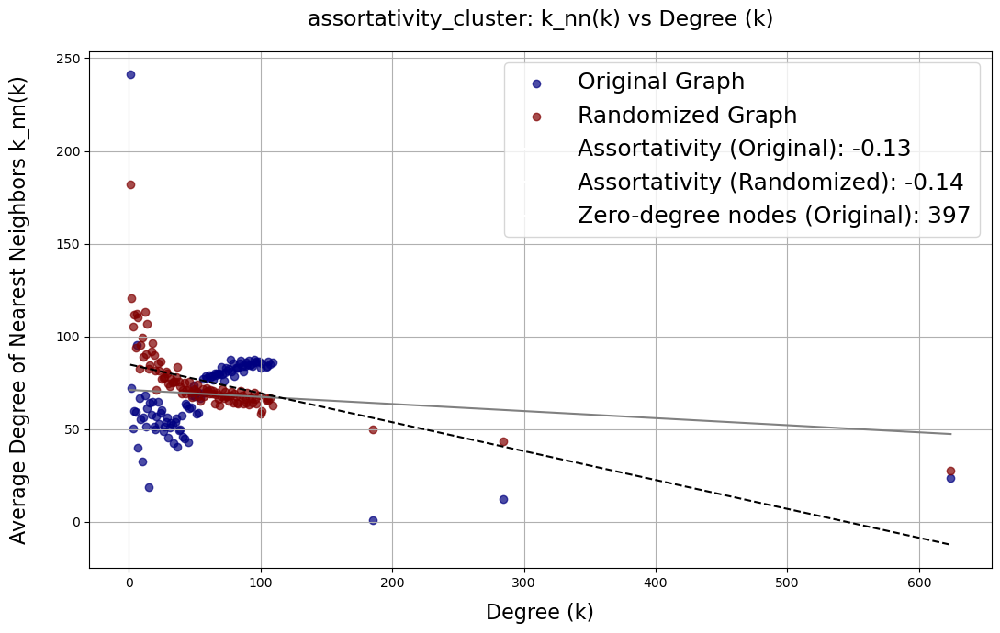

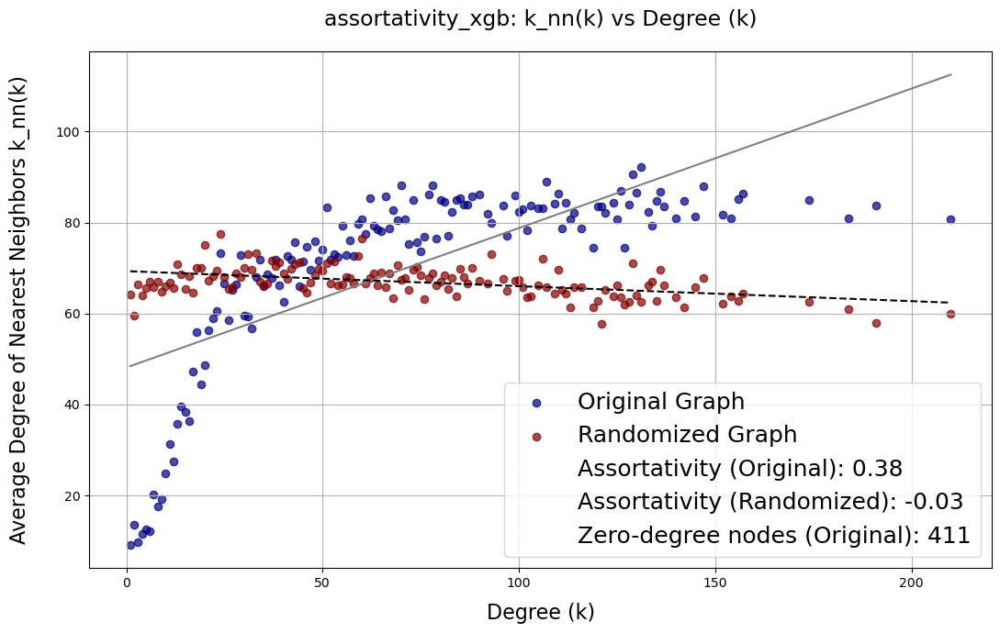

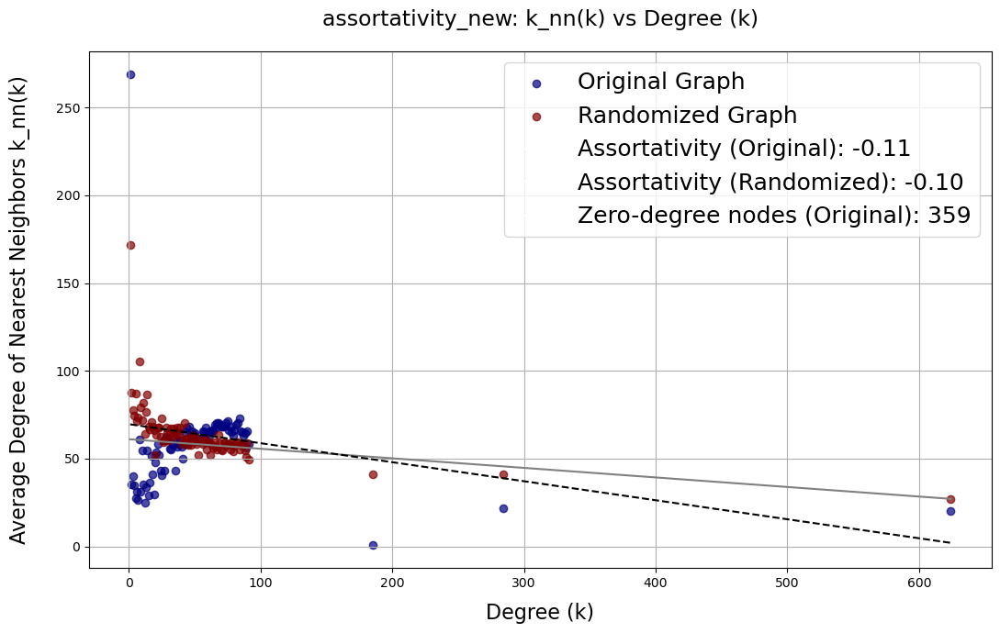

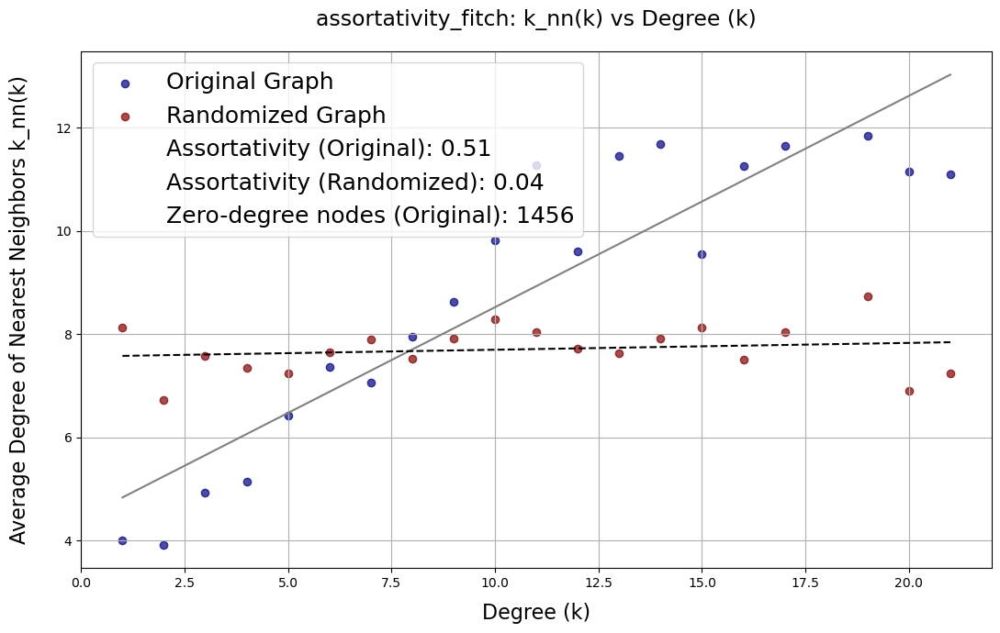

In [77]:
i = 0
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    iterated_g = data.get('Random_graph')

    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        assortativity(graph,iterated_g, titles[i])
    i += 1

### Degree Dist

Degree dist. both log and absolut. (Log only non-zero degree)

In [78]:
def degree_dist(g, title = 'FORGOT Title'):
    # degrees by node
    degrees = [degree for node, degree in g.degree() if degree > 0]
    degrees_all = [degree for node, degree in g.degree()]

    # Create alogarithmic binning
    binlog = np.logspace(np.log10(min(degrees)),np.log10(max(degrees)), 30)

    # Step 5: Plot the normalized degree distribution
    plt.figure(figsize=(9, 5))
    counts, bins, patches = plt.hist(degrees, bins=binlog, color='C1', edgecolor='black', density=True)    
    plt.xlabel("$k$")
    plt.ylabel("$p(k)$")
    plt.title(f'{title}: 0 degrees are excluded in log plot)')
    plt.xscale('log')
    plt.yscale('log')

    plt.show()

    # Create a linear binning instead of logarithmic binning
    binlin = np.linspace(min(degrees_all), max(degrees_all), 40)

    # Step 5: Plot the normalized degree distribution
    plt.figure(figsize=(9, 5))
    counts, bins, patches = plt.hist(degrees_all, bins=binlin, color='C1', edgecolor='black', density=True)    
    plt.xlabel("$k$")
    plt.ylabel("$p(k)$")
    plt.title(f'Normalized Degree Distribution - {title}')

    # Remove logarithmic scaling for normal distribution plot
    # plt.xscale('log')  # Removed
    # plt.yscale('log')  # Removed

    plt.show()

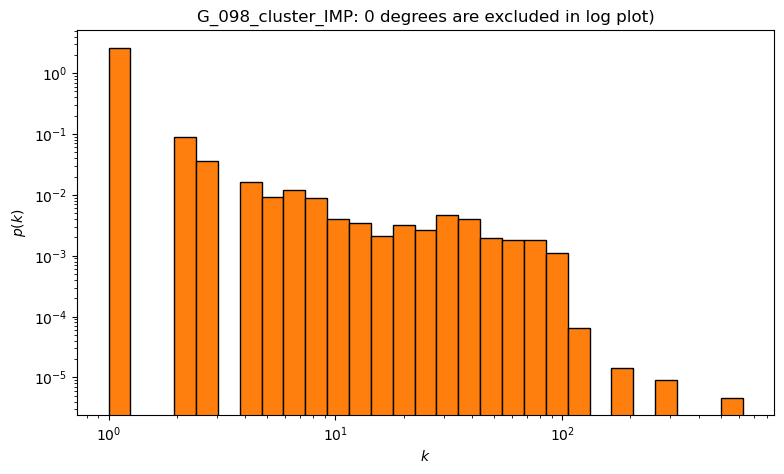

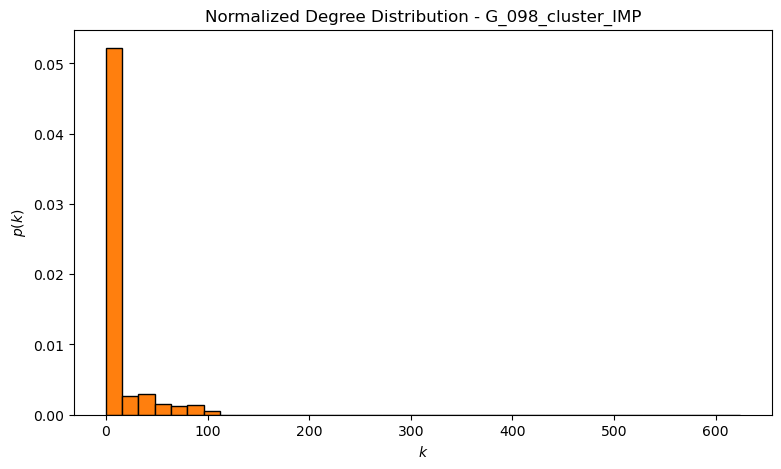

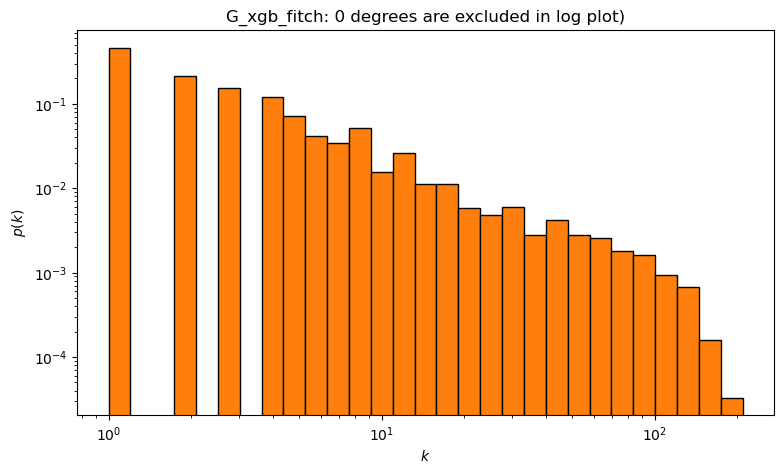

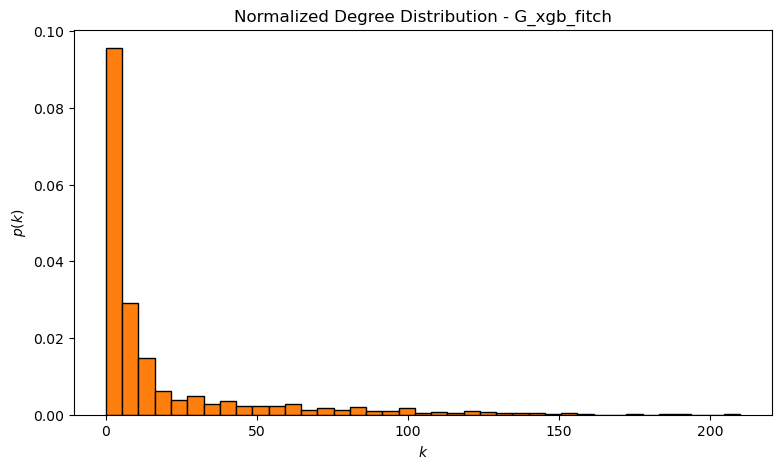

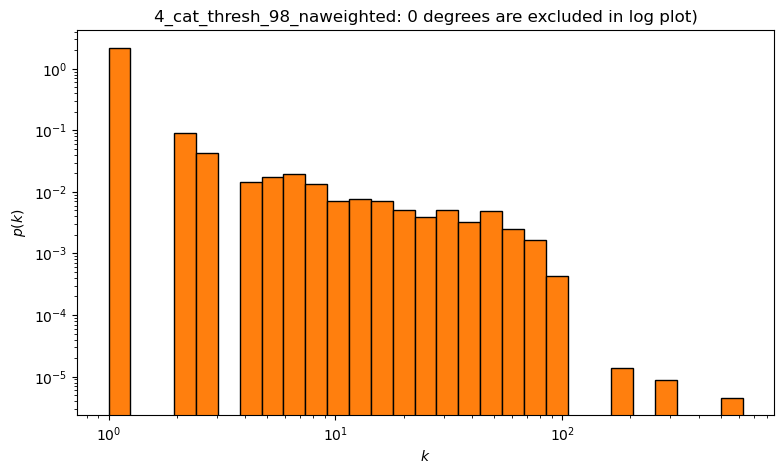

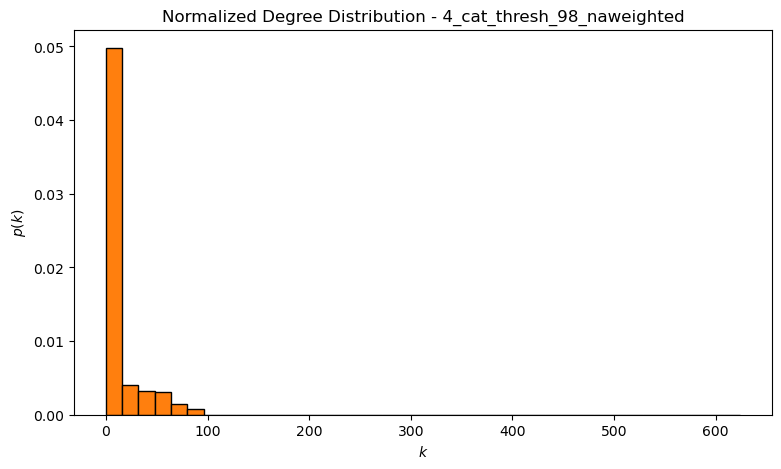

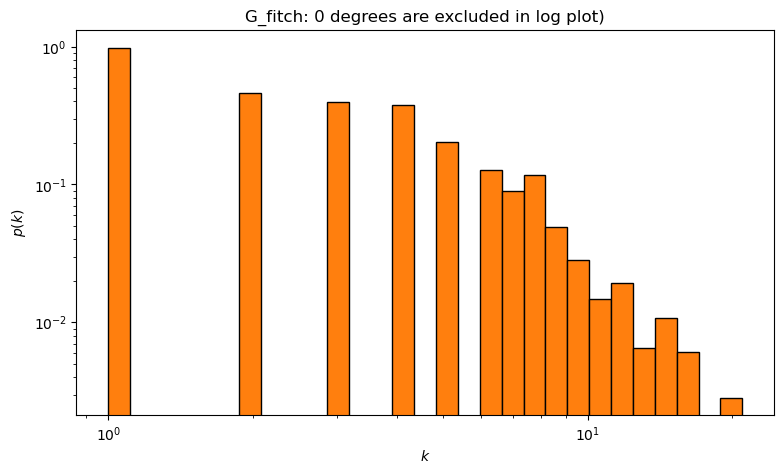

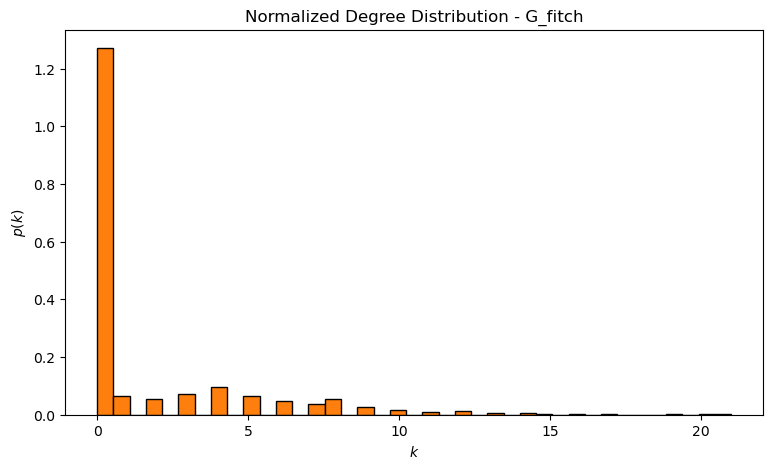

In [79]:
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        degree_dist(graph, title)

### Centrality measures

#### Calculate centralities

In [80]:
for title, data in Bank_networks.items():
    # Access the Graph object
    G = data.get('Graph')
    
    if isinstance(G, nx.Graph): 
    # Assuming Bank_network['Title']['Graph'] already exists
        # Create the random reference graph
        centralities = {
                "Degree Centrality": nx.degree_centrality(G),
                "Closeness Centrality": nx.closeness_centrality(G),
                "Betweenness Centrality": nx.betweenness_centrality(G),
                "Eigenvector Centrality": nx.eigenvector_centrality(G, max_iter=1000),
            }

        # Add the new graph to the dictionary
        Bank_networks[title]['centralities'] = centralities
    print('Finished', title)


Finished G_098_cluster_IMP
Finished G_xgb_fitch
Finished 4_cat_thresh_98_naweighted
Finished G_fitch


In [81]:
for title, data in Bank_networks.items():
    # Access the Graph object
    random_G = data.get('Random_graph')
    
    if isinstance(G, nx.Graph): 
    # Assuming Bank_network['Title']['Graph'] already exists
        # Create the random reference graph
        centralities = {
                "Degree Centrality": nx.degree_centrality(random_G),
                "Closeness Centrality": nx.closeness_centrality(random_G),
                "Betweenness Centrality": nx.betweenness_centrality(random_G),
                "Eigenvector Centrality": nx.eigenvector_centrality(random_G, max_iter=1000),
            }

        # Add the new graph to the dictionary
        Bank_networks[title]['centralities_random'] = centralities
    print('Finished', title)


Finished G_098_cluster_IMP
Finished G_xgb_fitch
Finished 4_cat_thresh_98_naweighted
Finished G_fitch


#### Histogram centralities original

In [82]:
def plot_centralities(G, centralities, bins=[10, 10, 10, 10], title="MISSING TITLE"):
    print(f'---------------------------------------------------------\nHere are the plots for: \033[1m {title}\033[0m')
    
    # Create a 2x2 grid of subplots
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    axs = axs.flatten()  # Flatten the axes for easier iteration

    # Loop through centralities and bins
    for i, ((centrality_name, centrality_values), bin_num) in enumerate(zip(centralities.items(), bins)):
        centrality_list = list(centrality_values.values())

        if bin_num == "log":
            # Logarithmic binning: Handle zero or negative values
            min_bin = np.min([v for v in centrality_list if v > 0])  # Avoid zero for log scale
            max_bin = np.max(centrality_list)

            # Create logarithmically spaced bins
            num_bins = 20
            bin_edges = np.logspace(np.log10(min_bin), np.log10(max_bin), num=num_bins)

            # Create histogram with log-scaled x-axis
            axs[i].hist(centrality_list, bins=bin_edges, color='skyblue', edgecolor='black')
            axs[i].set_xscale('log')  # Set x-axis to log scale
            axs[i].set_yscale('log')  # Optional: log scale for y-axis
        else:
            if bin_num == "betwe":
                # Log scale for betweenness centrality histogram
                axs[i].hist(centrality_list, bins=20, color='skyblue', edgecolor='black')
                axs[i].set_yscale('log')  # Log scale for y-axis
            else:
                # Standard histogram
                axs[i].hist(centrality_list, bins=bin_num, color='skyblue', edgecolor='black')

        axs[i].set_title(f'{centrality_name}')
        axs[i].set_xlabel(f'{centrality_name}')
        axs[i].set_ylabel('Frequency')

    plt.tight_layout()
    plt.show()





---------------------------------------------------------
Here are the plots for:  G_098_cluster_IMP


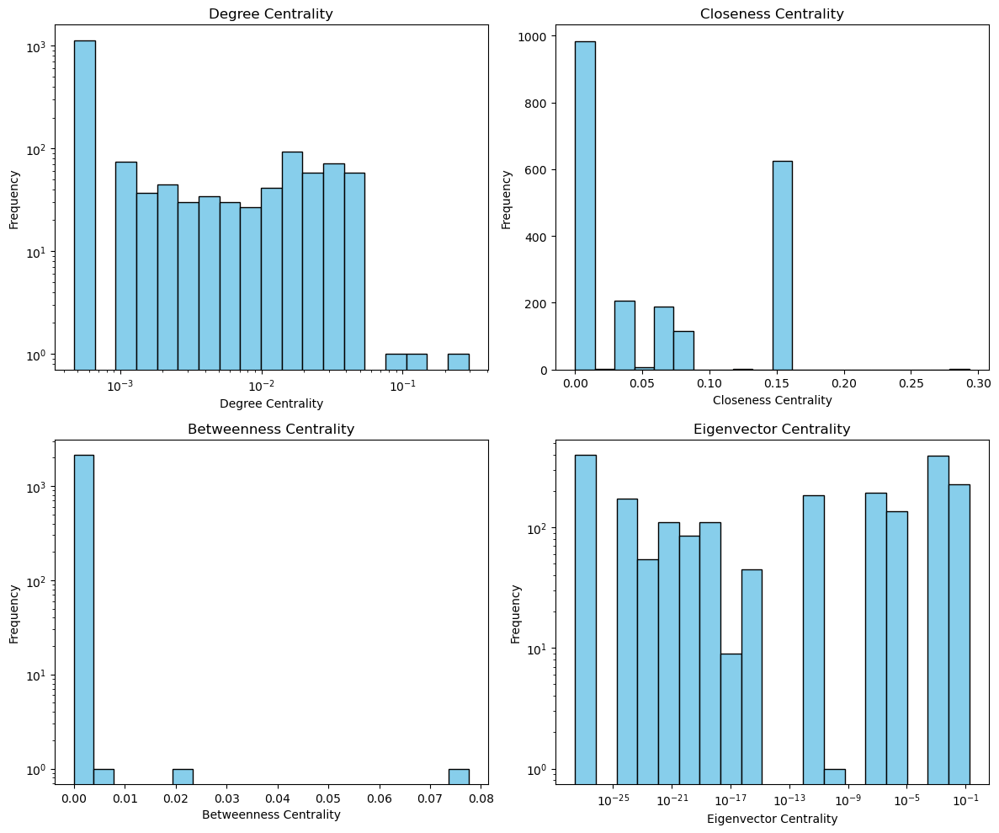

---------------------------------------------------------
Here are the plots for:  G_xgb_fitch


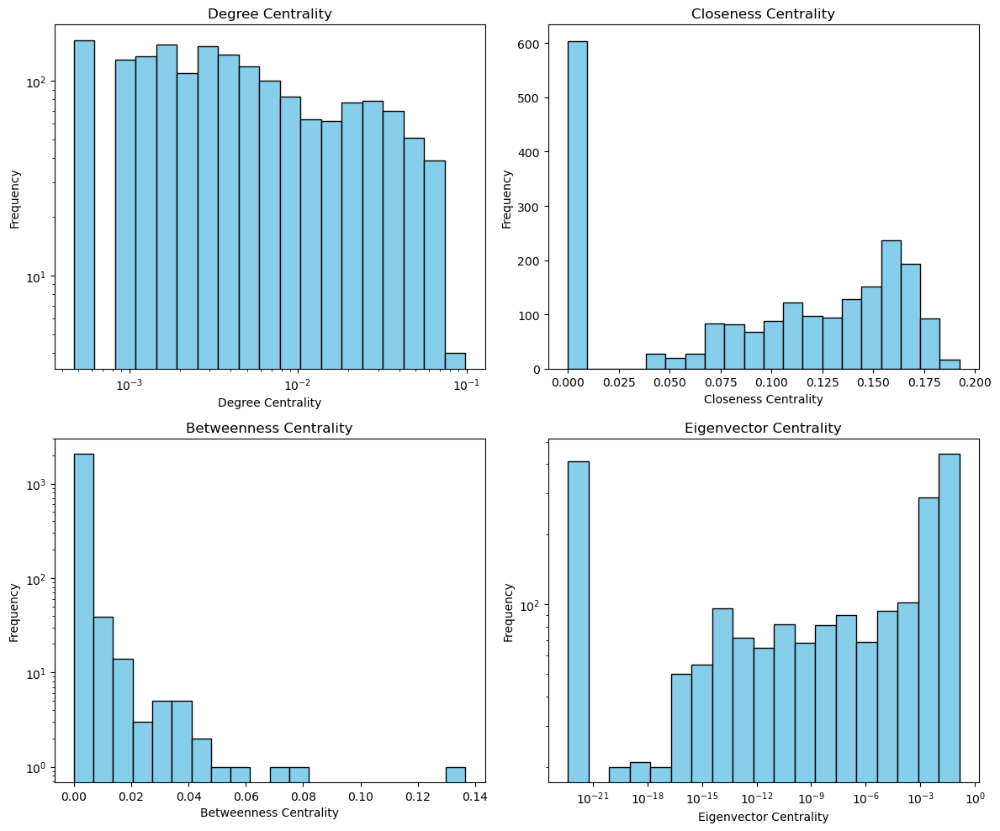

---------------------------------------------------------
Here are the plots for:  4_cat_thresh_98_naweighted


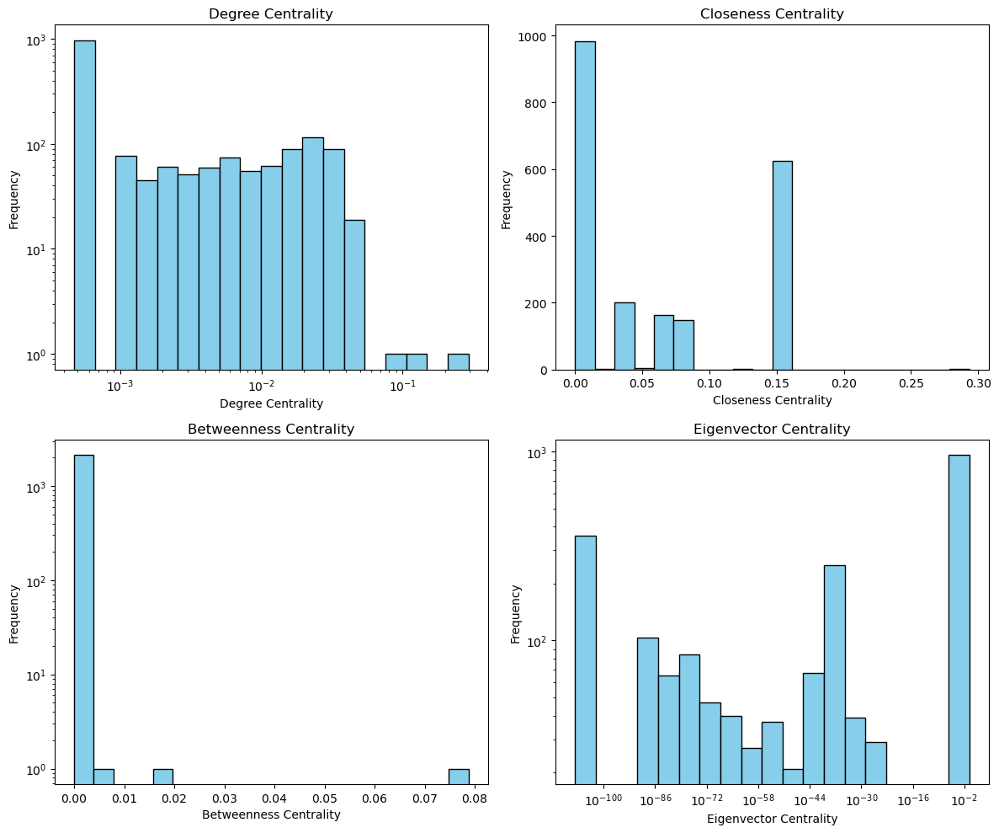

---------------------------------------------------------
Here are the plots for:  G_fitch


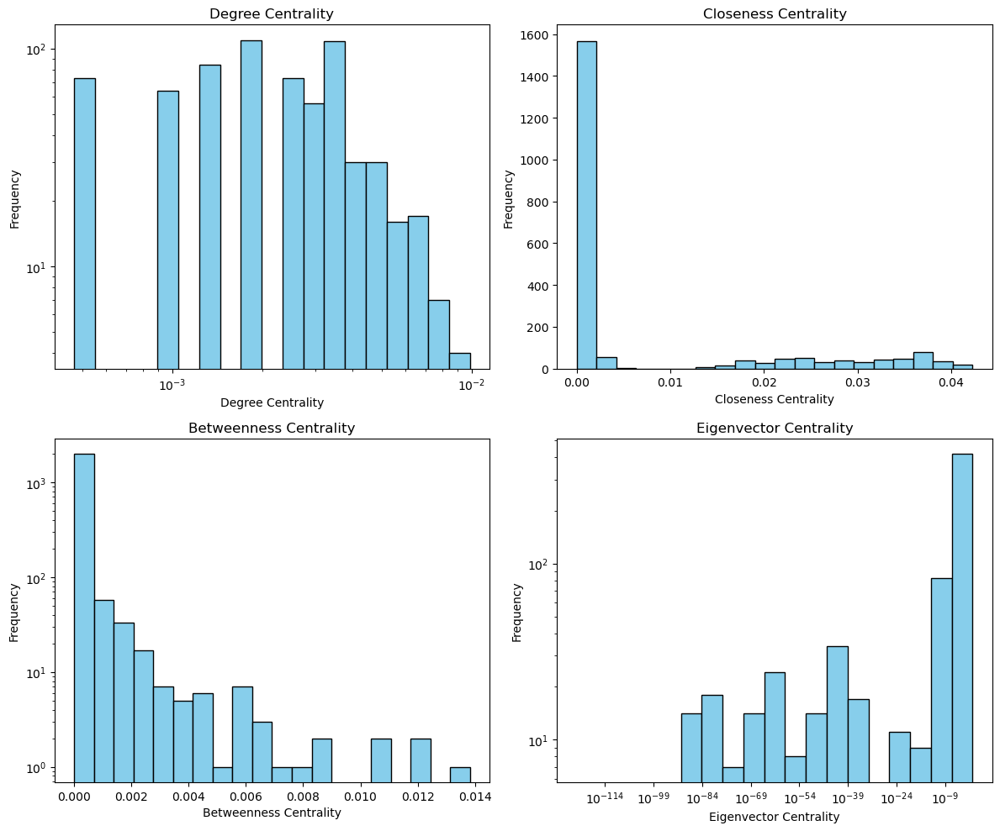

In [83]:
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    centralities = data.get('centralities')
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        plot_centralities(G, centralities, bins=["log", 20, "betwe", "log"], title = title)

#### VS plot - centralities

In [84]:
def VS_plot_centralities(G, centralities, title="MISSING TITLE"):
    print(f'---------------------------------------------------------\nHere are the Scatter plots for: \033[1m {title}\033[0m')

    # Create a DataFrame from the centralities
    df_centralities = pd.DataFrame(centralities)

    # Create Index pairs to access each of the centrality pairs.
    # Names: here to access the actual centralities
    centrality_names = df_centralities.columns
    # Pairs: to make sure we only plot each plot once
    centrality_pairs = [(i, j) for i in range(len(centrality_names)) for j in range(i + 1, len(centrality_names))]

    # Subplots to get a good view
    fig, axs = plt.subplots(2, 3, figsize=(15, 10))
    axs = axs.flatten()

    for Pair, (i, j) in enumerate(centrality_pairs):
        centrality_name_1 = centrality_names[i]
        centrality_name_2 = centrality_names[j]

        # Scatter plot
        axs[Pair].scatter(df_centralities[centrality_name_1], df_centralities[centrality_name_2], color="blue", edgecolor="black")
        axs[Pair].set_xlabel(centrality_name_1)
        axs[Pair].set_ylabel(centrality_name_2)
        axs[Pair].set_title(f"{centrality_name_1} vs {centrality_name_2}")

        # Compute Pearson, Spearman, and Kendall correlations
        pearson_corr, _ = pearsonr(df_centralities[centrality_name_1], df_centralities[centrality_name_2])
        spearman_corr, _ = spearmanr(df_centralities[centrality_name_1], df_centralities[centrality_name_2])
        kendall_corr, _ = kendalltau(df_centralities[centrality_name_1], df_centralities[centrality_name_2])

        # Annotate plot with correlation coefficients
        axs[Pair].text(0.05, 0.95, f"Pearson: {pearson_corr:.2f}\nSpearman: {spearman_corr:.2f}\nKendall: {kendall_corr:.2f}",
                      transform=axs[Pair].transAxes, verticalalignment='top', bbox=dict(facecolor='white'))

    plt.tight_layout()
    plt.show()



---------------------------------------------------------
Here are the Scatter plots for:  G_098_cluster_IMP


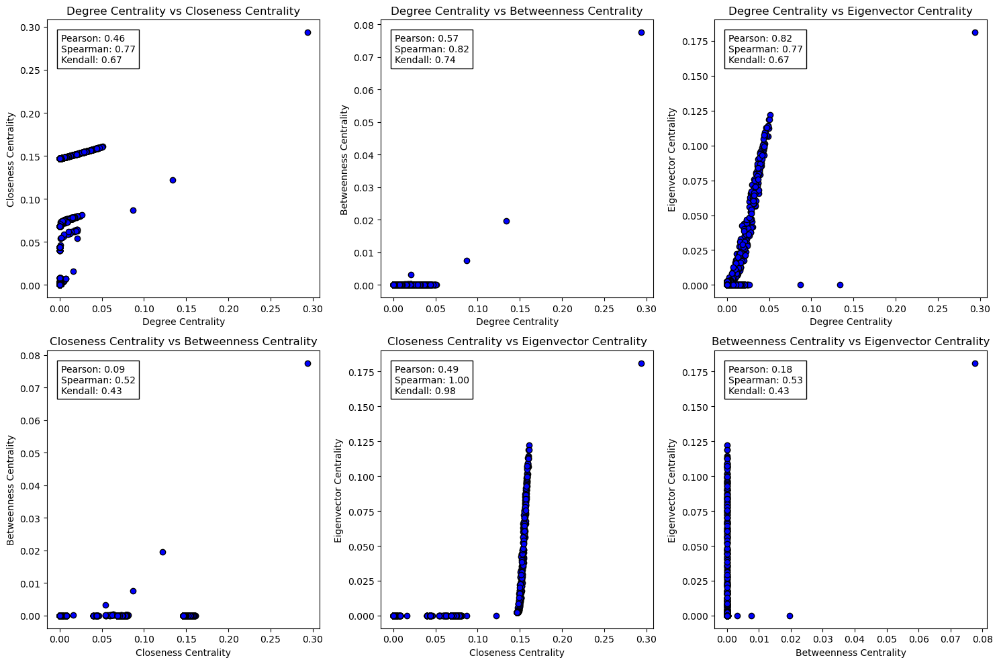

---------------------------------------------------------
Here are the Scatter plots for:  G_xgb_fitch


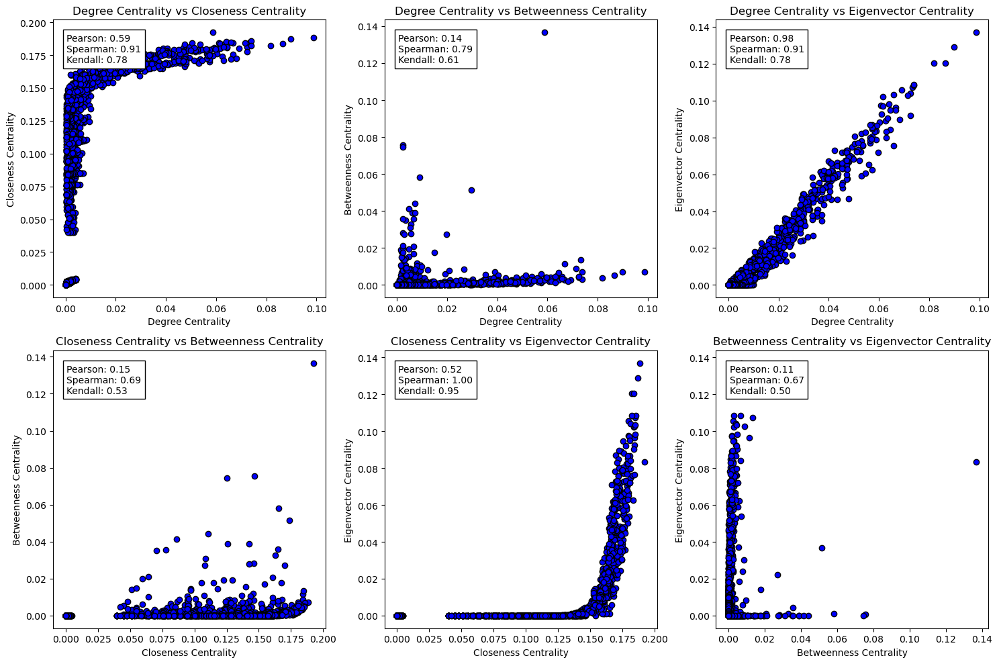

---------------------------------------------------------
Here are the Scatter plots for:  4_cat_thresh_98_naweighted


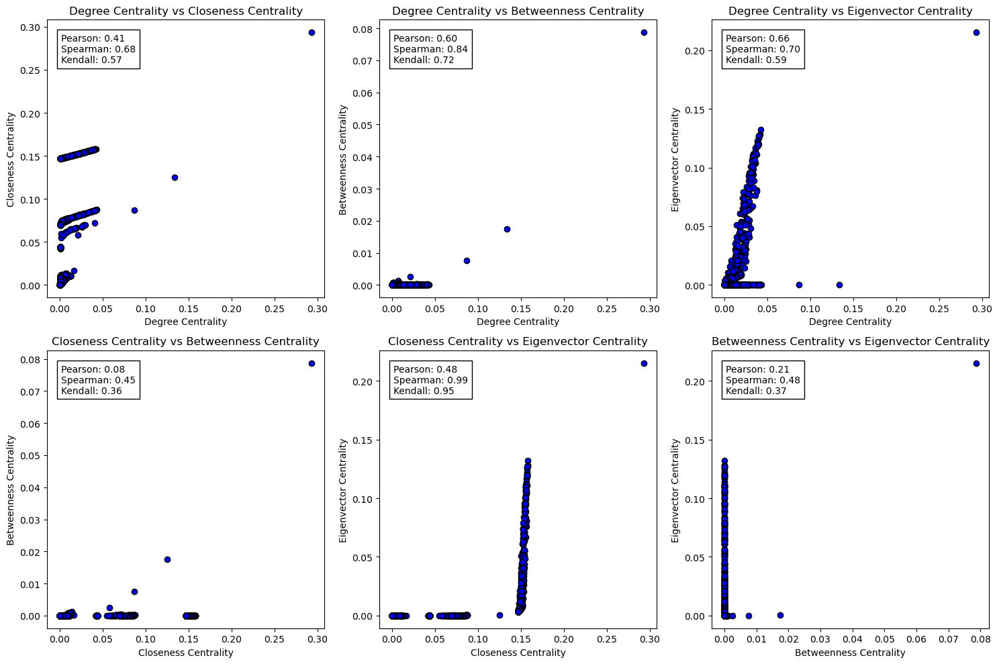

---------------------------------------------------------
Here are the Scatter plots for:  G_fitch


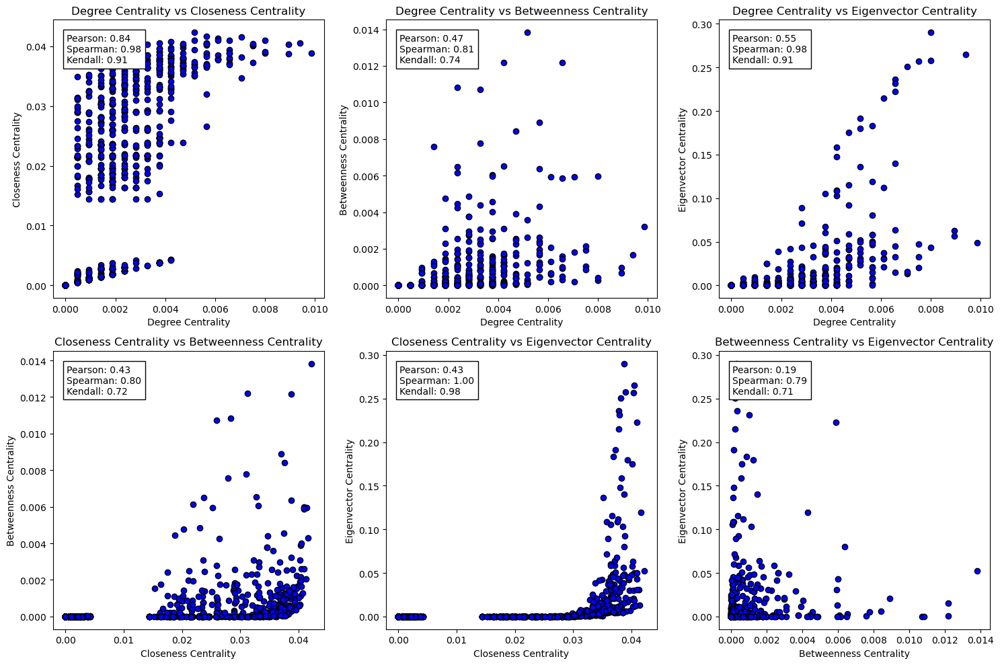

In [85]:
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    centralities = data.get('centralities')
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        VS_plot_centralities(G, centralities, title=title)

#### Original vs. random

In [86]:

from scipy.stats import pearsonr

def centralities_random_v_original(G, centralities, centralities_random, title="MISSING TITLE"):
    print(f'---------------------------------------------------------\nComparison of the Random and Original Network\'s centrality measure for: \033[1m {title}\033[0m')
    
    # Create scatter plots
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))
    axs = axs.flatten()

    for i, centrality_name in enumerate(centralities.keys()):
        # Extract centrality dictionaries for original and random networks
        centrality_original = centralities[centrality_name]
        centrality_random = centralities_random[centrality_name]

        # Convert centrality dictionaries to lists of values
        original_centrality = list(centrality_original.values())
        random_centrality = list(centrality_random.values())

        # Scatter plot
        axs[i].scatter(original_centrality, random_centrality, color="blue", edgecolor="black")
        axs[i].set_xlabel("Original Network")
        axs[i].set_ylabel("Randomized Network")
        axs[i].set_title(f"{centrality_name}: Original vs Random")

        # Compute Pearson correlation
        pearson_corr, _ = pearsonr(original_centrality, random_centrality)

        # Annotate plot with correlation coefficient
        axs[i].text(0.05, 0.95, f"Pearson: {pearson_corr:.2f}",
                    transform=axs[i].transAxes, verticalalignment='top',
                    bbox=dict(facecolor='white', alpha=0.5))

    plt.tight_layout()
    plt.show()


---------------------------------------------------------
Comparison of the Random and Original Network's centrality measure for:  G_098_cluster_IMP


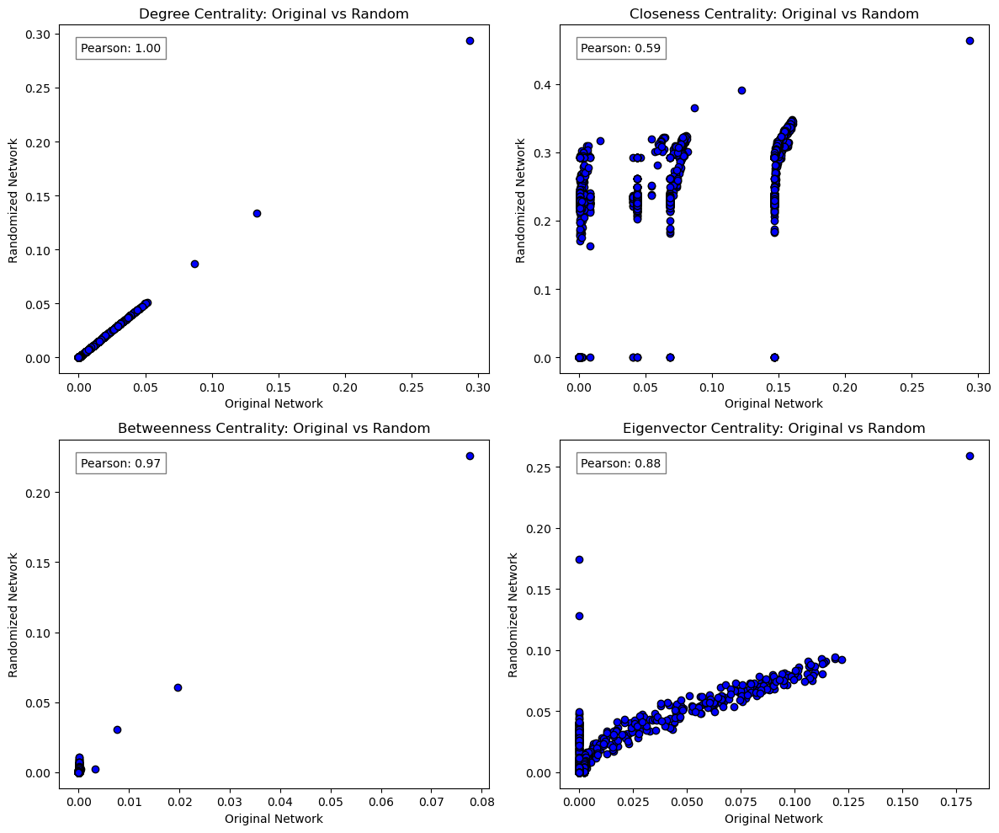

---------------------------------------------------------
Comparison of the Random and Original Network's centrality measure for:  G_xgb_fitch


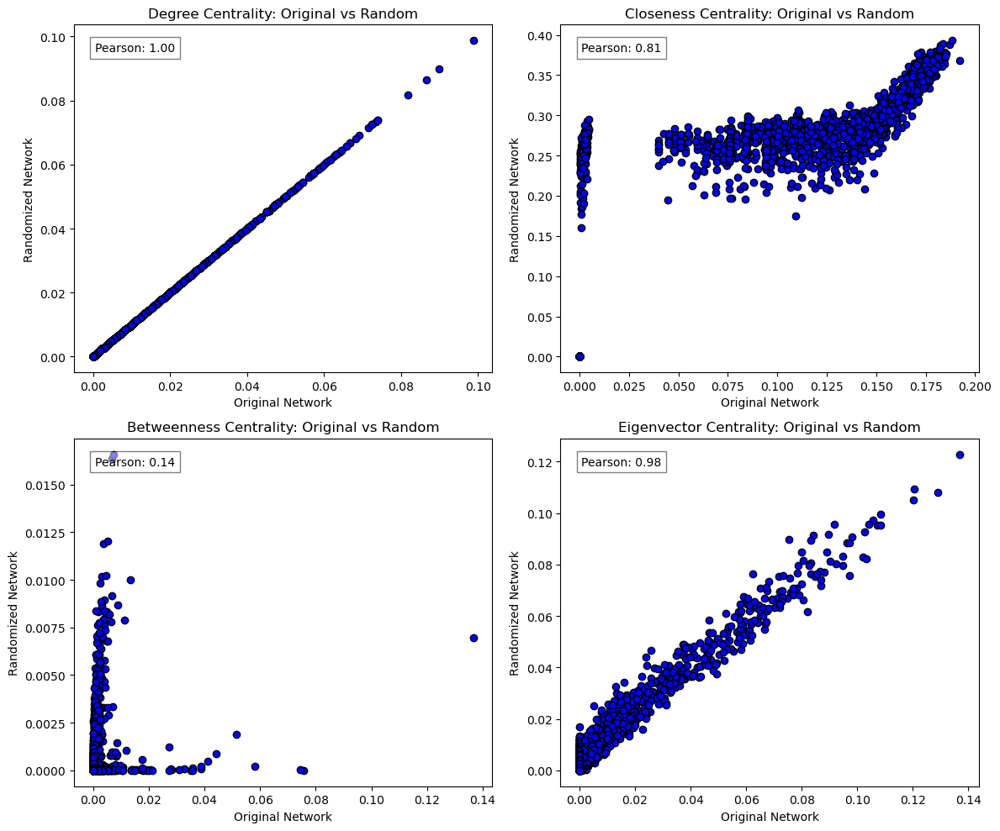

---------------------------------------------------------
Comparison of the Random and Original Network's centrality measure for:  4_cat_thresh_98_naweighted


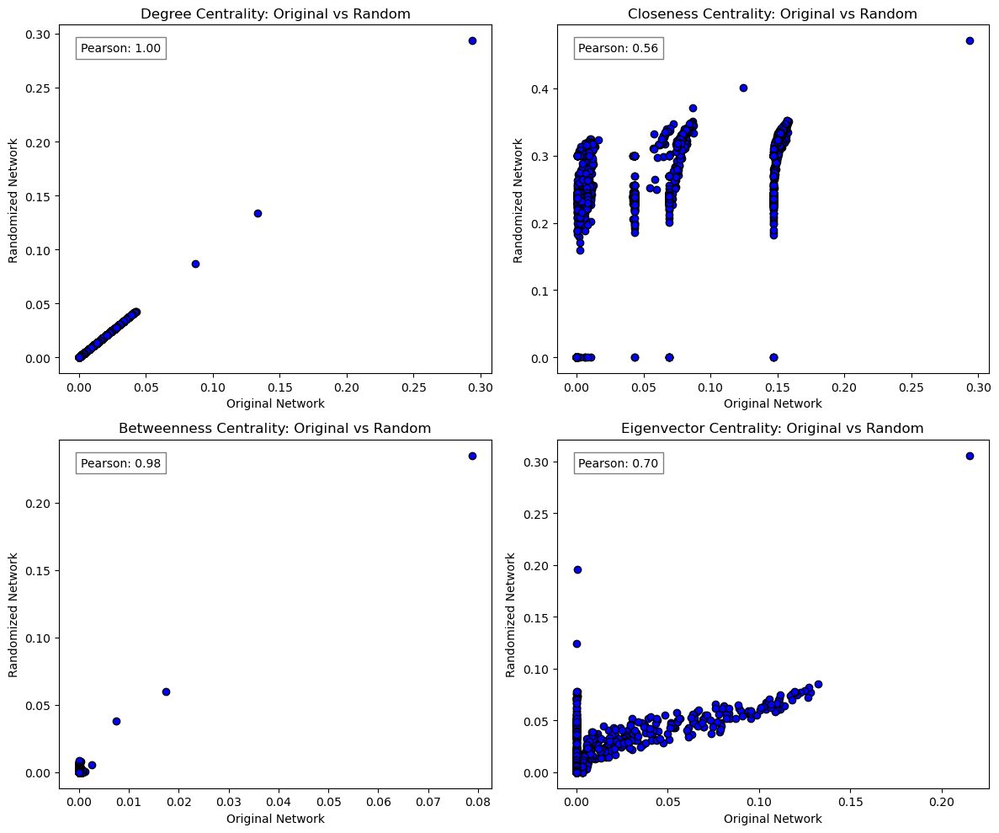

---------------------------------------------------------
Comparison of the Random and Original Network's centrality measure for:  G_fitch


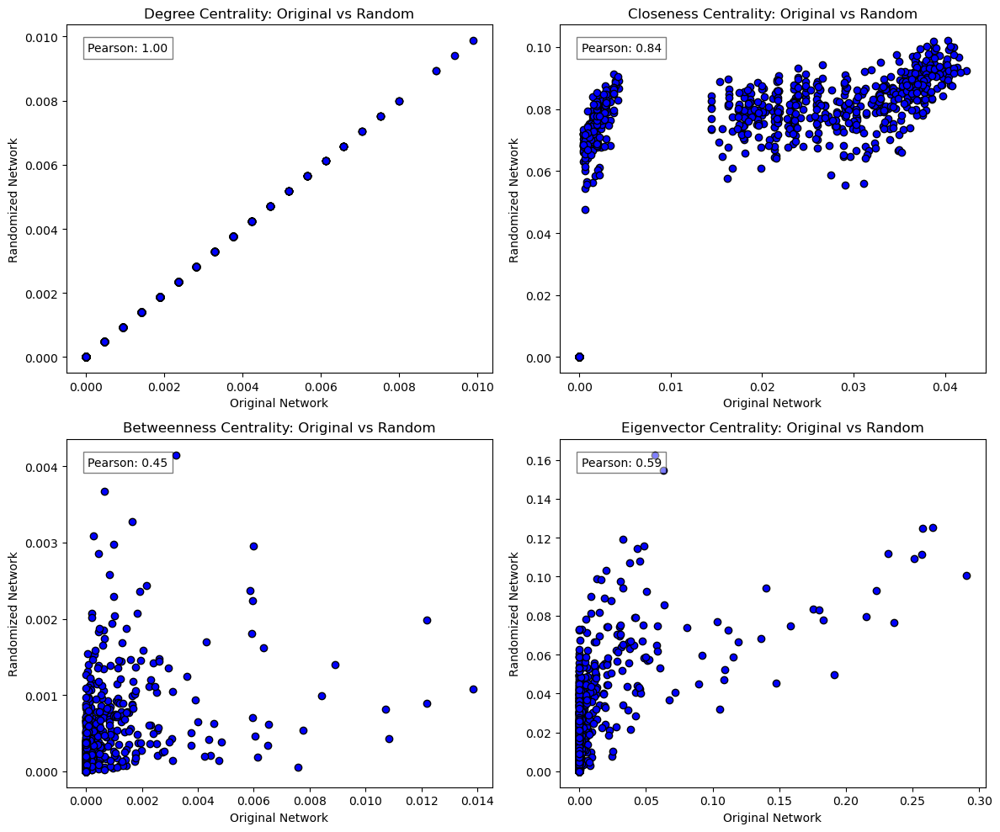

In [87]:
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    centralities = data.get('centralities')
    centralities_random = data.get('centralities_random')
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        centralities_random_v_original(G, centralities, centralities_random, title=title)


### Communities

In [88]:
# Define a function to color edges based on whether they are internal or external to communities
def get_edge_styles(G, communities):
    community_edges = set()
    for community in communities:
        for node1, node2 in itertools.combinations(community, 2):
            if G.has_edge(node1, node2):
                community_edges.add((node1, node2))

    edge_colors = []
    edge_styles = []
    for edge in G.edges():
        if edge in community_edges or (edge[1], edge[0]) in community_edges:
            edge_colors.append('black')  # Internal edges
            edge_styles.append('solid')  # Solid lines for internal edges
        else:
            edge_colors.append('grey')  # Grey for external edges
            edge_styles.append('dashed')  # Dashed lines for external edges
    return edge_colors, edge_styles

# Define a function to plot the graph with nodes colored by their community
def plot_communities(G, communities, pos, ax):
    community_map = {}
    for i, community in enumerate(communities):
        for node in community:
            community_map[node] = i

    # Generate node colors
    node_colors = [community_map[node] for node in G.nodes()]

    # Draw nodes
    nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.jet, ax=ax, node_size=10)

    # Get edge colors and styles
    edge_colors, edge_styles = get_edge_styles(G, communities)

    # Draw edges
    nx.draw_networkx_edges(G, pos, edge_color=edge_colors, style=edge_styles, ax=ax, width=2.0)

    # Add legend for edge colors and styles
    legend_elements = [Line2D([0], [0], color='black', lw=2, label='Internal edges'),
                       Line2D([0], [0], color='grey', lw=2, linestyle='--', label='External edges')]
    ax.legend(handles=legend_elements, loc='upper right')

def communities_plot(G, title = 'Bank_data', only_with_degree_above_zero = False):
    dataset_name = title

    if only_with_degree_above_zero == True:
        G = G.subgraph([node for node, degree in G.degree() if degree > 0]).copy()

    fig, axes = plt.subplots(1, 2, figsize=(22, 12))
    pos = nx.spring_layout(G, seed=42)  # Layout for consistent positioning

    # Greedy Modularity Communities
    greedy_communities = list(nx.community.greedy_modularity_communities(G))
    nr_greedy =  len(greedy_communities)
    axes[0].set_title(f'{dataset_name} - Greedy Modularity')
    plot_communities(G, greedy_communities, pos, ax=axes[0])

    # Label Propagation Communities
    label_communities = list(nx.community.label_propagation_communities(G))
    nr_lable_prop = len(label_communities)
    axes[1].set_title(f'{dataset_name} - Label Propagation')
    plot_communities(G, label_communities, pos, ax=axes[1])

    plt.tight_layout()
    plt.show()
    return nr_greedy, nr_lable_prop

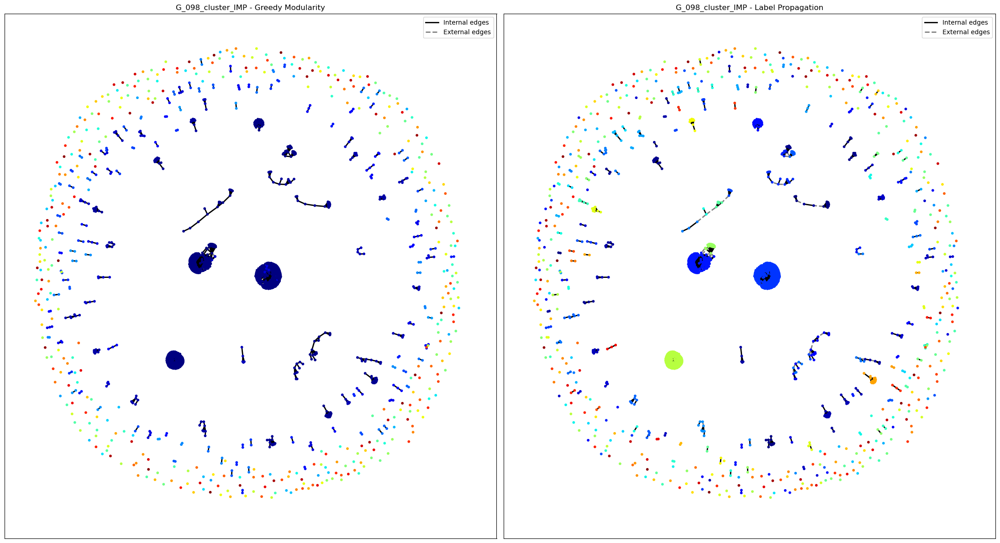

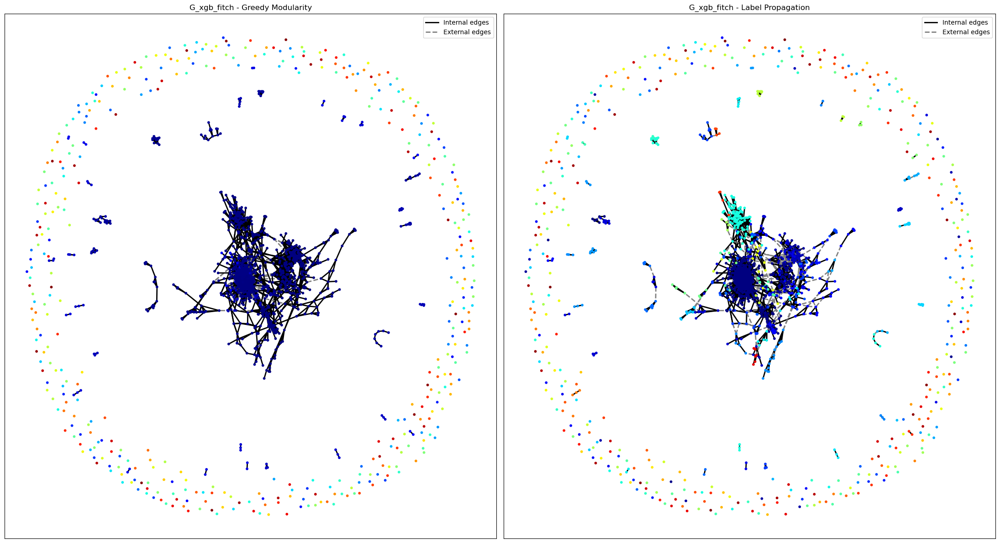

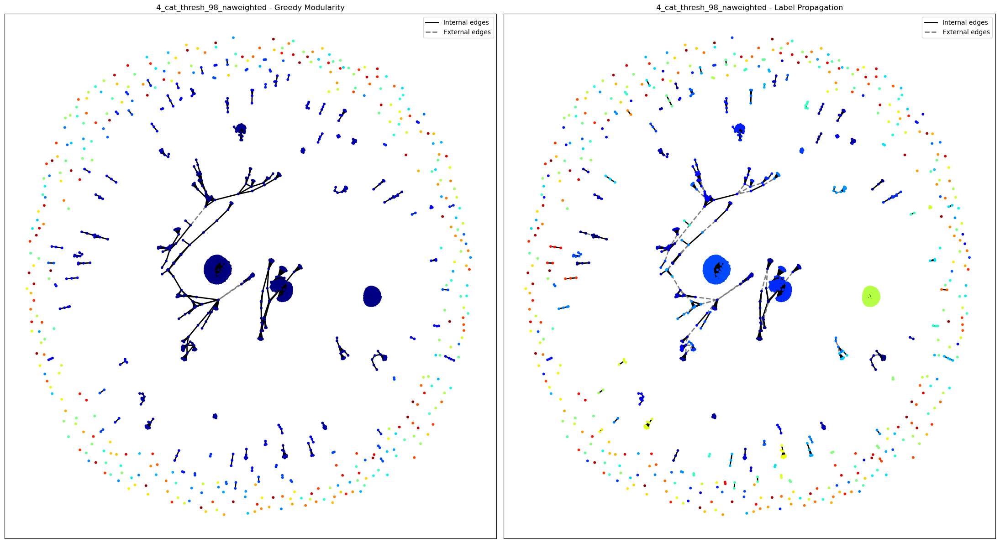

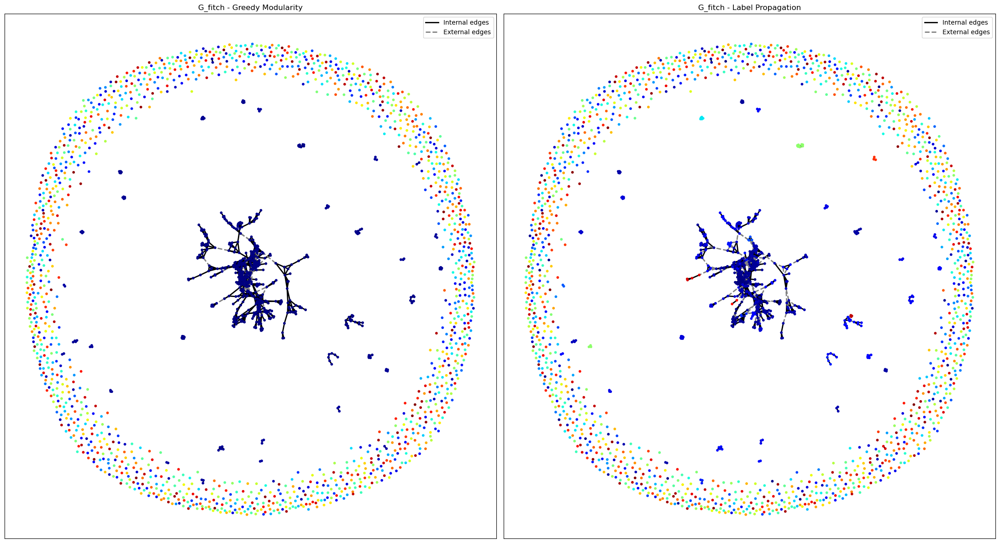

In [89]:
nr_communities_greedy = {}
nr_communities_label = {}
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        nr_communities_greedy[title], nr_communities_label[title] = communities_plot(graph, title)


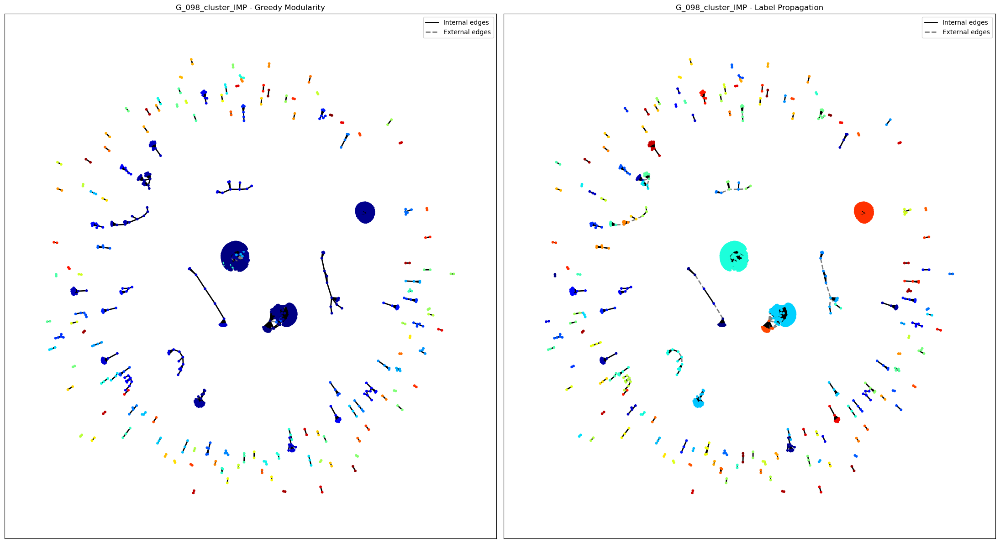

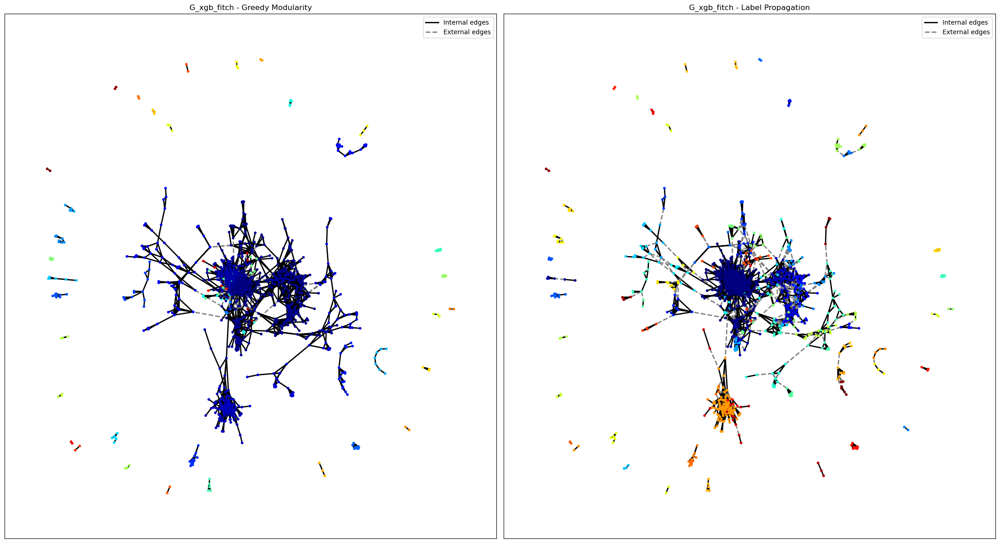

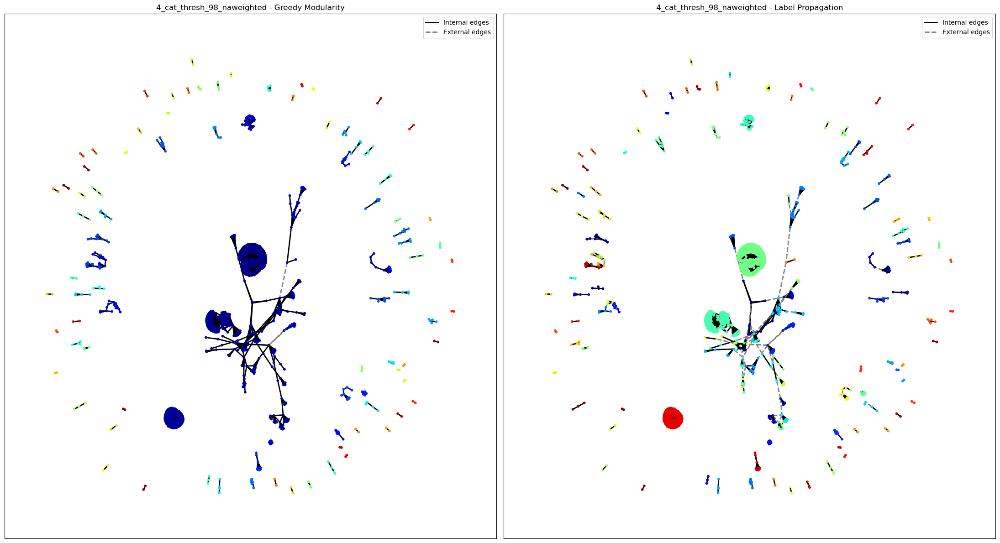

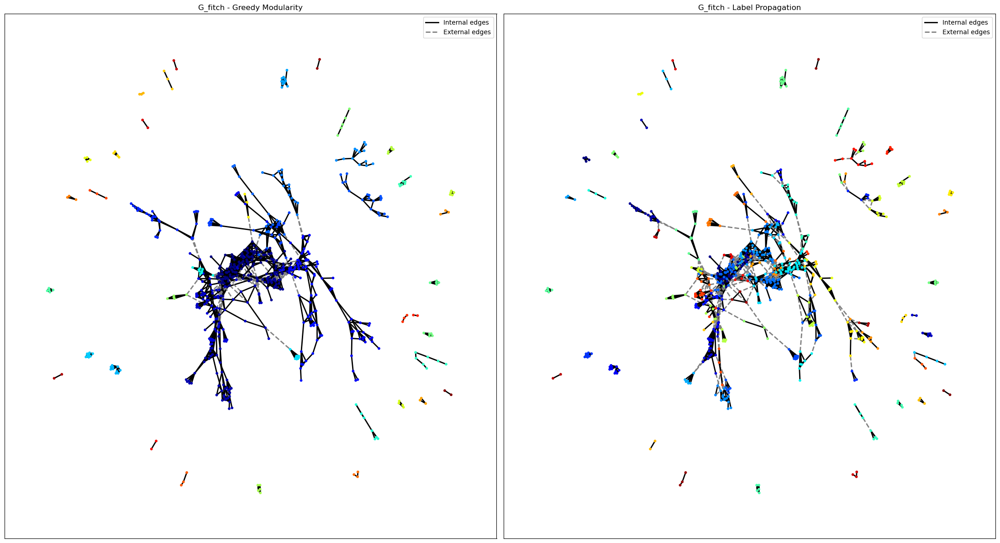

In [90]:

for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        communities_plot(graph, title, only_with_degree_above_zero=True)


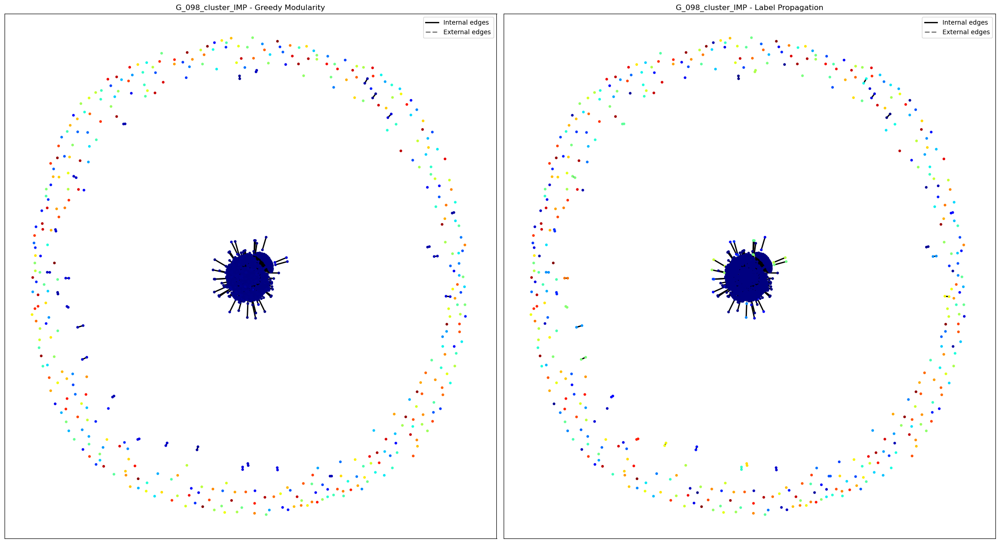

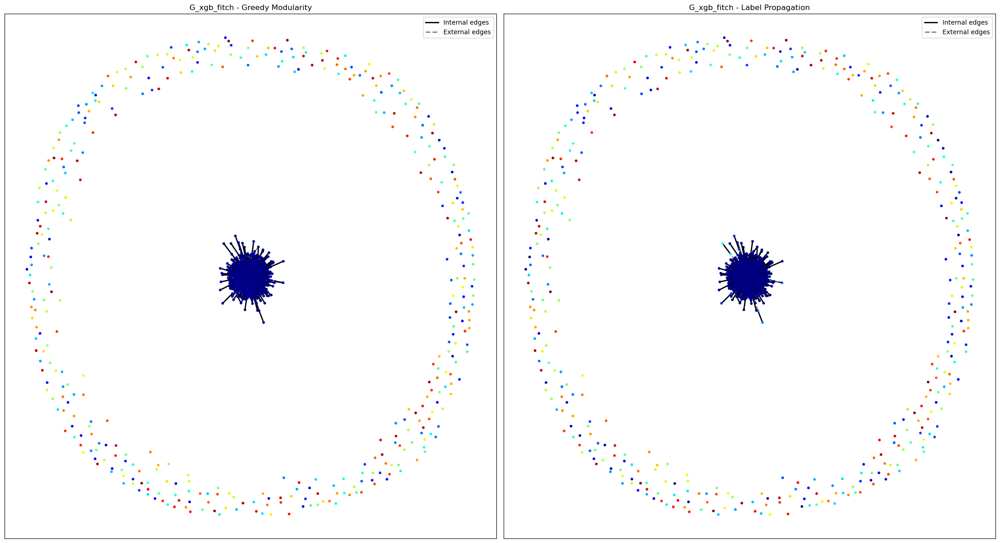

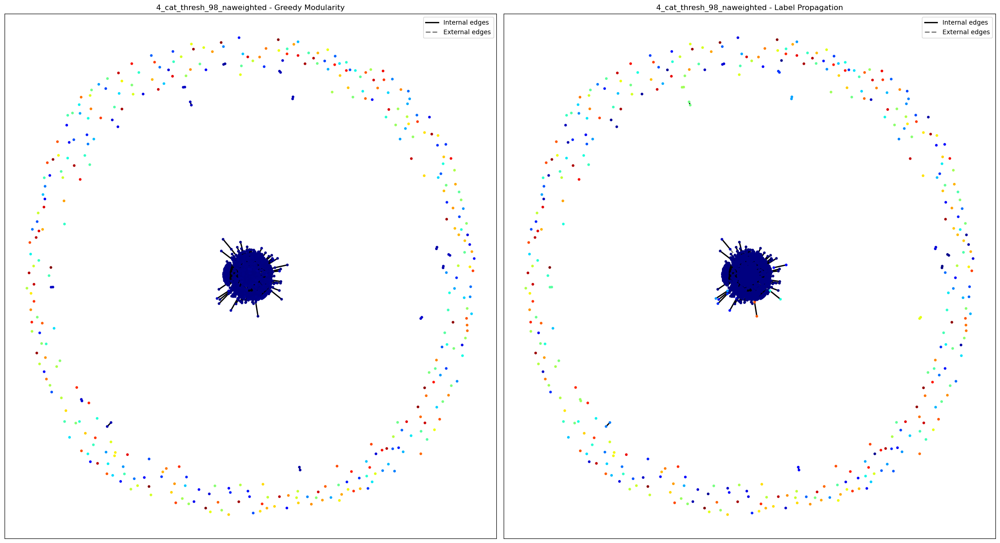

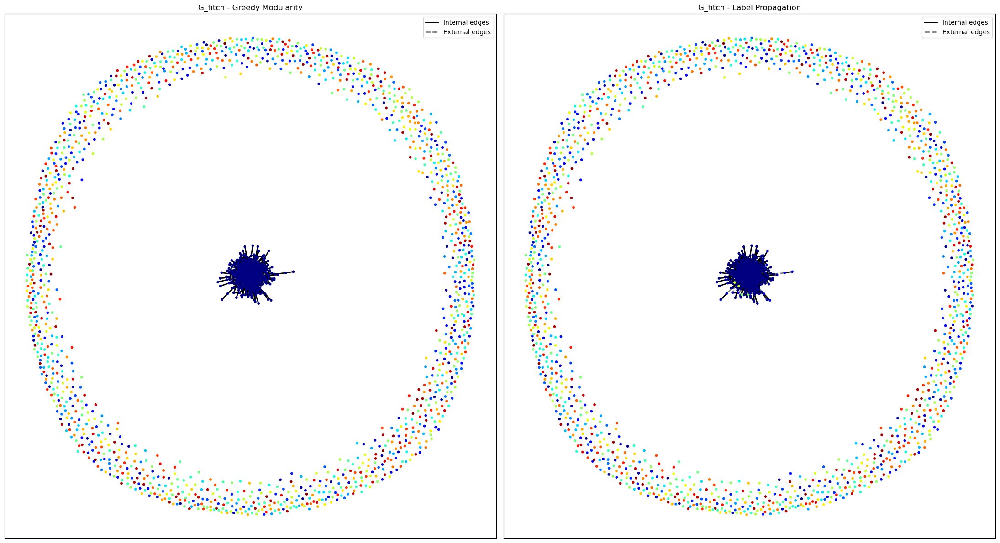

In [91]:
nr_communities_greedy_rand = {}
nr_communities_label_rand = {}

for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Random_graph')
    
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        nr_communities_greedy_rand[title], nr_communities_label_rand[title] = communities_plot(graph, title)


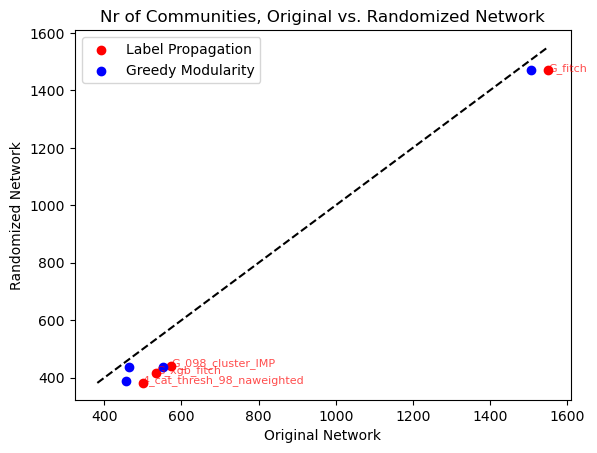

In [92]:
# Plot the number of communities for the randomized vs. the original network
# Ensure both dictionaries have the same keys
if nr_communities_greedy.keys() != nr_communities_greedy_rand.keys():
    raise ValueError("Dictionaries must have the same keys to plot!")

if nr_communities_label.keys() != nr_communities_label_rand.keys():
    raise ValueError("Dictionaries must have the same keys to plot!")

# Extract values based on the keys
x_values = [nr_communities_greedy[key] for key in nr_communities_greedy.keys()]
y_values = [nr_communities_greedy_rand[key] for key in nr_communities_greedy_rand.keys()]

x_values2 = [nr_communities_label[key] for key in nr_communities_label.keys()]
y_values2 = [nr_communities_label_rand[key] for key in nr_communities_label_rand.keys()]

# Scatter plot for Label Propagation
plt.scatter(x_values2, y_values2, color='red', label='Label Propagation')
for i, key in enumerate(nr_communities_label.keys()):
    plt.text(x_values2[i], y_values2[i], key, fontsize=8, color='red', alpha=0.7)

# Scatter plot for Greedy Modularity
plt.scatter(x_values, y_values, color='blue', label='Greedy Modularity')


# Add labels and title
plt.xlabel('Original Network')
plt.ylabel('Randomized Network')
plt.title('Nr of Communities, Original vs. Randomized Network')
plt.legend()

# Plot the y = x line
min_value = min(min(x_values + x_values2), min(y_values + y_values2))
max_value = max(max(x_values + x_values2), max(y_values + y_values2))
plt.plot([min_value, max_value], [min_value, max_value], color='black', linestyle='--', label='y = x')

# Display
plt.show()

### General Stats

Calculation of different stats about each of the networks.

In [93]:
import networkx as nx
import pandas as pd
from networkx.algorithms.community import greedy_modularity_communities, modularity

# Function to compute network statistics
def compute_network_stats(G, name="Network"):
    # Ensure largest connected component is computed if needed
    largest_cc = max(nx.connected_components(G), key=len)
    lcc_subgraph = G.subgraph(largest_cc)

    # Compute metrics
    stats = {
        "Network Name": name,
        "Number of Nodes": G.number_of_nodes(),
        "Number of Edges": G.number_of_edges(),
        "Average Degree": sum(dict(G.degree()).values()) / G.number_of_nodes(),
        "Density": nx.density(G),
        "Largest Connected Component (Nodes)": lcc_subgraph.number_of_nodes(),
        "Largest Connected Component (Edges)": lcc_subgraph.number_of_edges(),
        "Assortativity": nx.degree_assortativity_coefficient(G),
        "Average Clustering Coefficient": nx.average_clustering(G),
        "Global Clustering Coefficient": nx.transitivity(G),
        "Diameter": nx.diameter(lcc_subgraph) if nx.is_connected(G) else None,
        "Modularity": modularity(G, list(greedy_modularity_communities(G)))
    }

    # Diameter and shortest path only make sense in connected components
    if nx.is_connected(G):
        stats["Average Shortest Path Length"] = nx.average_shortest_path_length(G)
    else:
        stats["Average Shortest Path Length"] = nx.average_shortest_path_length(lcc_subgraph)

    return stats


In [94]:

# Compute stats for multiple graphs
network_stats = []


for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        network_stats.append(compute_network_stats(graph, name=title))
    print(title)

# Convert to DataFrame
Stats_of_all_networks = pd.DataFrame(network_stats)

# Display the DataFrame
Stats_of_all_networks


G_098_cluster_IMP
G_xgb_fitch
4_cat_thresh_98_naweighted
G_fitch


,Network Name,Number of Nodes,Number of Edges,Average Degree,Density,Largest Connected Component (Nodes),Largest Connected Component (Edges),Assortativity,Average Clustering Coefficient,Global Clustering Coefficient,Diameter,Modularity,Average Shortest Path Length
0,G_098_cluster_IMP,2127,10648,10.012224,0.004709,625,7728,-0.125259,0.166221,0.437932,None,0.499029,1.960369
1,G_xgb_fitch,2127,18549,17.441467,0.008204,1523,18252,0.384563,0.286366,0.286174,None,0.388708,6.083687
2,4_cat_thresh_98_naweighted,2127,11836,11.129290,0.005235,625,6642,-0.109642,0.240910,0.434748,None,0.582586,1.965938
3,G_fitch,2127,1806,1.698166,0.000799,501,1533,0.514920,0.171144,0.472025,None,0.823949,8.700830


### SIMON: component analysis

In [95]:

def compute_graph_metrics(G, name="Network"):
    """
    Computes basic graph metrics: density, average clustering coefficient,
    number of connected components, and largest component size.

    Args:
        G (networkx.Graph): The graph to analyze.
        name (str): The name of the network (optional).

    Returns:
        dict: A dictionary containing the computed metrics.
    """
    # Compute metrics
    metrics = {
        "Network Name": name,
        "Density": nx.density(G),
        "Average Clustering Coefficient": nx.average_clustering(G),
        "Number of Components": len(list(nx.connected_components(G))),
        "Largest Component Size": len(max(nx.connected_components(G), key=len))
    }
    return metrics


In [96]:
metrics_list = []

# Compute stats for multiple graphs
network_stats = []


for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        metrics_list.append(compute_graph_metrics(graph, name=title))
    print(title)

# Convert to DataFrame
Stats_of_all_networks = pd.DataFrame(network_stats)

# Display the DataFrame
print(Stats_of_all_networks)
# Convert to DataFrame
df_metrics = pd.DataFrame(metrics_list)


G_098_cluster_IMP
G_xgb_fitch
4_cat_thresh_98_naweighted
G_fitch
Empty DataFrame
Columns: []
Index: []


## Cross Continent

We look at different continents by just deleting all other nodes

In [97]:
# Aggregate all variables:
columns_with_financials = [col for col in df_ML.columns if col.startswith(('A:', 'L:', 'E:', 'I:', 'P:', 'FC_FITCH_ID'))]

df_merged = pd.merge(df, df_ML[columns_with_financials], on="FC_FITCH_ID", how="left")
print(len(df), len(df_ML), len(df_merged))

2127 2127 2127


In [98]:
# Some results for specific groups (include CH and USA)
countries_by_continent = {
    "North America": ['PAN', 'MEX', 'USA', 'DOM', 'CRI', 'PRI', 'CAN', 'HND', 'SLV', 'JAM', 'GTM', 'BMU'],
    "South America": ['BRA', 'COL', 'ECU', 'CHL', 'ARG', 'URY', 'VEN', 'PER', 'PRY'],
    "Europe": ['SVK', 'DEU', 'ESP', 'NLD', 'ARM', 'AUT', 'GBR', 'POL', 'BGR', 'GRC', 'AND', 'FRA', 'ITA', 'ROU',
               'CHE', 'PRT', 'IRL', 'CYP', 'BEL', 'MLT', 'LUX', 'CZE', 'HUN', 'DNK', 'HRV', 'AZE', 'SVN', 'UKR', 
               'GEO', 'SWE', 'FIN', 'SRB', 'MKD', 'BIH', 'ALB', 'XKS', 'JEY', 'NOR'],
    "Asia": ['THA', 'JOR', 'SAU', 'OMN', 'ISR', 'IND', 'CHN', 'HKG', 'TWN', 'PHL', 'KWT', 'TUR', 'IRQ', 'KOR', 
             'LKA', 'SGP', 'KAZ', 'QAT', 'MYS', 'VNM', 'MAC', 'UZB', 'KGZ', 'IDN', 'MNG'],
    "Africa": ['NGA', 'MAR', 'BHR', 'EGY', 'MUS', 'TUN', 'RWA', 'TGO', 'ZAF', 'GHA', 'KEN', 'UGA', 'CMR'],
    "Oceania": ['NZL', 'AUS'],
    "Switzerland": ['CHE'],
    "USA": ['USA']
}

# Create a dictionary to store the results
continent_bank_ids = {}

# Iterate over each continent and its country codes
for continent, countries in countries_by_continent.items():
    # Filter the DataFrame for rows where the country code is in the current continent's list
    bank_ids = df_merged[df_merged['FC_COUNTRY_3_CD'].isin(countries)]['FC_FITCH_ID']
    
    # Store the unique bank IDs in the dictionary
    continent_bank_ids[continent] = bank_ids.unique().tolist()

# Display the results
for continent, ids in continent_bank_ids.items():
    print(f"{continent}: {len(ids)} bank IDs")



# Only CH and US
US_CH = {
    "Switzerland": ['CHE'],
    "USA": ['USA']
}

# Create a dictionary to store the results
US_CH_ids = {}

# Iterate over each continent and its country codes
for continent, countries in US_CH.items():
    # Filter the DataFrame for rows where the country code is in the current continent's list
    bank_ids = df_merged[df_merged['FC_COUNTRY_3_CD'].isin(countries)]['FC_FITCH_ID']
    
    # Store the unique bank IDs in the dictionary
    US_CH_ids[continent] = bank_ids.unique().tolist()

# Display the results
for continent, ids in US_CH_ids.items():
    print(f"{continent}: {len(ids)} bank IDs")








# Only continents

countries_by_continent_1 = {
    "North America": ['PAN', 'MEX', 'USA', 'DOM', 'CRI', 'PRI', 'CAN', 'HND', 'SLV', 'JAM', 'GTM', 'BMU'],
    "South America": ['BRA', 'COL', 'ECU', 'CHL', 'ARG', 'URY', 'VEN', 'PER', 'PRY'],
    "Europe": ['SVK', 'DEU', 'ESP', 'NLD', 'ARM', 'AUT', 'GBR', 'POL', 'BGR', 'GRC', 'AND', 'FRA', 'ITA', 'ROU',
               'CHE', 'PRT', 'IRL', 'CYP', 'BEL', 'MLT', 'LUX', 'CZE', 'HUN', 'DNK', 'HRV', 'AZE', 'SVN', 'UKR', 
               'GEO', 'SWE', 'FIN', 'SRB', 'MKD', 'BIH', 'ALB', 'XKS', 'JEY', 'NOR'],
    "Asia": ['THA', 'JOR', 'SAU', 'OMN', 'ISR', 'IND', 'CHN', 'HKG', 'TWN', 'PHL', 'KWT', 'TUR', 'IRQ', 'KOR', 
             'LKA', 'SGP', 'KAZ', 'QAT', 'MYS', 'VNM', 'MAC', 'UZB', 'KGZ', 'IDN', 'MNG'],
    "Africa": ['NGA', 'MAR', 'BHR', 'EGY', 'MUS', 'TUN', 'RWA', 'TGO', 'ZAF', 'GHA', 'KEN', 'UGA', 'CMR'],
    "Oceania": ['NZL', 'AUS']
}

# Create a dictionary to store the results
continent_bank_ids_1 = {}

# Iterate over each continent and its country codes
for continent, countries in countries_by_continent_1.items():
    # Filter the DataFrame for rows where the country code is in the current continent's list
    bank_ids = df_merged[df_merged['FC_COUNTRY_3_CD'].isin(countries)]['FC_FITCH_ID']
    
    # Store the unique bank IDs in the dictionary
    continent_bank_ids_1[continent] = bank_ids.unique().tolist()

# Display the results
for continent, ids in continent_bank_ids_1.items():
    print(f"{continent}: {len(ids)} bank IDs")



North America: 193 bank IDs
South America: 81 bank IDs
Europe: 1490 bank IDs
Asia: 265 bank IDs
Africa: 43 bank IDs
Oceania: 32 bank IDs
Switzerland: 199 bank IDs
USA: 129 bank IDs
Switzerland: 199 bank IDs
USA: 129 bank IDs
North America: 193 bank IDs
South America: 81 bank IDs
Europe: 1490 bank IDs
Asia: 265 bank IDs
Africa: 43 bank IDs
Oceania: 32 bank IDs


In [99]:

def analyze_continent_network(G, continent_bank_ids):
    """
    Analyzes a network for each continent based on nodes in continent_bank_ids.
    """
    results = []

    for continent, nodes in continent_bank_ids.items():
        # Create subgraph for the current continent
        subgraph = G.subgraph(nodes)

        # Calculate measures
        num_nodes = subgraph.number_of_nodes()
        num_edges = subgraph.number_of_edges()
        density = nx.density(subgraph)
        avg_degree = sum(dict(subgraph.degree()).values()) / num_nodes if num_nodes > 0 else 0
        components = list(nx.connected_components(subgraph))
        num_components = len(components)
        largest_cc = max(components, key=len) if components else set()
        largest_cc_size = len(largest_cc)
        largest_cc_percentage = (largest_cc_size / num_nodes) * 100 if num_nodes > 0 else 0
        avg_clustering = nx.average_clustering(subgraph)
        assortativity = nx.degree_assortativity_coefficient(subgraph)

        # Store results
        results.append({
            "Continent": continent,
            "Nodes": num_nodes,
            "Edges": num_edges,
            "Density": density,
            "Avg Degree": avg_degree,
            "Num Components": num_components,
            "Largest CC Size": largest_cc_size,
            "Largest CC (%)": largest_cc_percentage,
            "Avg Clustering": avg_clustering,
            "Assortativity": assortativity,
        })

    # Convert results to DataFrame
    df_results = pd.DataFrame(results)
    return df_results




In [100]:
Cross_country_analysis = {}
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    if isinstance(graph, nx.Graph):  # Ensure it's a NetworkX graph
        df_continent_analysis = analyze_continent_network(graph, continent_bank_ids)
    Cross_country_analysis[title] = { 'Analysis': df_continent_analysis}



Cross_country_analysis['G_xgb_fitch']['Analysis']

,Continent,Nodes,Edges,Density,Avg Degree,Num Components,Largest CC Size,Largest CC (%),Avg Clustering,Assortativity
0,North America,193,434,0.023424,4.497409,62,116,60.103627,0.279639,0.401279
1,South America,81,46,0.014198,1.135802,49,18,22.222222,0.181070,0.359533
2,Europe,1490,17280,0.015577,23.194631,278,1178,79.060403,0.233359,0.302438
3,Asia,265,491,0.014037,3.705660,55,87,32.830189,0.597417,0.524898
4,Africa,43,78,0.086379,3.627907,10,30,69.767442,0.566168,-0.013814
5,Oceania,32,53,0.106855,3.312500,9,15,46.875000,0.605332,-0.274729
6,Switzerland,199,293,0.014872,2.944724,68,121,60.804020,0.090742,0.183498
7,USA,129,334,0.040455,5.178295,40,83,64.341085,0.271632,0.282400


In [101]:
Cross_country_analysis['G_xgb_fitch']['Analysis']

,Continent,Nodes,Edges,Density,Avg Degree,Num Components,Largest CC Size,Largest CC (%),Avg Clustering,Assortativity
0,North America,193,434,0.023424,4.497409,62,116,60.103627,0.279639,0.401279
1,South America,81,46,0.014198,1.135802,49,18,22.222222,0.181070,0.359533
2,Europe,1490,17280,0.015577,23.194631,278,1178,79.060403,0.233359,0.302438
3,Asia,265,491,0.014037,3.705660,55,87,32.830189,0.597417,0.524898
4,Africa,43,78,0.086379,3.627907,10,30,69.767442,0.566168,-0.013814
5,Oceania,32,53,0.106855,3.312500,9,15,46.875000,0.605332,-0.274729
6,Switzerland,199,293,0.014872,2.944724,68,121,60.804020,0.090742,0.183498
7,USA,129,334,0.040455,5.178295,40,83,64.341085,0.271632,0.282400


In [102]:
Cross_country_analysis['G_fitch']['Analysis']

,Continent,Nodes,Edges,Density,Avg Degree,Num Components,Largest CC Size,Largest CC (%),Avg Clustering,Assortativity
0,North America,193,218,0.011766,2.259067,99,58,30.051813,0.249967,0.210555
1,South America,81,46,0.014198,1.135802,49,18,22.222222,0.181070,0.359533
2,Europe,1490,794,0.000716,1.065772,1274,204,13.691275,0.066882,0.333028
3,Asia,265,485,0.013865,3.660377,61,78,29.433962,0.608741,0.536384
4,Africa,43,78,0.086379,3.627907,10,30,69.767442,0.566168,-0.013814
5,Oceania,32,53,0.106855,3.312500,9,15,46.875000,0.605332,-0.274729
6,Switzerland,199,10,0.000508,0.100503,192,6,3.015075,0.017588,0.649123
7,USA,129,119,0.014414,1.844961,76,49,37.984496,0.234662,0.118964


In [103]:
Cross_country_analysis['G_098_cluster_IMP']['Analysis']

,Continent,Nodes,Edges,Density,Avg Degree,Num Components,Largest CC Size,Largest CC (%),Avg Clustering,Assortativity
0,North America,193,81,0.004372,0.839378,113,16,8.290155,0.003972,-0.164116
1,South America,81,5,0.001543,0.123457,76,3,3.703704,0.000000,-0.250000
2,Europe,1490,10333,0.009315,13.869799,190,625,41.946309,0.220596,-0.142492
3,Asia,265,115,0.003288,0.867925,183,14,5.283019,0.092767,0.795194
4,Africa,43,16,0.017719,0.744186,27,9,20.930233,0.000000,-0.048170
5,Oceania,32,9,0.018145,0.562500,23,3,9.375000,0.000000,-0.800000
6,Switzerland,199,189,0.009593,1.899497,10,186,93.467337,0.000000,-0.959863
7,USA,129,67,0.008115,1.038760,62,16,12.403101,0.000000,-0.152469


In [104]:
Cross_country_analysis['4_cat_thresh_98_naweighted']['Analysis']

,Continent,Nodes,Edges,Density,Avg Degree,Num Components,Largest CC Size,Largest CC (%),Avg Clustering,Assortativity
0,North America,193,581,0.031358,6.020725,79,29,15.025907,0.412685,0.741261
1,South America,81,5,0.001543,0.123457,76,3,3.703704,0.000000,-0.250000
2,Europe,1490,10836,0.009768,14.544966,162,625,41.946309,0.252373,-0.139926
3,Asia,265,296,0.008462,2.233962,154,69,26.037736,0.213133,0.786244
4,Africa,43,18,0.019934,0.837209,26,9,20.930233,0.048062,-0.090385
5,Oceania,32,12,0.024194,0.750000,21,6,18.750000,0.046875,-0.066667
6,Switzerland,199,189,0.009593,1.899497,10,186,93.467337,0.000000,-0.959863
7,USA,129,560,0.067829,8.682171,28,29,22.480620,0.604876,0.724021


### Graph

Make country/continent specific graphs

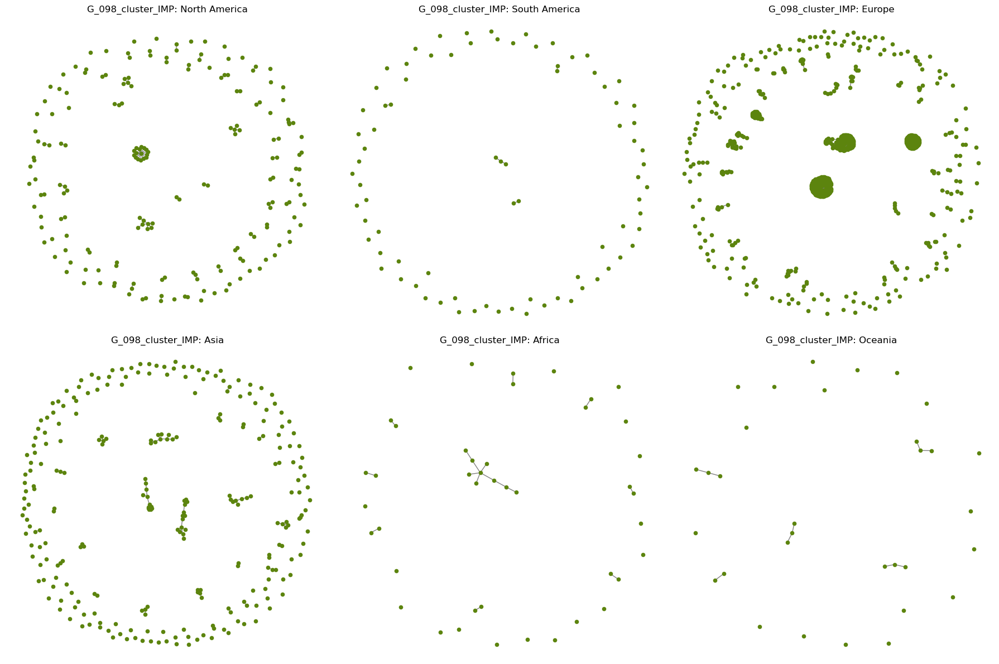

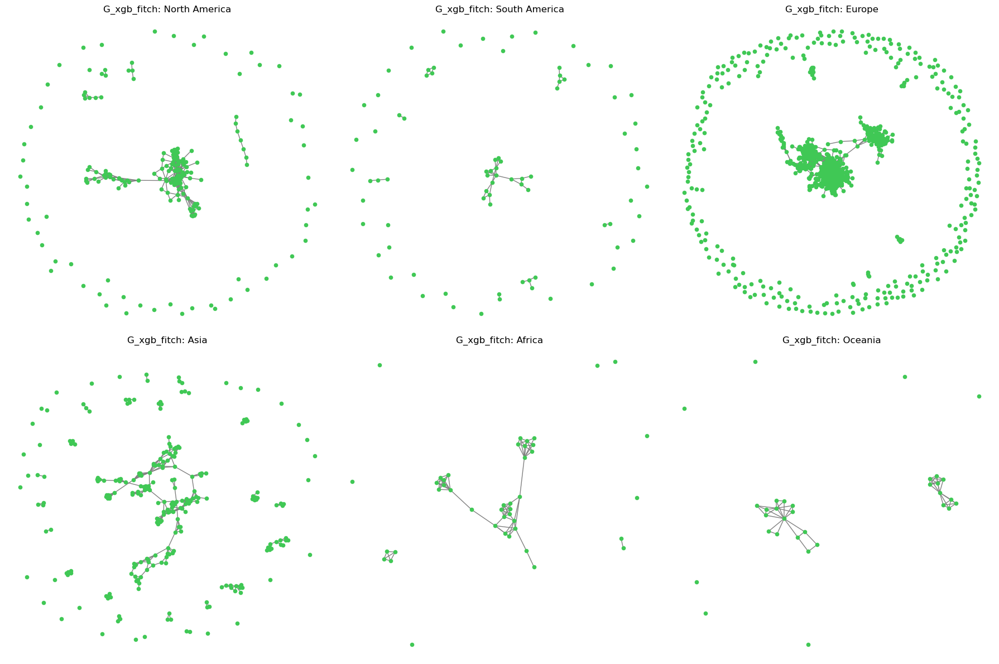

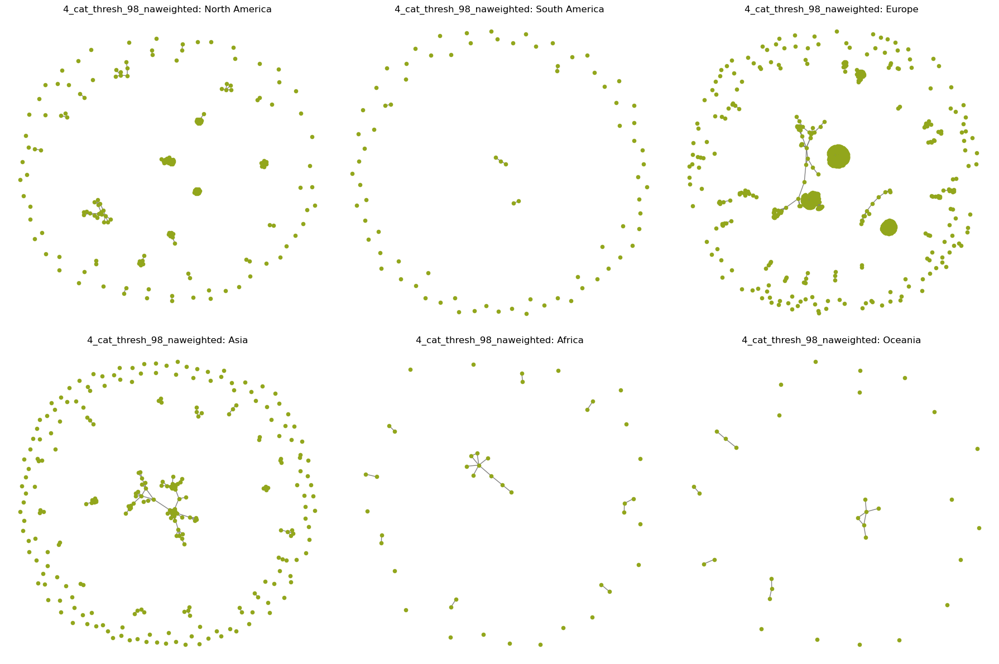

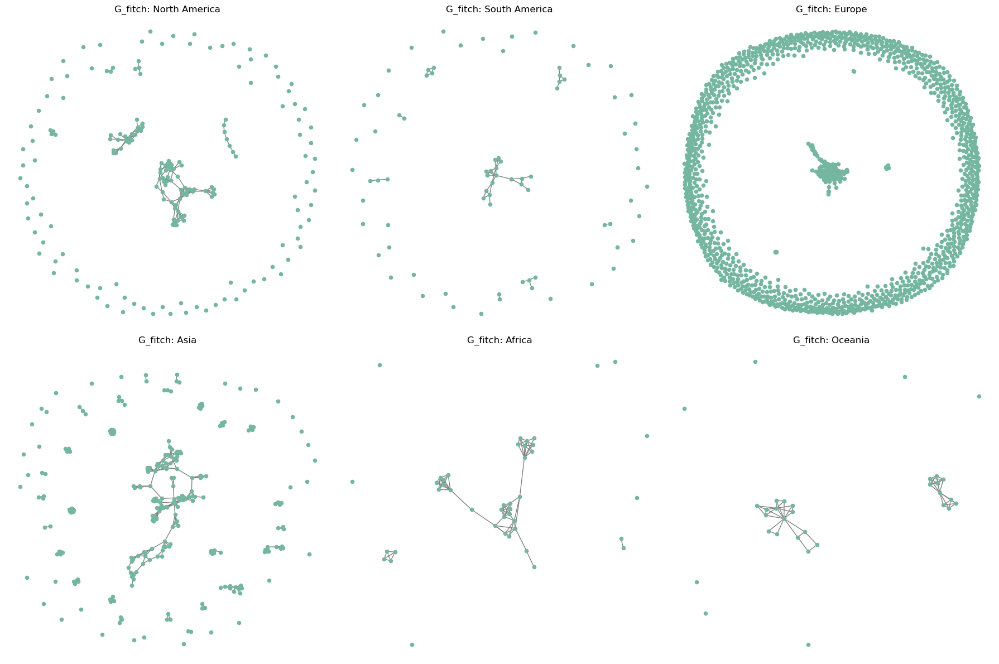

In [105]:
# networks specific
import random

# Generate unique colors for each data in Bank_networks
unique_colors = {title: f"#{random.randint(0, 0xFFFFFF):06x}" for title in Bank_networks.keys()}

# Cross-country analysis
Cross_country_analysis = {}
for title, data in Bank_networks.items():
    # Access the Graph object
    graph = data.get('Graph')
    
    # Create subplots for the six continents (3 per row)
    fig, axes = plt.subplots(2, 3, figsize=(18, 12))  # 2 rows, 3 columns
    axes = axes.flatten()  # Flatten to iterate easily
    
    for i, (continent, nodes) in enumerate(continent_bank_ids_1.items()):
        # Create subgraph for the current continent
        subgraph = graph.subgraph(nodes)
        
        if isinstance(subgraph, nx.Graph):  # Ensure it's a NetworkX graph
            # Get spring layout for visualization
            pos = nx.spring_layout(subgraph, seed=42)
            
            # Plot on the corresponding subplot
            nx.draw(
                subgraph,
                pos,
                ax=axes[i],
                with_labels=False,
                node_size=20,
                node_color=unique_colors[title],
                edge_color='gray'
            )
            axes[i].set_title(f"{title}: {continent}")
    
    # Adjust layout for the figure
    plt.tight_layout()
    plt.show()


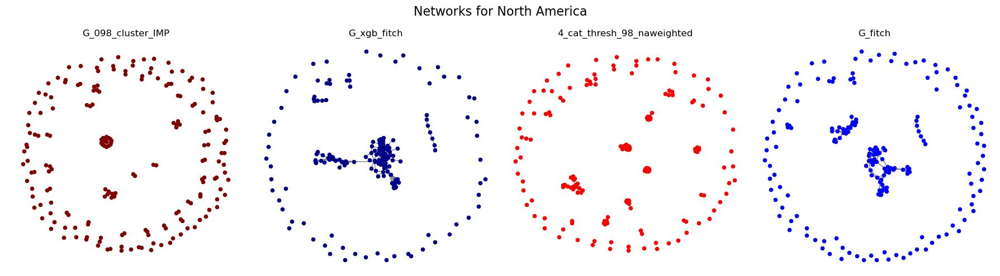

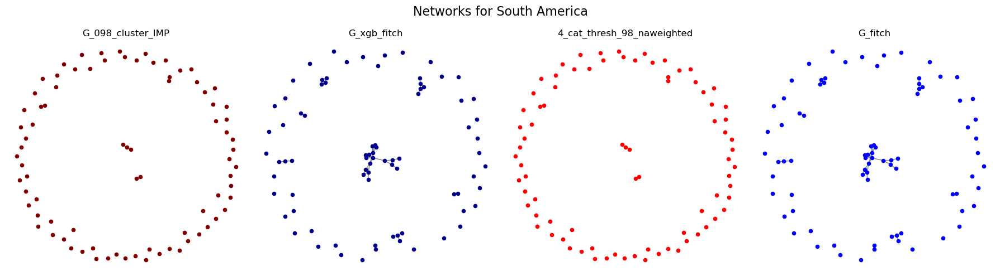

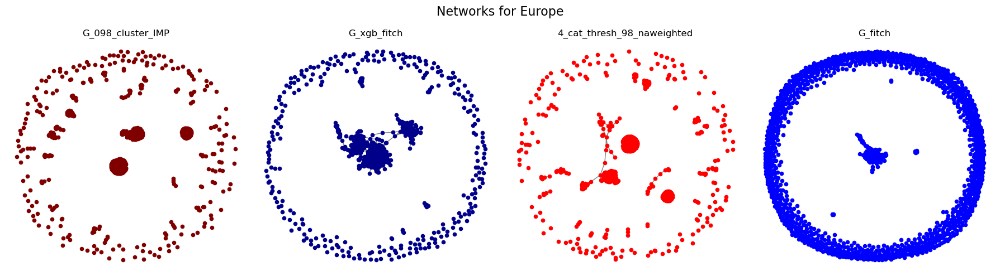

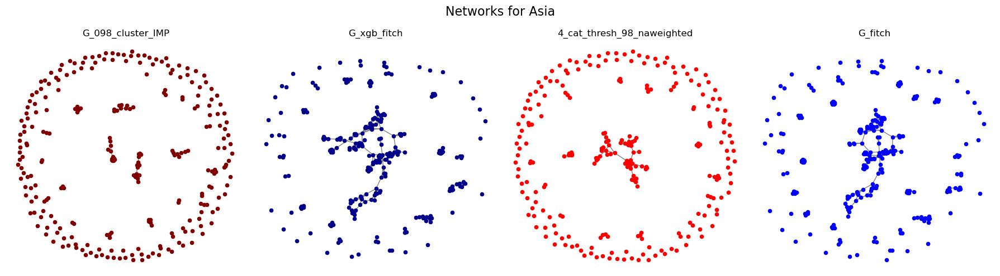

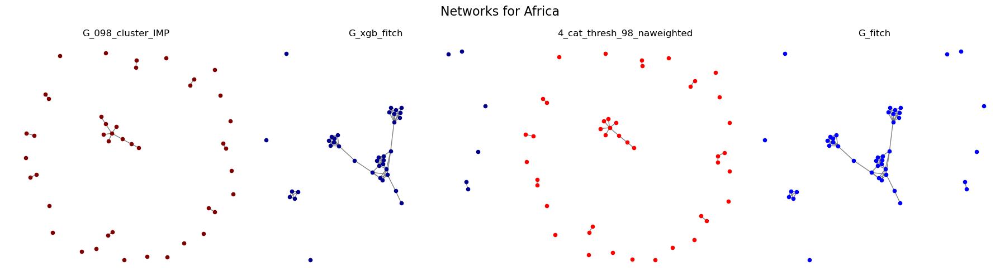

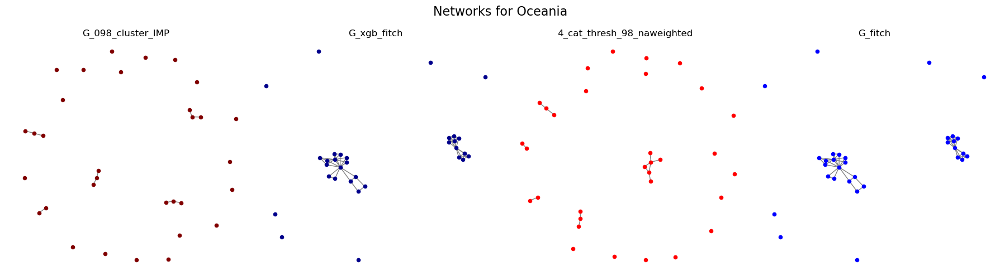

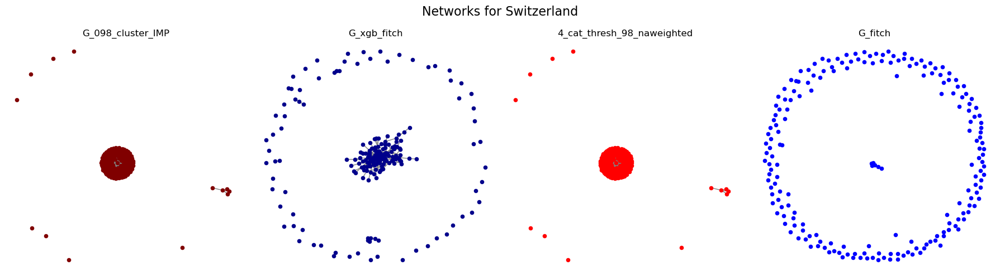

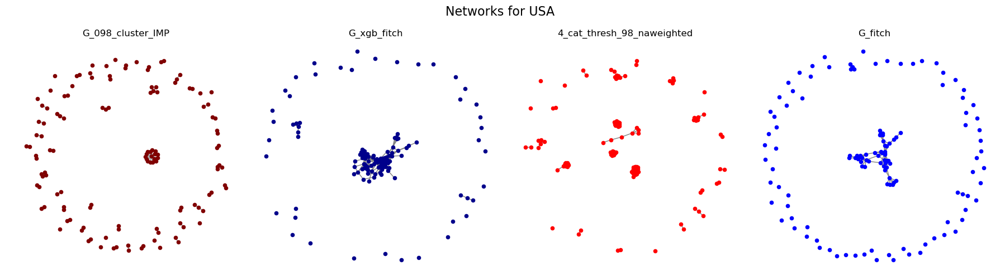

In [106]:
# Continent specific
import random

# Generate unique colors for each network in Bank_networks
unique_colors = {title: f"#{random.randint(0, 0xFFFFFF):06x}" for title in Bank_networks.keys()}
custom_colors = {
    "G_fitch": "blue",
    "G_xgb_fitch": "darkblue",
    "G_098_cluster_IMP": "maroon",
    "4_cat_thresh_98_naweighted": "red",
}
# Cross-country analysis
Cross_country_analysis = {}

# Iterate over each continent to create separate figures
for continent, nodes in continent_bank_ids.items():
    # Create a new figure for the current continent
    fig, axes = plt.subplots(1, len(Bank_networks), figsize=(18, 5))  # 1 row for networks, columns = # networks
    axes = axes.flatten()  # Ensure axes is iterable for consistency

    # Iterate over each network
    for col_idx, (title, data) in enumerate(Bank_networks.items()):
        # Access the Graph object
        graph = data.get('Graph')

        # Create subgraph for the current continent
        subgraph = graph.subgraph(nodes)

        # Ensure it's a NetworkX graph and plot
        if isinstance(subgraph, nx.Graph):
            pos = nx.spring_layout(subgraph, seed=42)
            nx.draw(
                subgraph,
                pos,
                ax=axes[col_idx],
                with_labels=False,
                node_size=20,
                node_color=custom_colors[title],
                edge_color='gray'
            )
            # Set title for each subplot
            axes[col_idx].set_title(f"{title}")

    # Set a main title for the entire figure
    fig.suptitle(f"Networks for {continent}", fontsize=16)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.savefig(f"Tables/{continent}.png", dpi=700, bbox_inches='tight')
    plt.show()


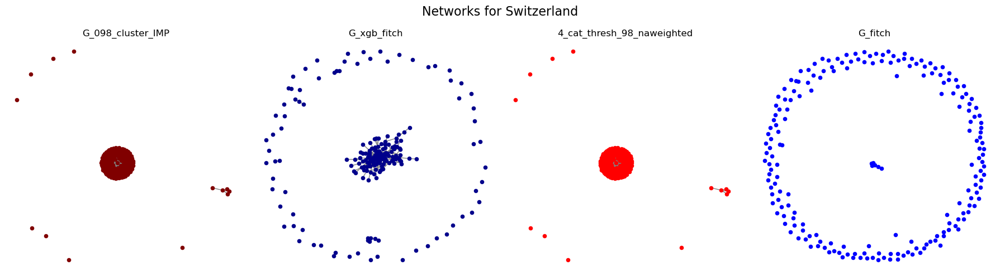

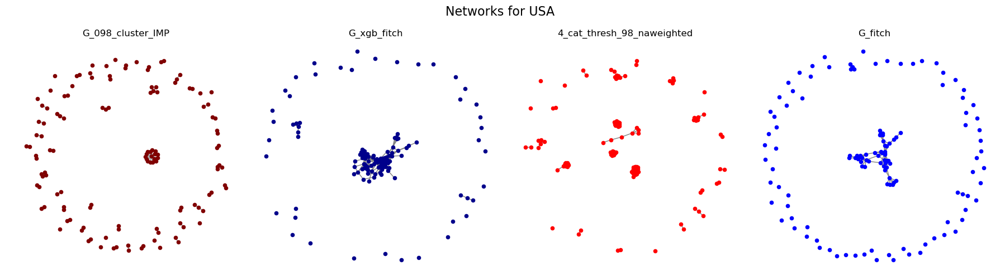

In [107]:
# Country Specific
for continent, nodes in US_CH_ids.items():
    # Create a new figure for the current continent
    fig, axes = plt.subplots(1, len(Bank_networks), figsize=(18, 5))  # 1 row for networks, columns = # networks
    axes = axes.flatten()  # Ensure axes is iterable for consistency

    # Iterate over each network
    for col_idx, (title, data) in enumerate(Bank_networks.items()):
        # Access the Graph object
        graph = data.get('Graph')

        # Create subgraph for the current continent
        subgraph = graph.subgraph(nodes)

        # Ensure it's a NetworkX graph and plot
        if isinstance(subgraph, nx.Graph):
            pos = nx.spring_layout(subgraph, seed=42)
            nx.draw(
                subgraph,
                pos,
                ax=axes[col_idx],
                with_labels=False,
                node_size=20,
                node_color=custom_colors[title],
                edge_color='gray'
            )
            # Set title for each subplot
            axes[col_idx].set_title(f"{title}")

    # Set a main title for the entire figure
    fig.suptitle(f"Networks for {continent}", fontsize=16)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.savefig(f"Tables/{continent}.png", dpi=700, bbox_inches='tight')
    plt.show()

### Degree Dist

Degree dist for continents and countris

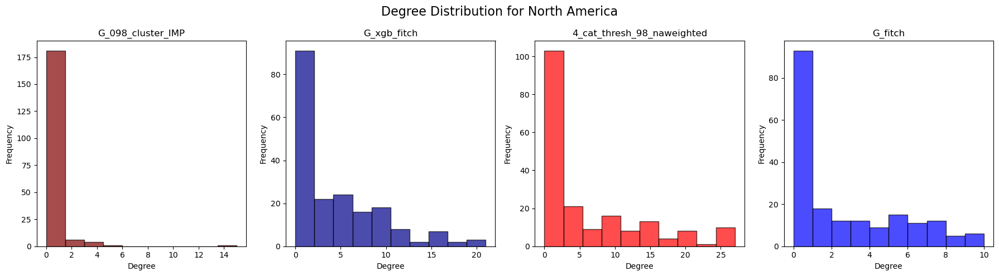

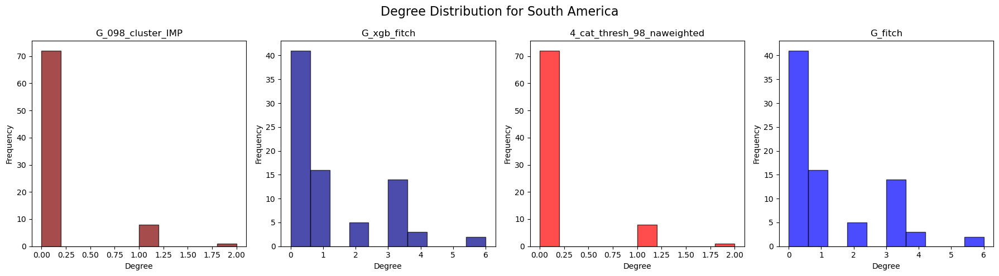

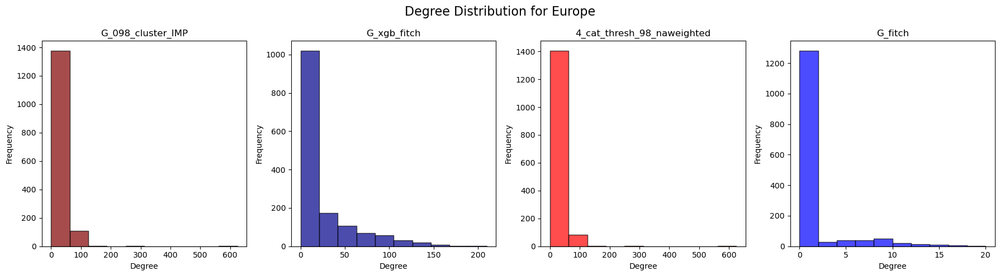

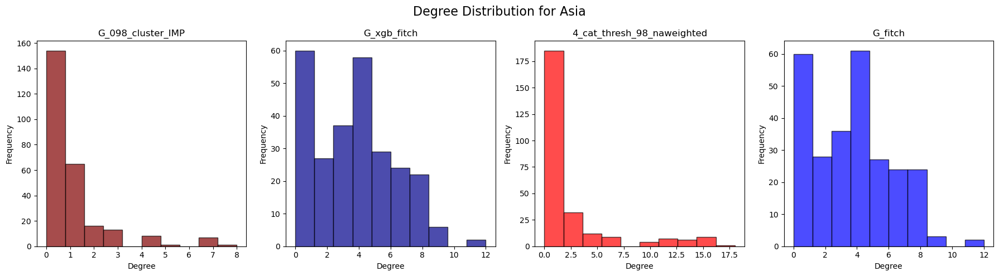

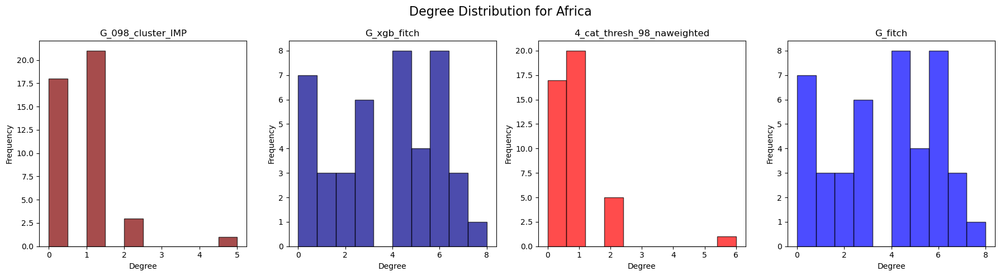

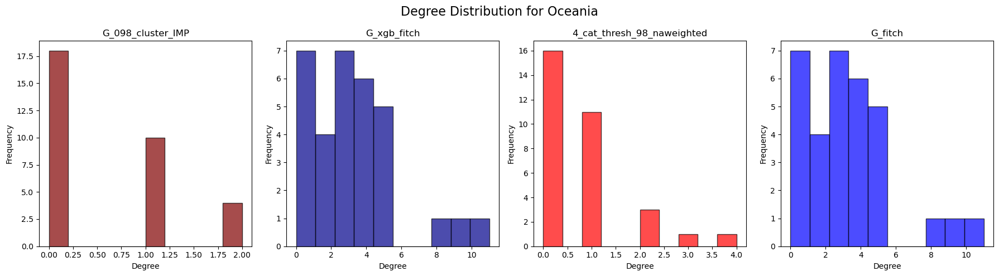

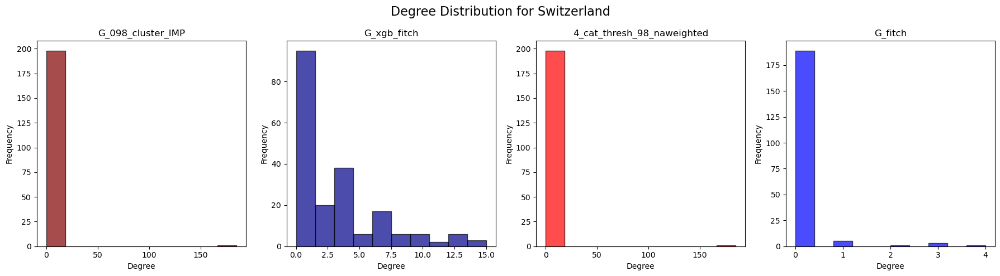

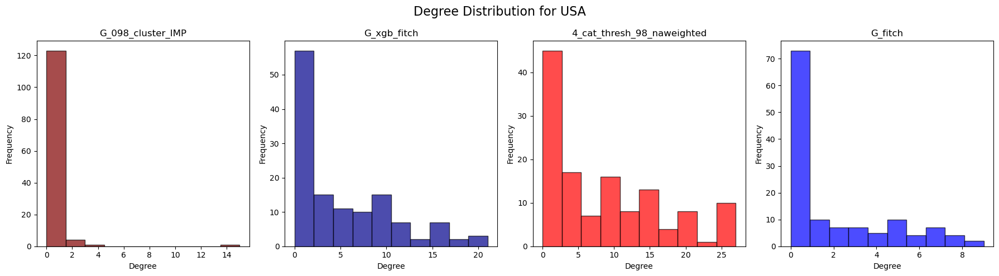

In [108]:

# Generate unique colors for each network in Bank_networks
unique_colors = {title: f"#{random.randint(0, 0xFFFFFF):06x}" for title in Bank_networks.keys()}
custom_colors = {
    "G_fitch": "blue",
    "G_xgb_fitch": "darkblue",
    "G_098_cluster_IMP": "maroon",
    "4_cat_thresh_98_naweighted": "red",
}
# Cross-country analysis
Cross_country_analysis = {}

# Iterate over each continent to create separate figures
for continent, nodes in continent_bank_ids.items():
    # Create a new figure for the current continent
    fig, axes = plt.subplots(1, len(Bank_networks), figsize=(18, 5))  # 1 row for networks, columns = # networks
    axes = axes.flatten()  # Ensure axes is iterable for consistency

    # Iterate over each network
    for col_idx, (title, data) in enumerate(Bank_networks.items()):
        # Access the Graph object
        graph = data.get('Graph')

        # Create subgraph for the current continent
        subgraph = graph.subgraph(nodes)

        # Ensure it's a NetworkX graph
        if isinstance(subgraph, nx.Graph):
            # Compute degrees of the nodes
            degrees = [degree for _, degree in subgraph.degree()]
            
            # Plot the degree distribution as a histogram
            axes[col_idx].hist(
                degrees, bins=10, color=custom_colors[title], alpha=0.7, edgecolor='black'
            )
            
            # Set title and labels for each subplot
            axes[col_idx].set_title(f"{title}")
            axes[col_idx].set_xlabel("Degree")
            axes[col_idx].set_ylabel("Frequency")

    # Set a main title for the entire figure
    fig.suptitle(f"Degree Distribution for {continent}", fontsize=16)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()


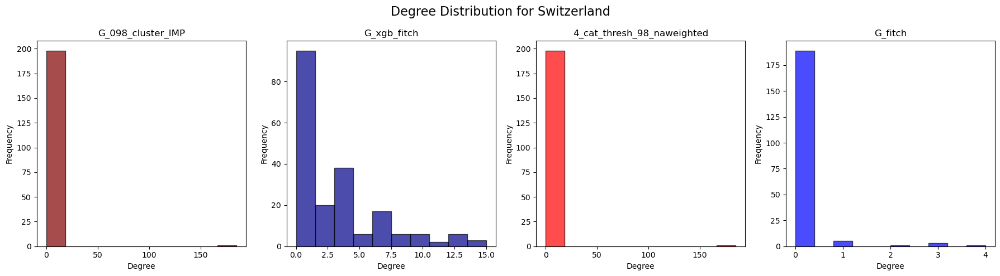

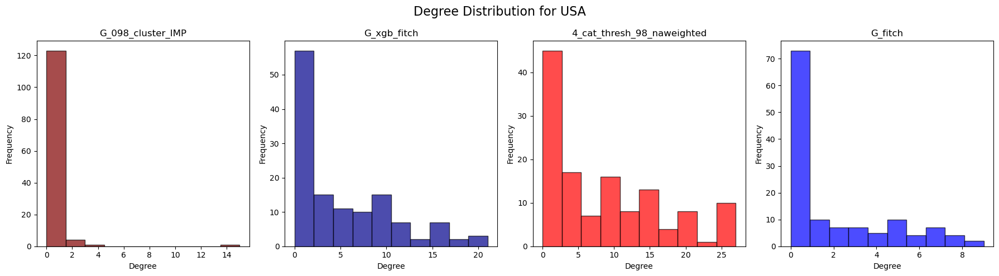

In [109]:
for continent, nodes in US_CH_ids.items():
    # Create a new figure for the current continent
    fig, axes = plt.subplots(1, len(Bank_networks), figsize=(18, 5))  # 1 row for networks, columns = # networks
    axes = axes.flatten()  # Ensure axes is iterable for consistency

    # Iterate over each network
    for col_idx, (title, data) in enumerate(Bank_networks.items()):
        # Access the Graph object
        graph = data.get('Graph')

        # Create subgraph for the current continent
        subgraph = graph.subgraph(nodes)

        # Ensure it's a NetworkX graph
        if isinstance(subgraph, nx.Graph):
            # Compute degrees of the nodes
            degrees = [degree for _, degree in subgraph.degree()]
            
            # Plot the degree distribution as a histogram
            axes[col_idx].hist(
                degrees, bins=10, color=custom_colors[title], alpha=0.7, edgecolor='black'
            )
            
            # Set title and labels for each subplot
            axes[col_idx].set_title(f"{title}")
            axes[col_idx].set_xlabel("Degree")
            axes[col_idx].set_ylabel("Frequency")

    # Set a main title for the entire figure
    fig.suptitle(f"Degree Distribution for {continent}", fontsize=16)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()


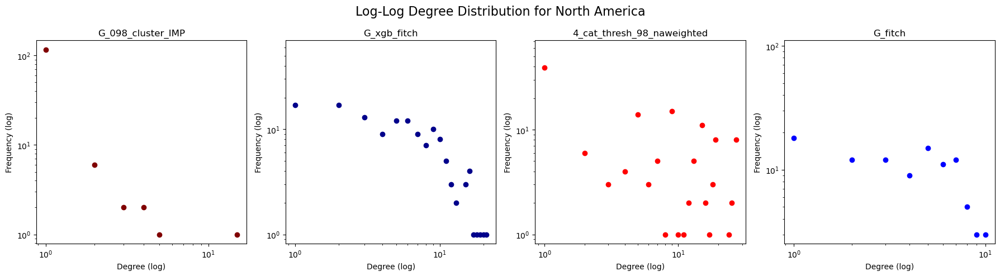

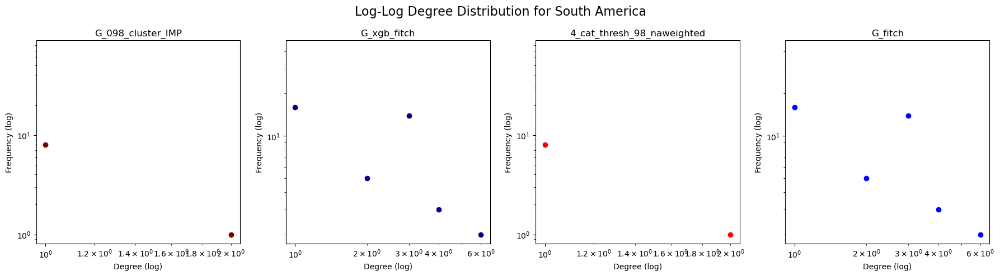

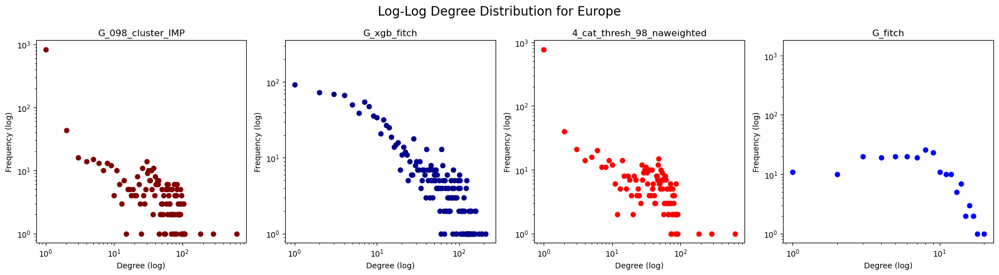

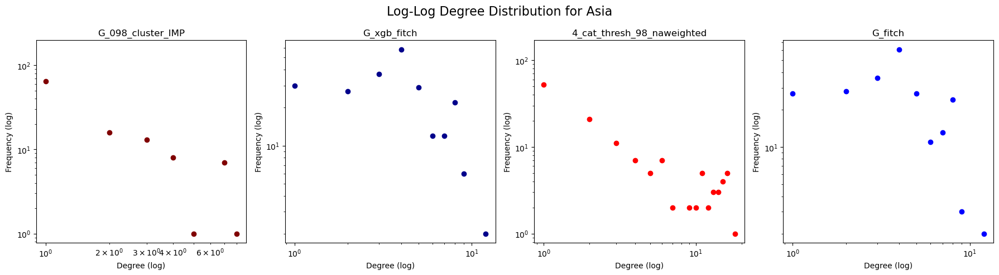

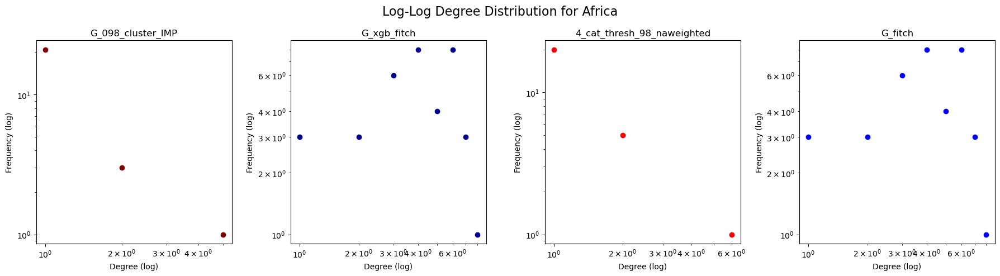

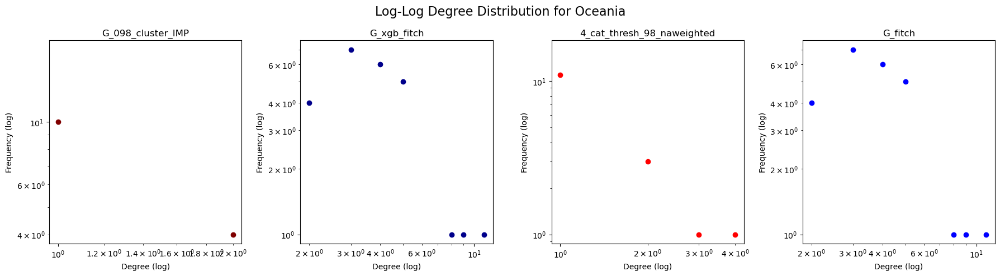

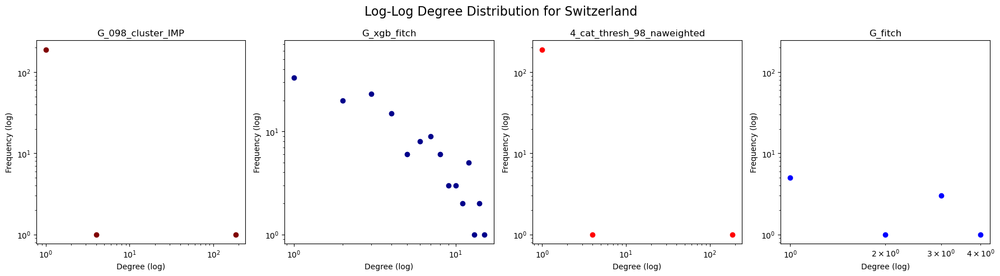

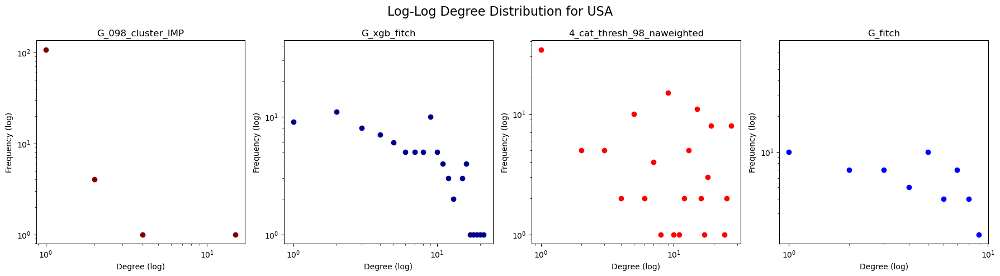

In [110]:
# Log-log degree dist

# Generate unique colors for each network in Bank_networks
unique_colors = {title: f"#{random.randint(0, 0xFFFFFF):06x}" for title in Bank_networks.keys()}
custom_colors = {
    "G_fitch": "blue",
    "G_xgb_fitch": "darkblue",
    "G_098_cluster_IMP": "maroon",
    "4_cat_thresh_98_naweighted": "red",
}

# Cross-country analysis
Cross_country_analysis = {}

# Iterate over each continent to create separate figures
for continent, nodes in continent_bank_ids.items():
    # Create a new figure for the current continent
    fig, axes = plt.subplots(1, len(Bank_networks), figsize=(18, 5))  # 1 row for networks, columns = # networks
    axes = axes.flatten()  # Ensure axes is iterable for consistency

    # Iterate over each network
    for col_idx, (title, data) in enumerate(Bank_networks.items()):
        # Access the Graph object
        graph = data.get('Graph')

        # Create subgraph for the current continent
        subgraph = graph.subgraph(nodes)

        # Ensure it's a NetworkX graph
        if isinstance(subgraph, nx.Graph):
            # Compute degree frequency
            degrees = [degree for _, degree in subgraph.degree()]
            degree_counts = np.bincount(degrees)  # Count occurrences of each degree
            degrees = np.arange(len(degree_counts))  # Degree values

            # Filter out degrees with zero count
            nonzero_degrees = degrees[degree_counts > 0]
            nonzero_counts = degree_counts[degree_counts > 0]

            # Plot log-log degree distribution
            axes[col_idx].loglog(
                nonzero_degrees, nonzero_counts, 
                marker='o', linestyle='', color=custom_colors[title]
            )
            
            # Set title and labels for each subplot
            axes[col_idx].set_title(f"{title}")
            axes[col_idx].set_xlabel("Degree (log)")
            axes[col_idx].set_ylabel("Frequency (log)")

    # Set a main title for the entire figure
    fig.suptitle(f"Log-Log Degree Distribution for {continent}", fontsize=16)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()


### Clustering 

Clustering to confirm what we see.

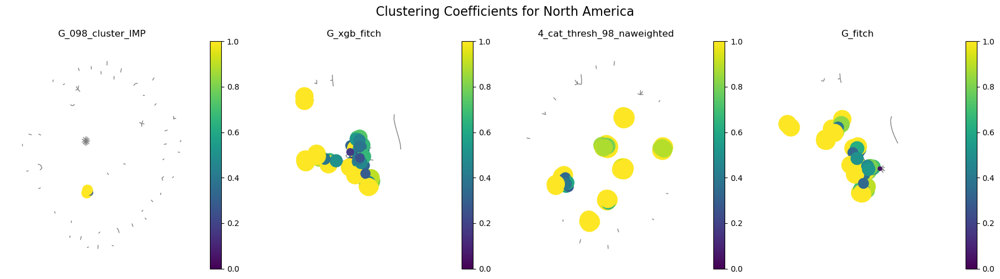

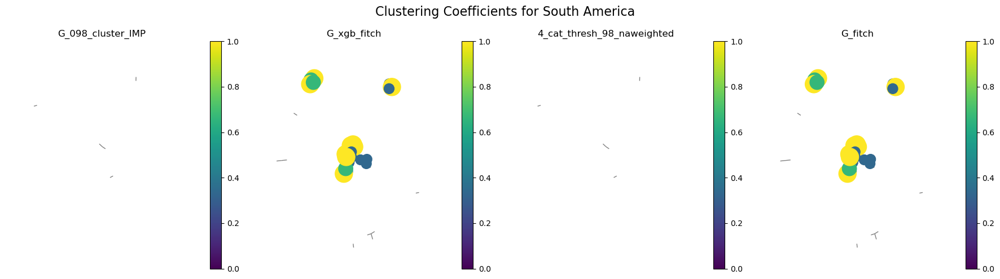

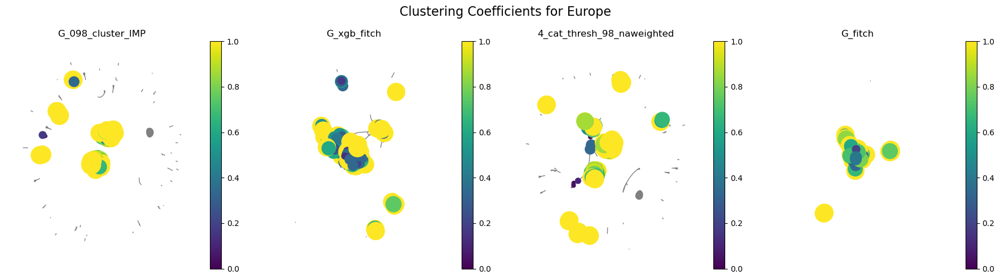

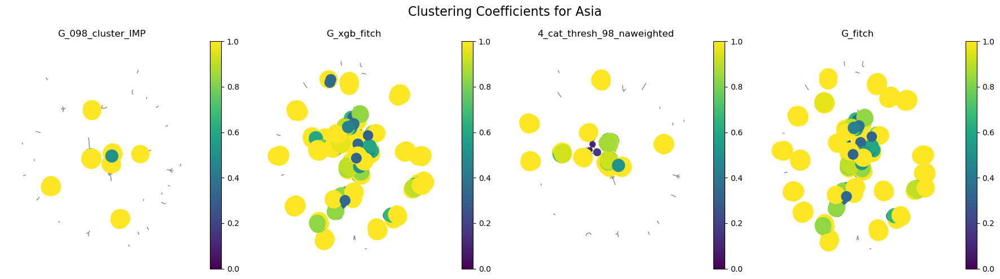

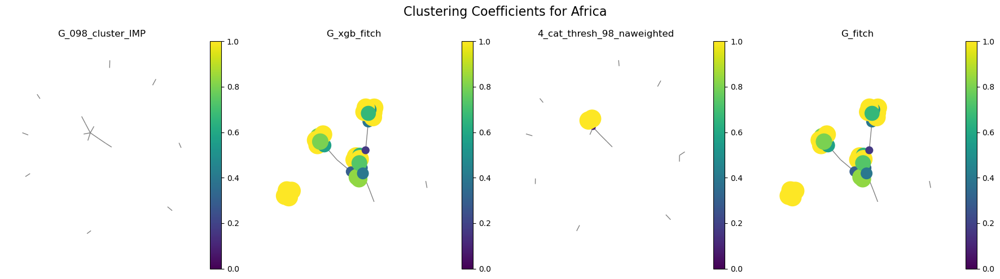

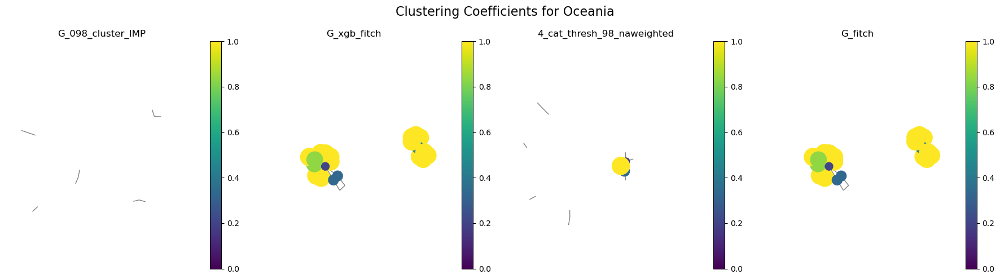

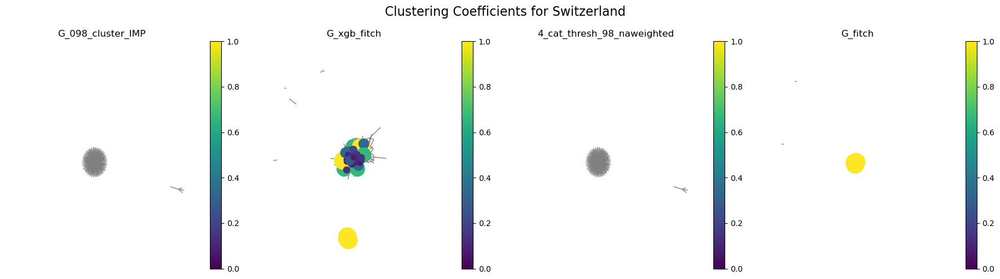

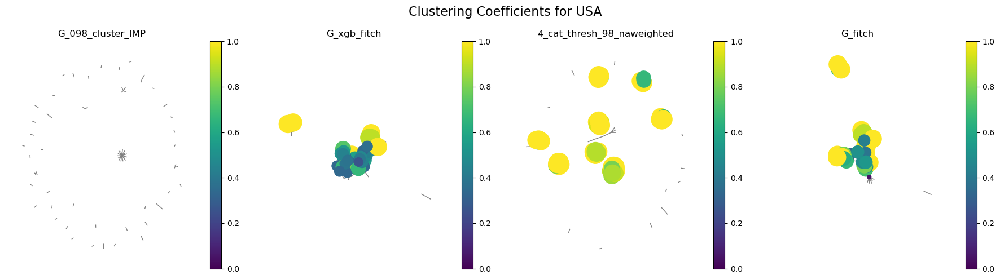

In [111]:
import matplotlib.pyplot as plt
import networkx as nx
import random

# Generate unique colors for each network in Bank_networks
unique_colors = {title: f"#{random.randint(0, 0xFFFFFF):06x}" for title in Bank_networks.keys()}
custom_colors = {
    "G_fitch": "blue",
    "G_xgb_fitch": "darkblue",
    "G_098_cluster_IMP": "maroon",
    "4_cat_thresh_98_naweighted": "red",
}

# Cross-country analysis
Cross_country_analysis = {}

# Iterate over each continent to create separate figures
for continent, nodes in continent_bank_ids.items():
    # Create a new figure for the current continent
    fig, axes = plt.subplots(1, len(Bank_networks), figsize=(18, 5))  # 1 row for networks, columns = # networks
    axes = axes.flatten()  # Ensure axes is iterable for consistency

    # Iterate over each network
    for col_idx, (title, data) in enumerate(Bank_networks.items()):
        # Access the Graph object
        graph = data.get('Graph')

        # Create subgraph for the current continent
        subgraph = graph.subgraph(nodes)

        # Ensure it's a NetworkX graph and plot
        if isinstance(subgraph, nx.Graph):
            # Calculate clustering coefficients
            clustering_coefficients = nx.clustering(subgraph)

            # Get node positions
            pos = nx.spring_layout(subgraph, seed=42)

            # Map clustering coefficients to node sizes or colors
            node_sizes = [v * 500 for v in clustering_coefficients.values()]  # Scale sizes for visualization
            node_colors = [clustering_coefficients[node] for node in subgraph.nodes]

            # Draw the graph with clustering coefficients as node colors
            nx.draw(
                subgraph,
                pos,
                ax=axes[col_idx],
                with_labels=False,
                node_size=node_sizes,
                node_color=node_colors,
                cmap=plt.cm.viridis,  # Use a colormap to represent clustering coefficients
                edge_color='gray'
            )

            # Add a colorbar
            sm = plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=1))
            sm.set_array([])
            plt.colorbar(sm, ax=axes[col_idx])

            # Set title for each subplot
            axes[col_idx].set_title(f"{title}")

    # Set a main title for the entire figure
    fig.suptitle(f"Clustering Coefficients for {continent}", fontsize=16)

    # Adjust layout and show the plot
    plt.tight_layout()
    plt.show()


### Performance metrics across continent

In [112]:
stats_cols = [col for col in df_merged.columns if col.startswith(('P:', 'FC_TOTAL_ASSETS_BNK!USD'))]
bank_stats_continent = []

# Function to format large numbers (e.g., convert to billions with "B")
def format_large_number(value, unit="B"):
    scale = 1e9 if unit == "B" else 1e6
    return f"{value / scale:.2f} {unit}"

total_banks = 0  # Keep track of the total number of banks
df_merged['P:ROA'] = df_merged['P:ROA']* 100
for i, (continent, ids) in enumerate(continent_bank_ids_1.items()):
    # Filter rows belonging to the current continent
    continent_data = df_merged[df_merged['FC_FITCH_ID'].isin(ids)][stats_cols]
    
    # Calculate mean and standard deviation, rounded to 2 decimals
    mean_stats = continent_data.mean().round(2)
    std_stats = continent_data.std().round(2)
    
    # Get the number of banks for this continent
    num_banks = len(continent_data)
    total_banks += num_banks  # Add to total bank count
    
    # Create a dictionary for the continent
    continent_stats = {"Continent": continent, "Number of Banks": num_banks}
    for col in stats_cols:
        if "FC_TOTAL_ASSETS_BNK!USD" in col:  # Special formatting for total assets
            mean_formatted = format_large_number(mean_stats[col], unit="B")
            std_formatted = format_large_number(std_stats[col], unit="B")
            mean_std_combined = f"{mean_formatted} ({std_formatted})"
        else:
            mean_std_combined = f"{mean_stats[col]} ({std_stats[col]})"
        continent_stats[col] = mean_std_combined
    
    # Append to the list
    bank_stats_continent.append(continent_stats)

# Convert to DataFrame for easier analysis
df_bank_stats_continent = pd.DataFrame(bank_stats_continent)

# Add a row for the average across all banks
# Calculate means and standard deviations across all banks
all_banks_data = df_merged[stats_cols]
mean_stats_all = all_banks_data.mean().round(2)
std_stats_all = all_banks_data.std().round(2)

# Create the "average row"
average_row = {"Continent": "Average", "Number of Banks": total_banks}
for col in stats_cols:
    if "FC_TOTAL_ASSETS_BNK!USD" in col:  # Special formatting for total assets
        mean_formatted = format_large_number(mean_stats_all[col], unit="B")
        std_formatted = format_large_number(std_stats_all[col], unit="B")
        mean_std_combined = f"{mean_formatted} ({std_formatted})"
    else:
        mean_std_combined = f"{mean_stats_all[col]} ({std_stats_all[col]})"
    average_row[col] = mean_std_combined

# Append the average row to the DataFrame
df_bank_stats_continent = pd.concat([df_bank_stats_continent, pd.DataFrame([average_row])], ignore_index=True)

# Display the DataFrame
df_bank_stats_continent


,Continent,Number of Banks,FC_TOTAL_ASSETS_BNK!USD,P:ROA,P:NIM,P:Charge_off_Loans,P:E_A_ratio,P:Lev_ratio,P:non_perf_assets_assets,P:cash_sec_assets,P:liquidity_coverage,P:liquidity_ratio
0,North America,193,236.25 B (575.35 B),2.19 (4.82),4.03 (4.16),4.71 (59.85),0.13 (0.13),12.19 (13.38),-0.56 (1.67),0.25 (0.15),554.03 (1501.19),16.04 (16.85)
1,South America,81,24.43 B (83.25 B),1.76 (2.46),9.31 (18.09),0.01 (0.03),0.15 (0.12),14.29 (16.56),-0.36 (0.83),0.27 (0.2),277.87 (129.82),27.33 (20.43)
2,Europe,1490,48.37 B (225.35 B),0.55 (0.9),1.93 (1.25),-0.01 (0.14),0.09 (0.05),9.73 (4.02),-0.57 (0.41),0.21 (0.14),1073.84 (29279.3),14.93 (11.89)
3,Asia,265,185.23 B (650.43 B),1.79 (2.24),3.81 (3.15),0.01 (0.02),0.12 (0.07),10.25 (5.78),-0.52 (0.83),0.31 (0.17),227.45 (249.66),17.53 (14.11)
4,Africa,43,27.46 B (41.28 B),2.58 (1.76),5.37 (2.9),0.01 (0.01),0.1 (0.04),8.16 (2.83),-0.76 (0.87),0.38 (0.15),425.37 (627.81),19.05 (8.41)
5,Oceania,32,99.18 B (214.90 B),0.7 (1.37),2.64 (1.47),0.0 (0.01),0.11 (0.09),5.32 (0.21),-0.24 (0.28),0.16 (0.09),150.0 (28.06),11.67 (9.7)
6,Average,2104,87.53 B (366.05 B),0.95 (2.01),2.72 (4.36),0.82 (24.98),0.1 (0.07),10.11 (6.52),-0.55 (0.71),0.24 (0.15),943.67 (26788.4),16.04 (13.43)


In [113]:
columns_to_drop = ['P:Charge_off_Loans', 'P:non_perf_assets_assets', 'P:liquidity_coverage', 'P:cash_sec_assets']

# Drop the columns from the DataFrame
for_latex_bank_stats = df_bank_stats_continent.drop(columns=columns_to_drop)
for_latex_bank_stats


,Continent,Number of Banks,FC_TOTAL_ASSETS_BNK!USD,P:ROA,P:NIM,P:E_A_ratio,P:Lev_ratio,P:liquidity_ratio
0,North America,193,236.25 B (575.35 B),2.19 (4.82),4.03 (4.16),0.13 (0.13),12.19 (13.38),16.04 (16.85)
1,South America,81,24.43 B (83.25 B),1.76 (2.46),9.31 (18.09),0.15 (0.12),14.29 (16.56),27.33 (20.43)
2,Europe,1490,48.37 B (225.35 B),0.55 (0.9),1.93 (1.25),0.09 (0.05),9.73 (4.02),14.93 (11.89)
3,Asia,265,185.23 B (650.43 B),1.79 (2.24),3.81 (3.15),0.12 (0.07),10.25 (5.78),17.53 (14.11)
4,Africa,43,27.46 B (41.28 B),2.58 (1.76),5.37 (2.9),0.1 (0.04),8.16 (2.83),19.05 (8.41)
5,Oceania,32,99.18 B (214.90 B),0.7 (1.37),2.64 (1.47),0.11 (0.09),5.32 (0.21),11.67 (9.7)
6,Average,2104,87.53 B (366.05 B),0.95 (2.01),2.72 (4.36),0.1 (0.07),10.11 (6.52),16.04 (13.43)


In [114]:
columns_to_drop = ['P:Charge_off_Loans', 'P:non_perf_assets_assets', 'P:liquidity_coverage', 'P:cash_sec_assets','P:E_A_ratio', 'P:liquidity_ratio' ]

# Drop the columns from the DataFrame
for_latex_bank_stats = df_bank_stats_continent.drop(columns=columns_to_drop)

for_latex_bank_stats.rename(columns={
    'Continent': r"\makecell[c]{Continent}",
    'Number of Banks': r"\makecell[c]{Number \\of Banks}",
    'FC_TOTAL_ASSETS_BNK!USD': r"\makecell[c]{Total Assets}",
    'P:ROA': r"\makecell[c]{ROA(\%)}",
    'P:NIM': r"\makecell[c]{Net Interest\\Margin}",
    'P:E_A_ratio': r"\makecell[c]{Equity (\%)\\of Assets}",
    'P:Lev_ratio': r"\makecell[c]{Leverage \\Ratio}",
    'P:liquidity_ratio': r"\makecell[c]{Liquidity \\Ratio}",
}, inplace=True)

latex_table = for_latex_bank_stats.to_latex(index=False, escape=False)
file_path = 'Tables/Continent_stats_banks.tex'
with open(file_path, 'w') as f:
    f.write(latex_table)

In [115]:
for_latex_bank_stats

,\makecell[c]{Continent},\makecell[c]{Number \\of Banks},\makecell[c]{Total Assets},\makecell[c]{ROA(\%)},\makecell[c]{Net Interest\\Margin},\makecell[c]{Leverage \\Ratio}
0,North America,193,236.25 B (575.35 B),2.19 (4.82),4.03 (4.16),12.19 (13.38)
1,South America,81,24.43 B (83.25 B),1.76 (2.46),9.31 (18.09),14.29 (16.56)
2,Europe,1490,48.37 B (225.35 B),0.55 (0.9),1.93 (1.25),9.73 (4.02)
3,Asia,265,185.23 B (650.43 B),1.79 (2.24),3.81 (3.15),10.25 (5.78)
4,Africa,43,27.46 B (41.28 B),2.58 (1.76),5.37 (2.9),8.16 (2.83)
5,Oceania,32,99.18 B (214.90 B),0.7 (1.37),2.64 (1.47),5.32 (0.21)
6,Average,2104,87.53 B (366.05 B),0.95 (2.01),2.72 (4.36),10.11 (6.52)


### Metrics Comparison

In [116]:
metrics = []

for title, data in Bank_networks.items():
    graph = data.get('Graph')

    for continent, nodes in continent_bank_ids.items():
        subgraph = graph.subgraph(nodes)
        if isinstance(subgraph, nx.Graph):
            num_nodes = subgraph.number_of_nodes()
            num_edges = subgraph.number_of_edges()
            avg_degree = sum(dict(subgraph.degree()).values()) / num_nodes if num_nodes > 0 else 0
            density = nx.density(subgraph)
            avg_clustering = nx.average_clustering(subgraph)
            assortativity = nx.degree_assortativity_coefficient(subgraph)
            connected_components = [comp for comp in nx.connected_components(subgraph) if len(comp) > 3]
            large_components_count = len(connected_components)
            largest_component_size = max((len(comp) for comp in nx.connected_components(subgraph)), default=0)

            metrics.append({
                "Network": title,
                "Continent": continent,
                "Nodes": num_nodes,
                "Edges": num_edges,
                "Avg Degree": avg_degree,
                "Density": density,
                "Avg Clustering": avg_clustering,
                "Assortativity": assortativity,
                r"CC (\$>3\$ nodes)": large_components_count,
                "LCC Size": largest_component_size
            })

# Convert to DataFrame and display
df_metrics = pd.DataFrame(metrics)
df_metrics.sort_values(['Continent', 'Network'])


,Network,Continent,Nodes,Edges,Avg Degree,Density,Avg Clustering,Assortativity,CC (\$>3\$ nodes),LCC Size
20,4_cat_thresh_98_naweighted,Africa,43,18,0.837209,0.019934,0.048062,-0.090385,1,9
4,G_098_cluster_IMP,Africa,43,16,0.744186,0.017719,0.000000,-0.048170,1,9
28,G_fitch,Africa,43,78,3.627907,0.086379,0.566168,-0.013814,2,30
12,G_xgb_fitch,Africa,43,78,3.627907,0.086379,0.566168,-0.013814,2,30
19,4_cat_thresh_98_naweighted,Asia,265,296,2.233962,0.008462,0.213133,0.786244,7,69
3,G_098_cluster_IMP,Asia,265,115,0.867925,0.003288,0.092767,0.795194,8,14
27,G_fitch,Asia,265,485,3.660377,0.013865,0.608741,0.536384,16,78
11,G_xgb_fitch,Asia,265,491,3.705660,0.014037,0.597417,0.524898,13,87
18,4_cat_thresh_98_naweighted,Europe,1490,10836,14.544966,0.009768,0.252373,-0.139926,18,625
2,G_098_cluster_IMP,Europe,1490,10333,13.869799,0.009315,0.220596,-0.142492,21,625


In [117]:
us_ch_metrics = df_metrics[(df_metrics['Continent'] == 'Switzerland') | (df_metrics['Continent'] == 'USA')].copy()
columns_to_drop = ['Nodes', 'Density', 'Avg Clustering']
us_ch_metrics = us_ch_metrics.drop(columns=columns_to_drop).copy()



us_ch_metrics['Network'] = us_ch_metrics['Network'].str.replace('G_098_cluster_IMP', 'Cluster - Category', regex=False)
us_ch_metrics['Network'] = us_ch_metrics['Network'].str.replace('G_xgb_fitch', 'XGB-Fitch', regex=False)
us_ch_metrics['Network'] = us_ch_metrics['Network'].str.replace('4_cat_thresh_98_naweighted', 'Variable - Category', regex=False)
us_ch_metrics['Network'] = us_ch_metrics['Network'].str.replace('G_fitch', 'Fitch', regex=False)


# Convert integer columns to float64 for rounding (if needed)
int_columns = ['Edges', 'CC (\$>3\$ nodes)', 'LCC Size']
us_ch_metrics[int_columns] = us_ch_metrics[int_columns].astype(float)
us_ch_metrics[['Edges', 'LCC Size', 'CC (\$>3\$ nodes)']] = us_ch_metrics[['Edges', 'LCC Size', 'CC (\$>3\$ nodes)']].astype(int)
# Identify numeric columns and apply rounding
numeric_columns = ['Avg Degree', 'Assortativity']
us_ch_metrics[numeric_columns] = us_ch_metrics[numeric_columns].round(3)
us_ch_metrics = us_ch_metrics.sort_values(['Continent', 'Network'])



us_ch_metrics.rename(columns={'Continent': 'Country'}, inplace=True)


# Check result
print(us_ch_metrics.head())

# Generate LaTeX table
latex_table = us_ch_metrics.to_latex(index=False)

# Save to file
file_path = 'Tables/us_ch_metrics.tex'
with open(file_path, 'w') as f:
    f.write(latex_table)



                Network      Country  Edges  Avg Degree  Assortativity  \
6    Cluster - Category  Switzerland    189       1.899         -0.960   
30                Fitch  Switzerland     10       0.101          0.649   
22  Variable - Category  Switzerland    189       1.899         -0.960   
14            XGB-Fitch  Switzerland    293       2.945          0.183   
7    Cluster - Category          USA     67       1.039         -0.152   

    CC (\$>3\$ nodes)  LCC Size  
6                   2       186  
30                  1         6  
22                  2       186  
14                  2       121  
7                   2        16  


In [118]:
metrics_north_americ = df_metrics[df_metrics['Continent'] == 'North America'].copy()
columns_to_drop = ['Continent', 'Nodes', 'Density', 'Avg Clustering']
metrics_north_americ = metrics_north_americ.drop(columns=columns_to_drop).copy()


metrics_north_americ
metrics_north_americ['Network'] = metrics_north_americ['Network'].str.replace('G_098_cluster_IMP', 'Cluster - Category', regex=False)
metrics_north_americ['Network'] = metrics_north_americ['Network'].str.replace('G_xgb_fitch', 'XGB-Fitch', regex=False)
metrics_north_americ['Network'] = metrics_north_americ['Network'].str.replace('4_cat_thresh_98_naweighted', 'Variable - Category', regex=False)
metrics_north_americ['Network'] = metrics_north_americ['Network'].str.replace('G_fitch', 'Fitch', regex=False)
metrics_north_americ


# Convert integer columns to float64 for rounding (if needed)
int_columns = ['Edges', 'CC (\$>3\$ nodes)', 'LCC Size']
metrics_north_americ[int_columns] = metrics_north_americ[int_columns].astype(float)

# Identify numeric columns and apply rounding
numeric_columns = metrics_north_americ.select_dtypes(include=['float', 'int']).columns
metrics_north_americ[numeric_columns] = metrics_north_americ[numeric_columns].round(3)

# Check result
print(metrics_north_americ.head())

# Generate LaTeX table
latex_table = metrics_north_americ.to_latex(index=False)

# Save to file
file_path = 'Tables/metrics_north_americ.tex'
with open(file_path, 'w') as f:
    f.write(latex_table)



                Network  Edges  Avg Degree  Assortativity  CC (\$>3\$ nodes)  \
0    Cluster - Category   81.0       0.839         -0.164                5.0   
8             XGB-Fitch  434.0       4.497          0.401                4.0   
16  Variable - Category  581.0       6.021          0.741                9.0   
24                Fitch  218.0       2.259          0.211                5.0   

    LCC Size  
0       16.0  
8      116.0  
16      29.0  
24      58.0  


In [119]:



# Filter for North America
metrics_north_americ = df_metrics[df_metrics['Continent'] == 'North America']

# Drop unnecessary columns
columns_to_drop = ['Continent', 'Nodes', 'Density', 'Avg Clustering']
metrics_north_americ = metrics_north_americ.drop(columns=columns_to_drop)

# Rename the Network column values
metrics_north_americ['Network'] = metrics_north_americ['Network'].str.replace('G_098_cluster_IMP', 'Cluster - Category', regex=False)
metrics_north_americ['Network'] = metrics_north_americ['Network'].str.replace('G_xgb_fitch', 'XGB-Fitch', regex=False)
metrics_north_americ['Network'] = metrics_north_americ['Network'].str.replace('4_cat_thresh_98_naweighted', 'Variable - Category', regex=False)
metrics_north_americ['Network'] = metrics_north_americ['Network'].str.replace('G_fitch', 'Fitch', regex=False)

# Round numeric columns and convert them to strings
numeric_columns = metrics_north_americ.select_dtypes(include=['float', 'int']).columns
metrics_north_americ[numeric_columns] = metrics_north_americ[numeric_columns].applymap(lambda x: f"{x:.3f}")

# Generate LaTeX table
latex_table = metrics_north_americ.to_latex(index=False, escape=False)

# Save to file
file_path = 'Tables/metrics_north_americ.tex'
with open(file_path, 'w') as f:
    f.write(latex_table)


/var/folders/tk/9nk2b1pj23n92_2z7q6549h00000gn/T/ipykernel_73373/2807344429.py:16: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  metrics_north_americ[numeric_columns] = metrics_north_americ[numeric_columns].applymap(lambda x: f"{x:.3f}")
